# Different inputs for each model

In [1]:
import os
# Filter out logs (additional) : 0 - all logs, 1 - INFO, 2 - WARNING, 3 - ERROR
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'  # or any {'0', '1', '2'}
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
import yaml
import pickle as pkl
import subprocess
import tensorflow as tf
from tensorflow.keras.regularizers import L1L2


from src.data_preparation import load_data
from src.data_preparation.blocking_time_series_split import BlockingTimeSeriesSplit 
from src.data_preparation import mdl_dataset

from src.modelling import mdl_input_dico  # input variables class
from src.modelling import mdl_params  # parameters class
from src.modelling import mdl_history

# from src.modelling import model_cnn
from src.modelling import model_lstm
from src.modelling import super_model_dl

from src.visualization import visualize_pca
from src.visualization import mdl_introspect
from src.visualization import mdl_ypred_PCA

from src.utils import reload_config
from src.utils import tardisml_utils

2024-06-13 14:33:32.253022: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /LUMI_CONTAINER/env1/lib:/LUMI_CONTAINER/env1/lib64:/opt/cray/pe/papi/7.0.1.1/lib64:/opt/cray/libfabric/1.15.2.0/lib64:/.singularity.d/libs
2024-06-13 14:33:43.630497: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /LUMI_CONTAINER/env1/lib:/LUMI_CONTAINER/env1/lib64:/opt/cray/pe/papi/7.0.1.1/lib64:/opt/cray/libfabric/1.15.2.0/lib64:/.singularity.d/libs
2024-06-13 14:33:43.630936: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot 

In [2]:
# file_config = '../config/config_default_2023.yaml'    
# file_config = '../config/for_paper_2/config_default_2023_adjSIC_full.yaml'
# file_config = '../config/for_paper_2/config_default_2023_adjSIC_full-opti1.yaml'
# file_config = '../config/for_paper_2/last_runs/config_default_2023_adjSIC_full-opti1-1MONTH_best_combo.yaml'
file_config = '../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia.yaml'

file_config = '../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml'

# file_config = '../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia_TimeLagx2_LSTM_bi.yaml'

# file_config = '/scratch/project_465000269/edelleo1/Leo/results/lstm_240524-131601/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia_N16.yaml'

In [3]:
from importlib import reload

In [4]:
from src.data_preparation import mdl_dataset_format

In [5]:
reload(reload_config)

<module 'src.utils.reload_config' from '/users/edelleo1/tardis/tardis-ml/src/utils/reload_config.py'>

In [6]:
reload(model_lstm)

<module 'src.modelling.model_lstm' from '/users/edelleo1/tardis/tardis-ml/src/modelling/model_lstm.py'>

In [7]:
rootdir = tardisml_utils.get_rootdir()
# file_config = '../config/data_proc_full.yaml'
conf = reload_config.Config(file_config, rootdir=rootdir, verbose=1)

Config file found: ../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
PCA results in: /scratch/project_465000269/edelleo1/Leo/results/pca_i100-550_j150-629
Config file updated 'pca_dir': ../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
Results in: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357
Folder created

Subfolder created: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/ml/
Subfolder created: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/figures/
Config file updated 'results_dir': ../config/for_paper_3/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
Config folders updated.
Config copied to: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357
Config file found: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/config_default_2023_adjSIC_full_pm1M_batch32-opti1-

In [8]:
conf.ml_name = 'LSTM_bk'  # 'LSTM3_bk_at'

In [9]:
reload(mdl_dataset_format)

<module 'src.data_preparation.mdl_dataset_format' from '/users/edelleo1/tardis/tardis-ml/src/data_preparation/mdl_dataset_format.py'>

In [10]:
reload(mdl_dataset)

<module 'src.data_preparation.mdl_dataset' from '/users/edelleo1/tardis/tardis-ml/src/data_preparation/mdl_dataset.py'>

In [11]:
# ---------------------------------------------------
#                 Loading data
# ---------------------------------------------------

#ds = mdl_dataset.Dataset(conf, setup='no_bias', history=new_hist, var_to_keep=var_to_keep)
# ds = mdl_dataset.Dataset(conf, setup=conf.setup, history=new_hist, var_to_keep=var_to_keep, non_assimilated=conf.non_ass)  #'adjSIC')

ds = mdl_dataset.Dataset(conf, setup=conf.setup, non_assimilated=conf.non_ass)


Initialisation dataset...
History loaded from config file: /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
Loading data...
	Loading sia...
	Retrieve siconc
	Retrieve sisnthick
	Retrieve zos
	Retrieve vxsi
	Retrieve vysi
Scaling...
	Scalers saved as /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/ml/scalers.pkl
Size of the training set:    2557 days
Size of the validation set:   639 days
Size of the test set:        1126 days
Config file updated 'ntrain': /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
Config file updated 'nval': /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-NO_sia_ManStop_relu.yaml
Config file updated 'ntest': /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/config_

# __________________________________________________________________

# check inputs

In [13]:
ds.dataset['X'].shape

(4323, 5, 48)

In [20]:
ds.dataset

{'X': array([[[0.46072671, 0.31522665, 0.42055755, ..., 0.47559105,
          0.56215564, 0.46478007],
         [0.56832358, 0.29647775, 0.48044515, ..., 0.47836572,
          0.51743389, 0.54682832],
         [0.60599693, 0.31769651, 0.52071563, ..., 0.45991592,
          0.51001695, 0.57102392],
         [0.63516861, 0.30124007, 0.53296994, ..., 0.48123576,
          0.48793583, 0.55510612],
         [0.73812822, 0.29192327, 0.61441916, ..., 0.47415812,
          0.46318854, 0.54519265]],
 
        [[0.4662854 , 0.31309046, 0.41645646, ..., 0.47465805,
          0.56329655, 0.46769432],
         [0.57279603, 0.29431308, 0.48202014, ..., 0.47991704,
          0.51786578, 0.544943  ],
         [0.61033668, 0.31810184, 0.51851622, ..., 0.4604916 ,
          0.50642918, 0.56877748],
         [0.64065007, 0.29979964, 0.53958061, ..., 0.48823429,
          0.48796078, 0.55288798],
         [0.74218562, 0.29977047, 0.61995147, ..., 0.46715652,
          0.46468851, 0.53323779]],
 
        [

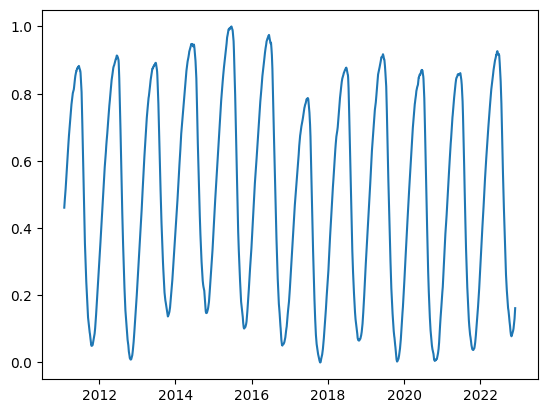

In [14]:
plt.plot(ds.chrono, ds.dataset['X'][:,0,0])

In [65]:
ds.inputs[32]

'SITf t+30 PC0'

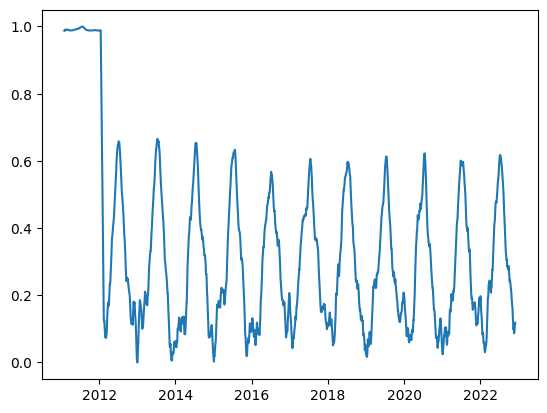

In [57]:
plt.plot(ds.chrono, ds.dataset['X'][:,0,32])

AttributeError: module 'matplotlib.pyplot' has no attribute 'new'

In [15]:
ds.nfeatures

array([48, 52, 56, 56, 48, 52, 32, 52])

In [71]:
ninputs

320

In [77]:
ds.inputs[45]

'2T t-7 PC1'

In [74]:
ds.dataset['Xtrain'].shape

(2582, 5, 64)

In [20]:
# ninputs = len(ds.inputs)

ipc = 2
ninputs = ds.nfeatures[ipc]
ds.create_dataset_PC(var_to_keep = ds.config.input_fields[f'PC{ipc:02d}'])

Scaling...
	Scalers saved as /scratch/project_465000269/edelleo1/Leo/results/lstm_240613-143357/ml/scalers.pkl
New variable selection:
  ['SITf t-30 PC0' 'SITf t-30 PC1' 'SITf t-30 PC2' 'SITf t-30 PC3'
 'SITf t-30 PC4' 'SITf t-30 PC5' 'SITf t-30 PC6' 'SITf t-30 PC7'
 'SITf t-7 PC0' 'SITf t-7 PC1' 'SITf t-7 PC2' 'SITf t-7 PC3'
 'SITf t-7 PC4' 'SITf t-7 PC5' 'SITf t-7 PC6' 'SITf t-7 PC7'
 'SITf t+0 PC0' 'SITf t+0 PC1' 'SITf t+0 PC2' 'SITf t+0 PC3'
 'SITf t+0 PC4' 'SITf t+0 PC5' 'SITf t+0 PC6' 'SITf t+0 PC7'
 'SITf t+7 PC0' 'SITf t+7 PC1' 'SITf t+7 PC2' 'SITf t+7 PC3'
 'SITf t+7 PC4' 'SITf t+7 PC5' 'SITf t+7 PC6' 'SITf t+7 PC7'
 'SITf t+30 PC0' 'SITf t+30 PC1' 'SITf t+30 PC2' 'SITf t+30 PC3'
 'SITf t+30 PC4' 'SITf t+30 PC5' 'SITf t+30 PC6' 'SITf t+30 PC7'
 '2T t-30 PC0' '2T t-30 PC1' '2T t-30 PC2' '2T t-30 PC3' '2T t-7 PC0'
 '2T t-7 PC1' '2T t-7 PC2' '2T t-7 PC3' '2T t+0 PC0' '2T t+0 PC1'
 '2T t+0 PC2' '2T t+0 PC3' '2T t+7 PC0' '2T t+7 PC1' '2T t+7 PC2'
 '2T t+7 PC3' '2T t+30 PC0' '2T t+3

0


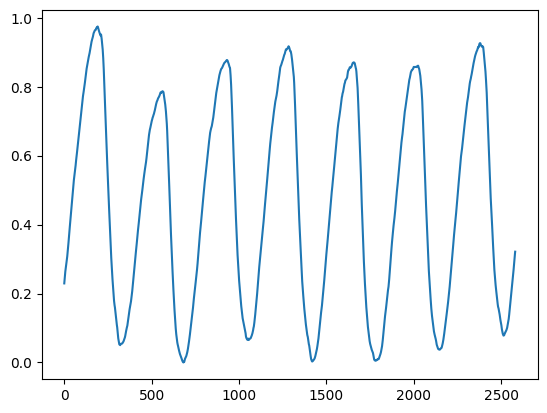

1


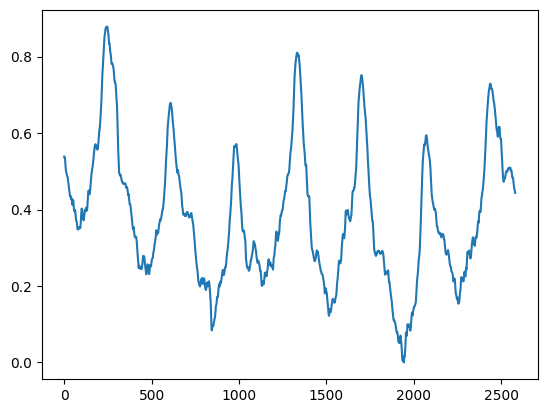

2


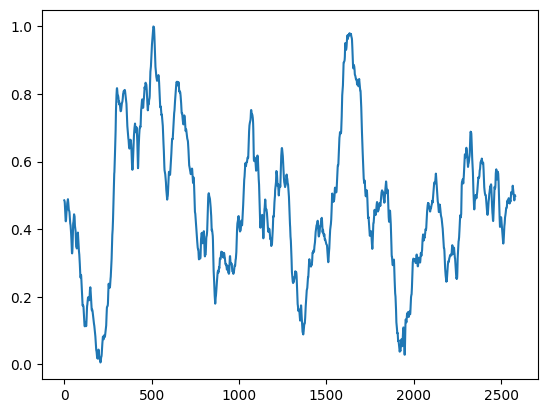

3


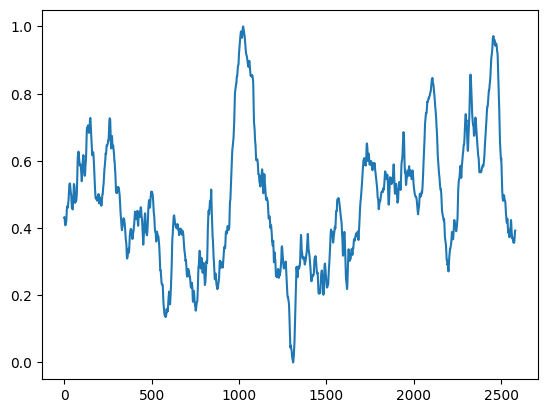

4


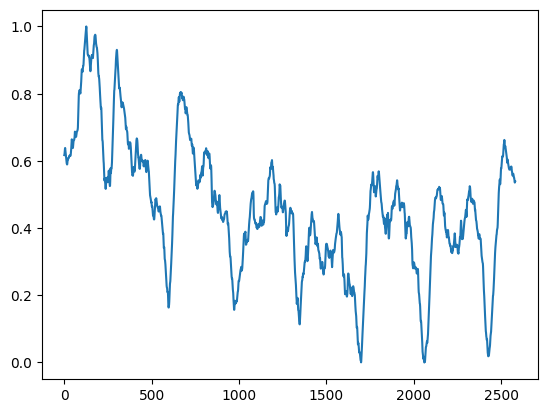

5


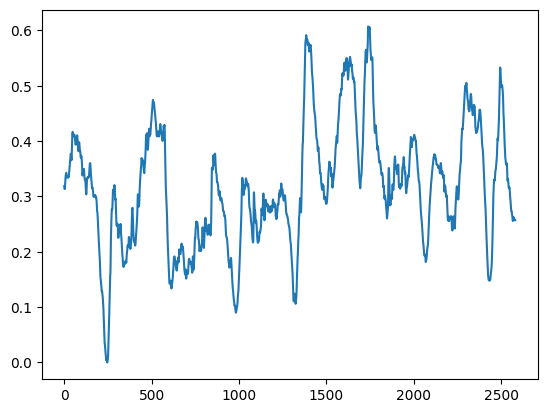

6


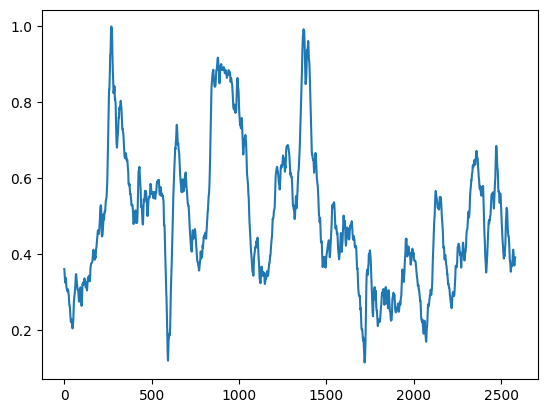

7


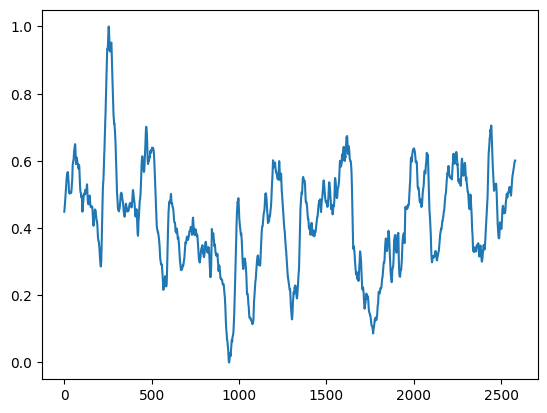

8


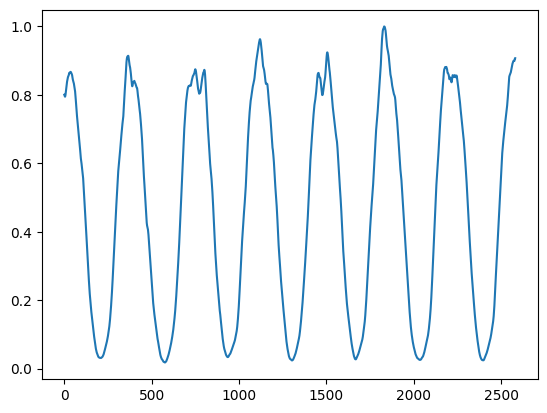

9


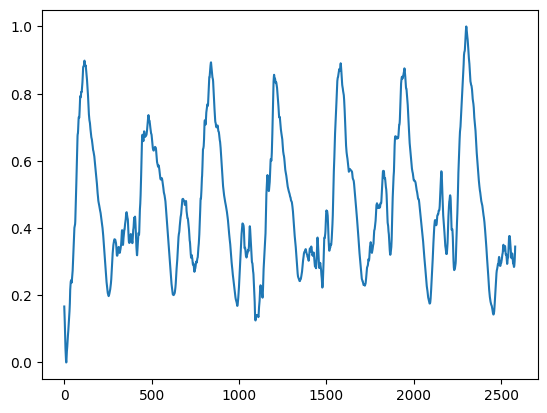

10


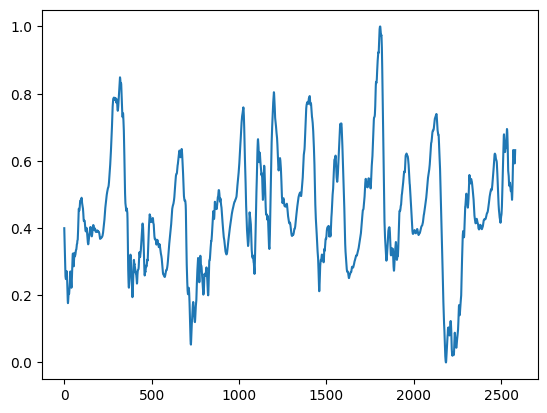

11


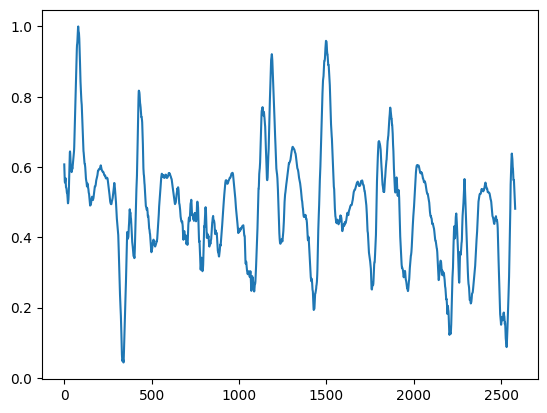

12


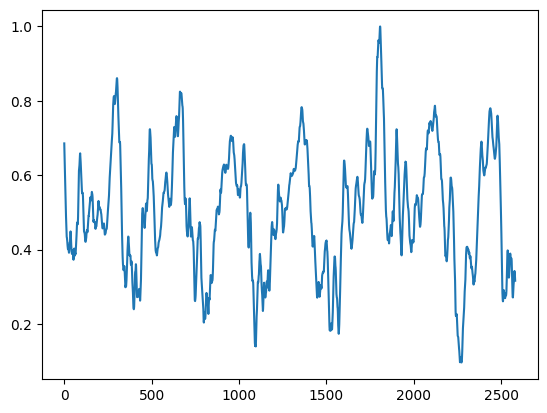

13


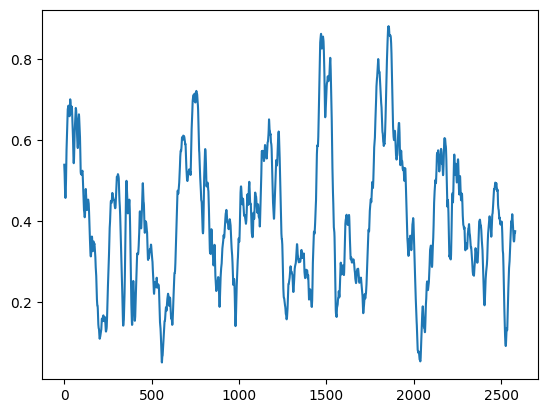

14


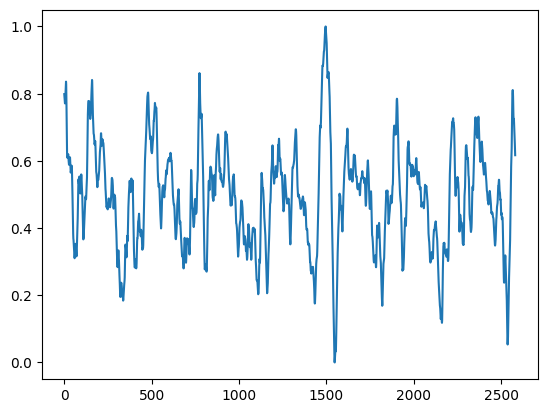

15


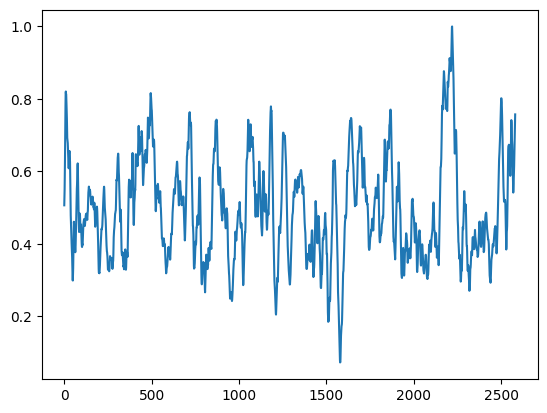

16


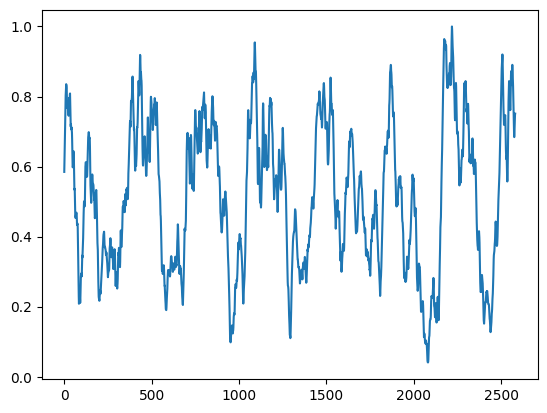

17


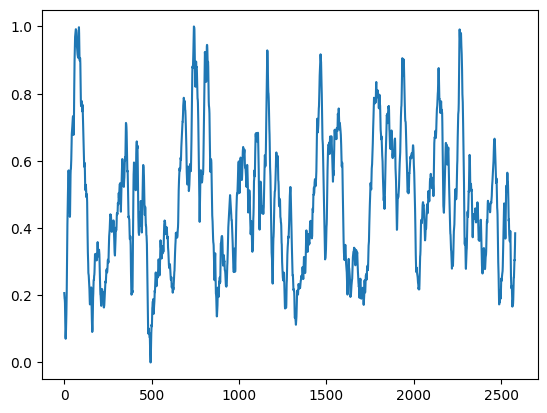

18


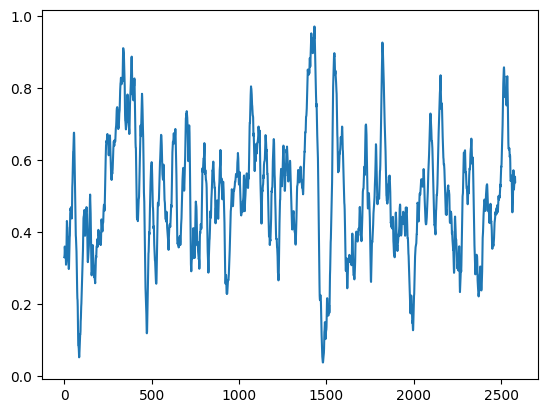

19


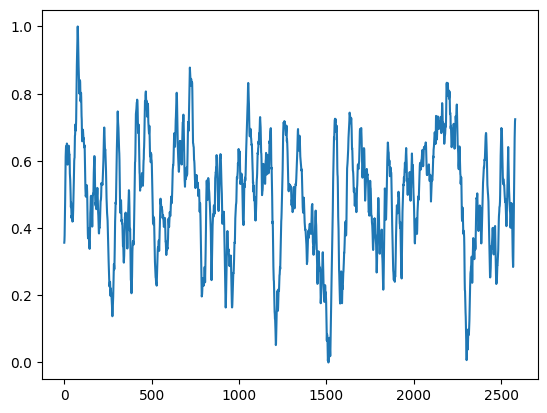

20


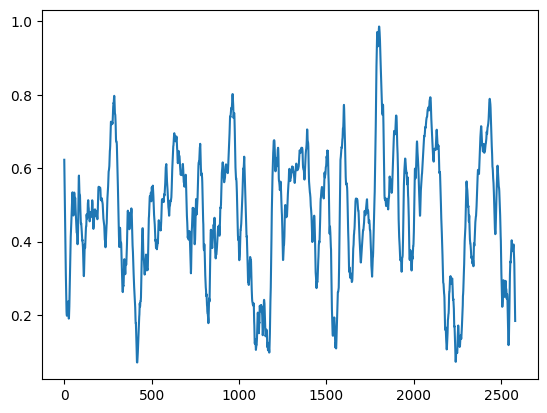

21


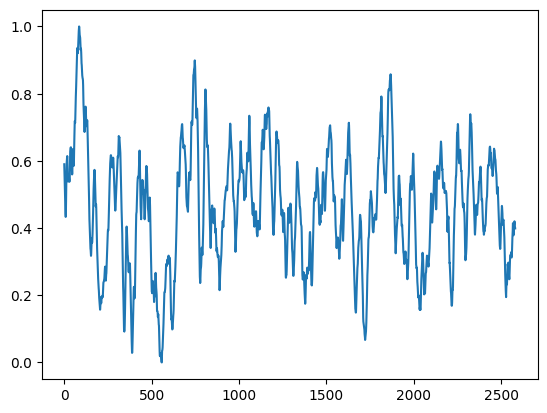

22


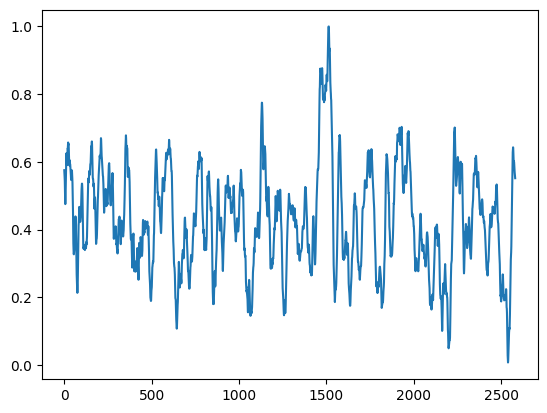

23


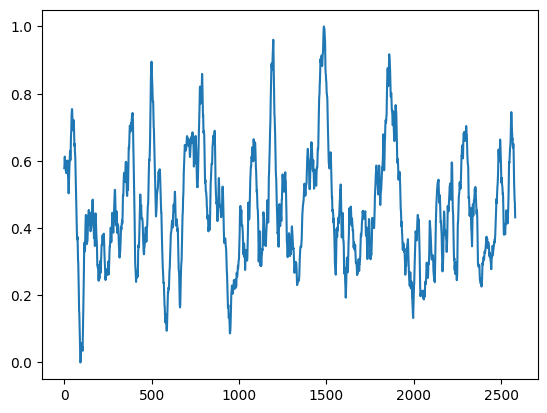

24


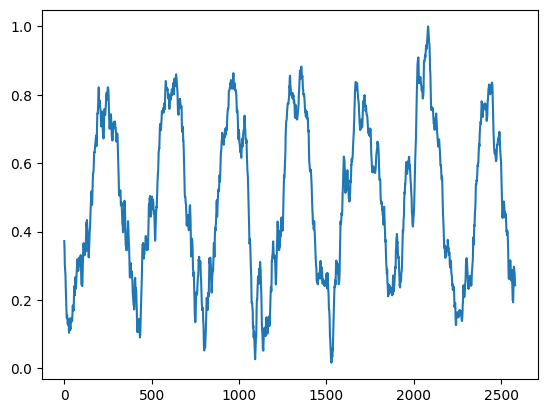

25


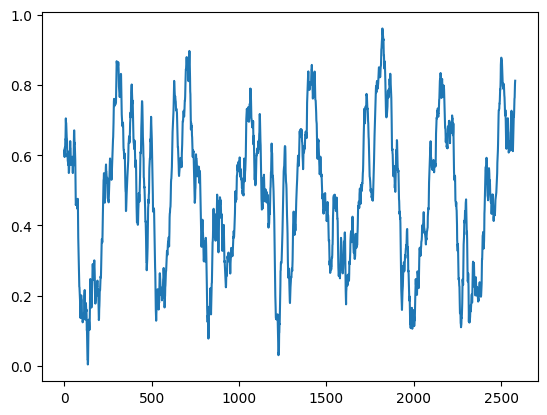

26


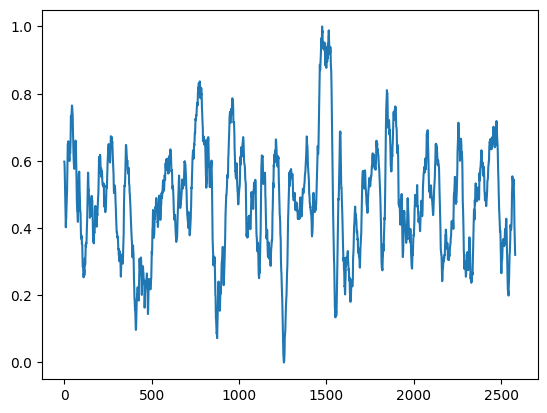

27


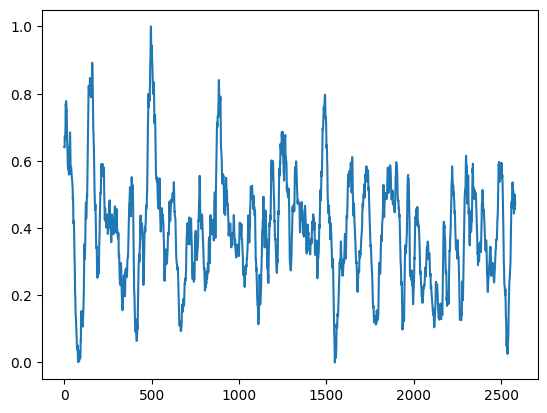

28


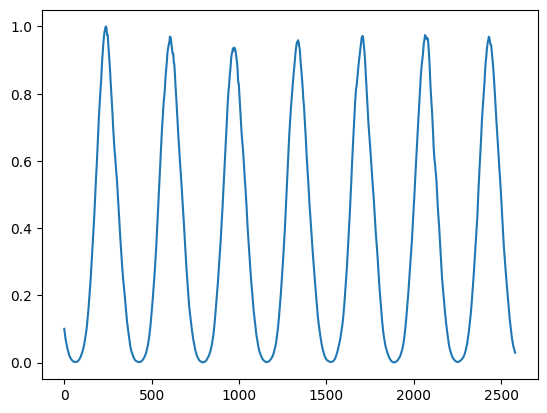

29


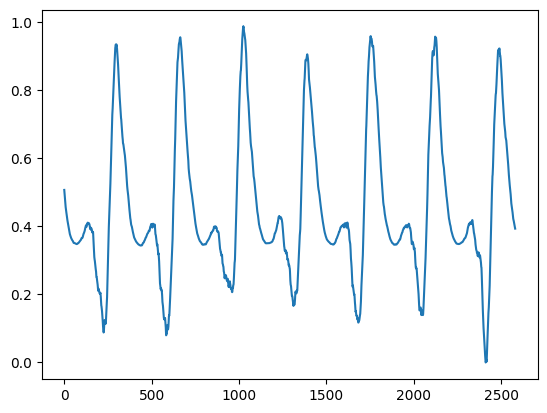

30


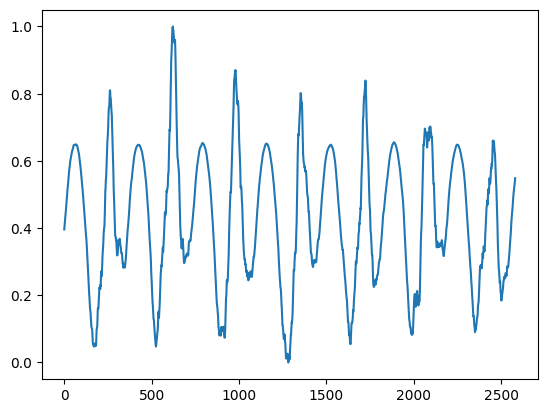

31


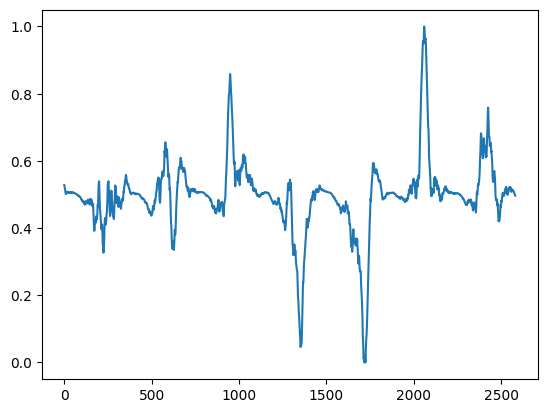

32


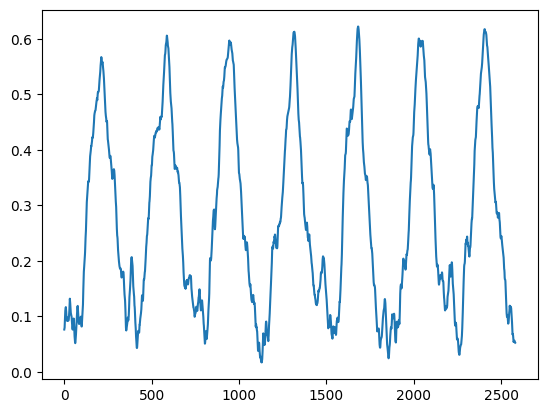

33


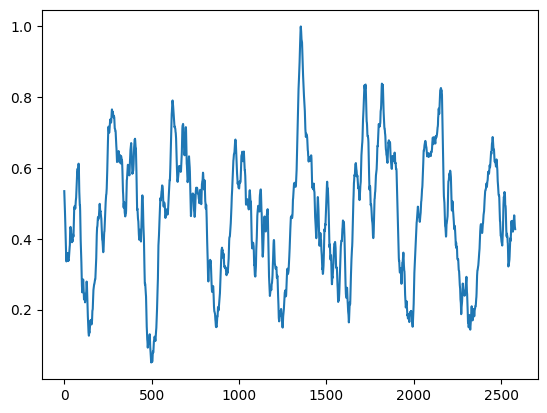

34


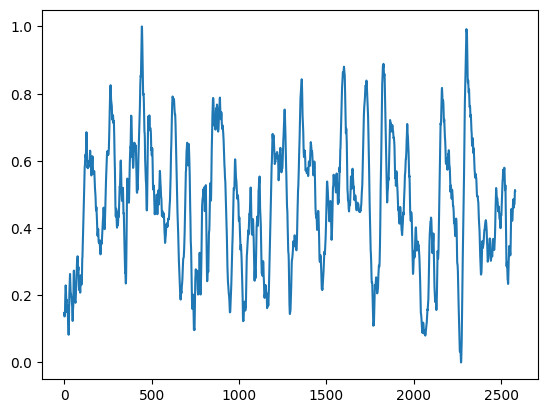

35


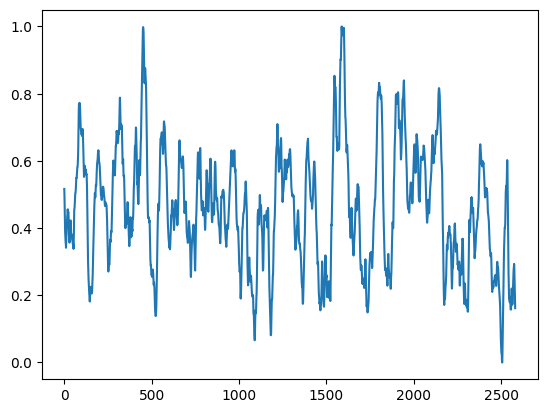

36


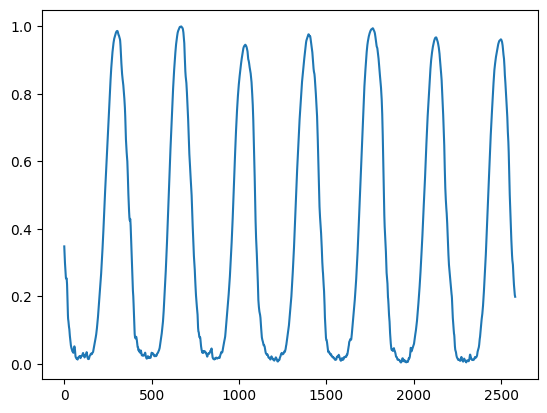

37


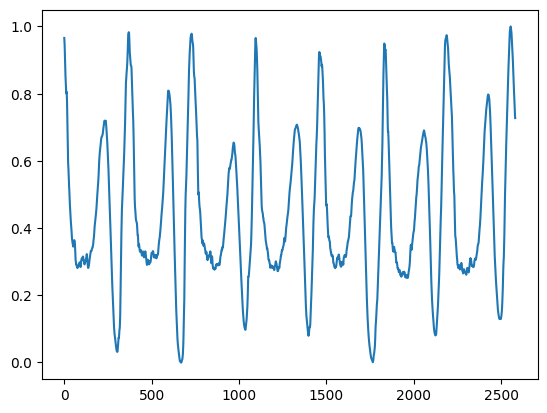

38


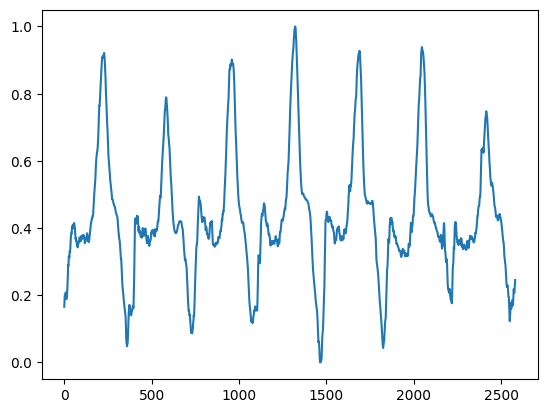

39


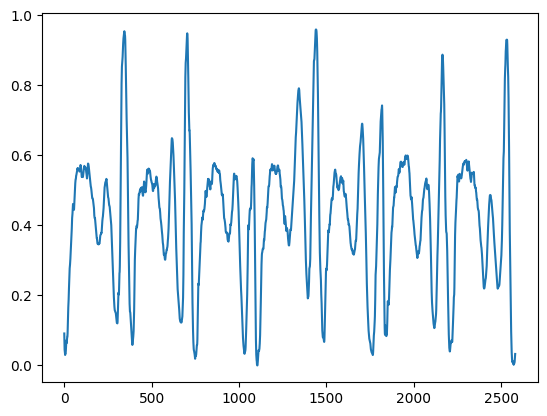

40


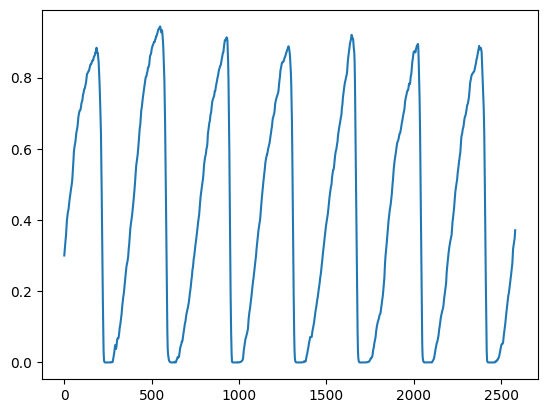

41


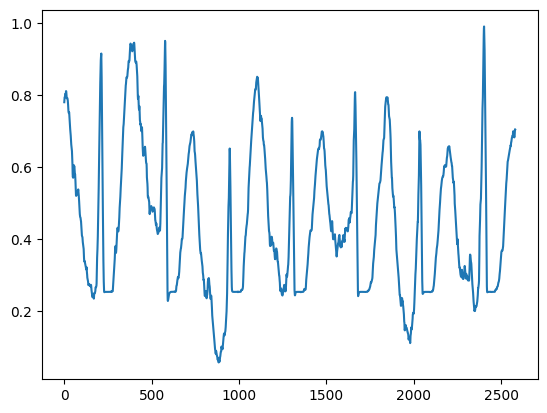

42


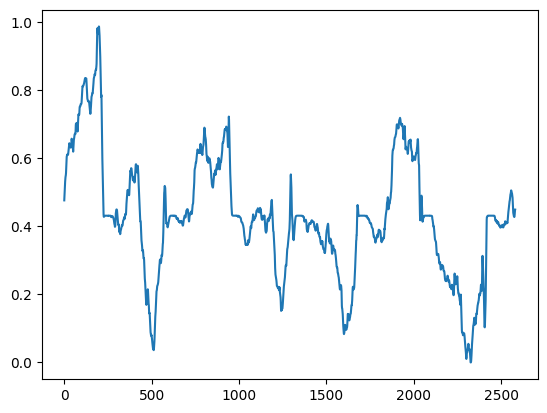

43


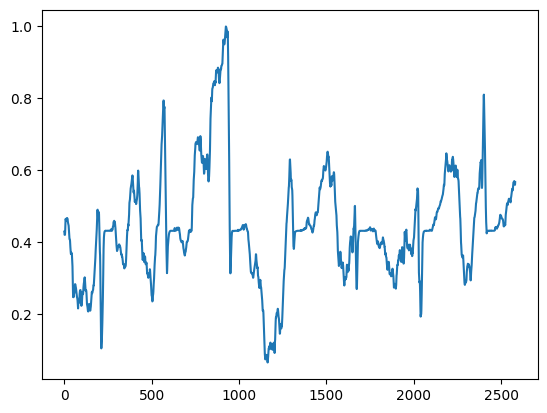

44


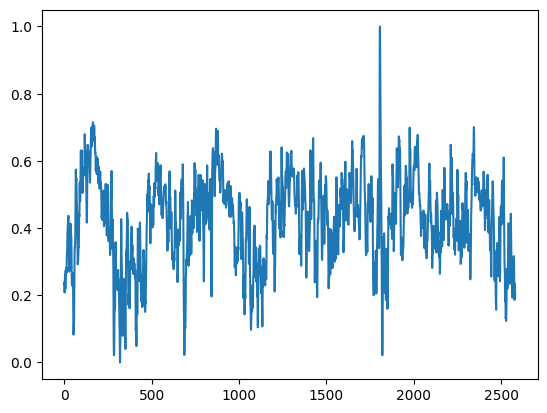

45


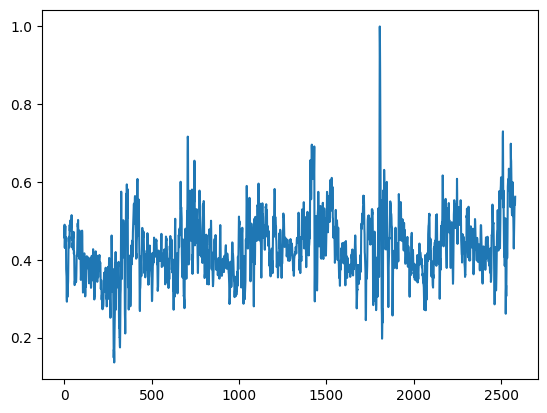

46


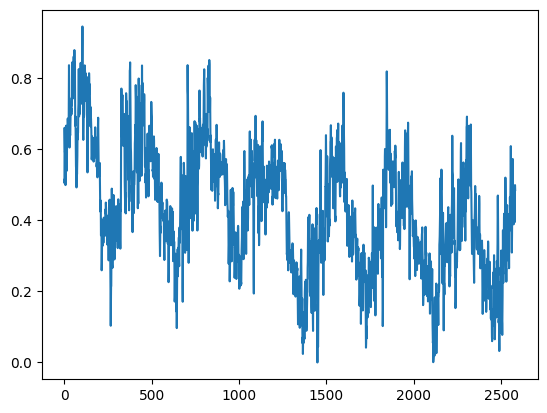

47


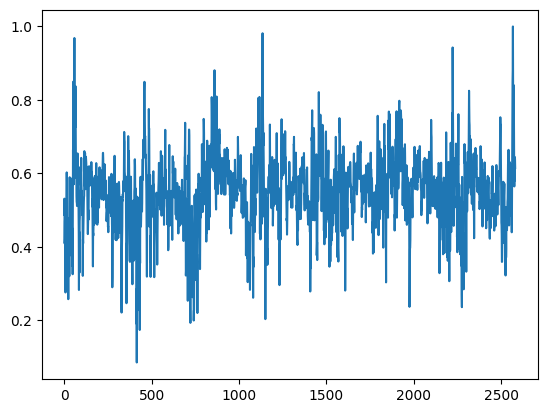

48


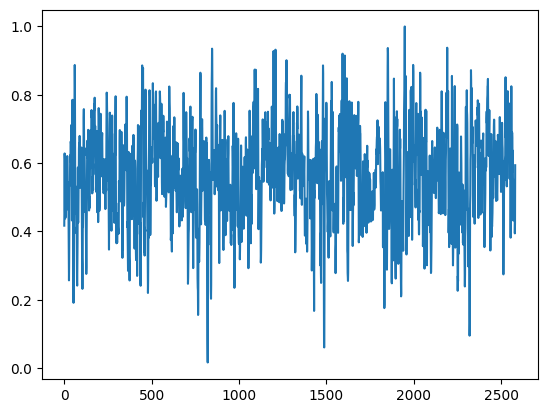

49


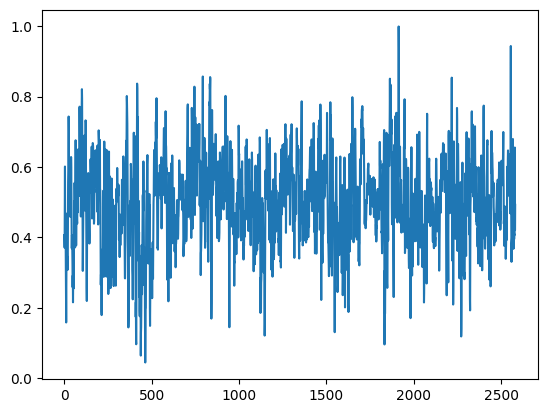

50


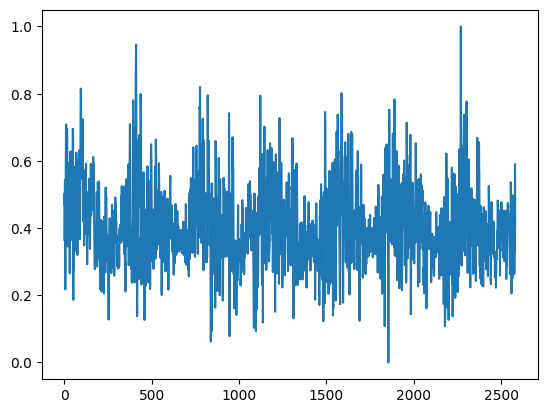

51


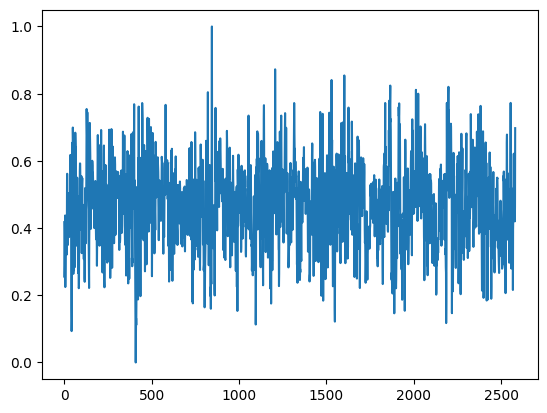

52


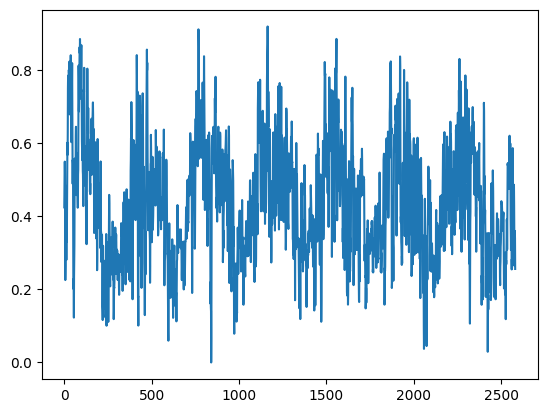

53


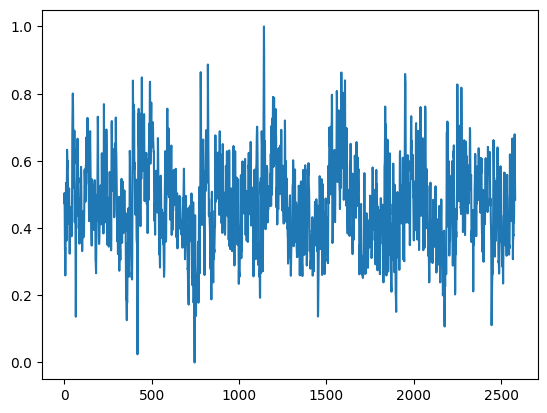

54


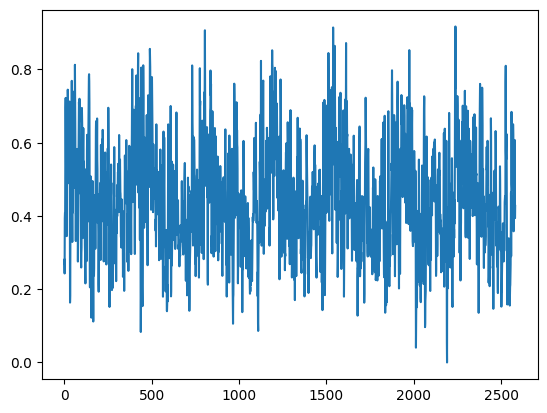

In [21]:
for i in range(ninputs-1):
    print(i)
    plt.plot(ds.dataset['Xtrain'][:,ipc,i])
    plt.show()
    

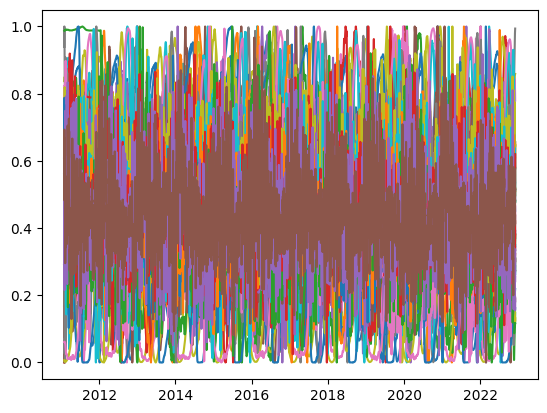

In [23]:
plt.plot(ds.chrono, ds.dataset['X'][:,0,:]);

# __________________________________________________________________

In [13]:
ds.history.__dict__

{'config': <src.utils.reload_config.Config at 0x7fb0641f7a90>,
 'verbose': 1,
 'params': {'bias': {'H': [1, 8, 15, 22]},
  'covar': {'H': {'siconc': [-30, -7, 0, 7, 30],
    'sisnthick': [-30, -7, 0, 7, 30],
    'vxsi': [-30, -7, 0, 7, 30],
    'vysi': [-30, -7, 0, 7, 30],
    'zos': [-30, -7, 0, 7, 30]}},
  'forcing': {'H': {'10U': [-30, -7, 0, 7, 30],
    '10V': [-30, -7, 0, 7, 30],
    '2T': [-30, -7, 0, 7, 30],
    'MSL': [-30, -7, 0, 7, 30],
    'SSR': [-30, -7, 0, 7, 30],
    'STR': [-30, -7, 0, 7, 30],
    'TP': [-30, -7, 0, 7, 30]}},
  'keras': {'H': [-30, -7, 0, 7, 30]},
  'noass': {'H': [-30, -7, 0, 7, 30]}},
 'needpast': 30,
 'needfutur': 30}

In [13]:
conf.input_fields['PC0']

KeyError: 'PC0'

In [ ]:
ds.nfeatures

In [ ]:
ds.create_dataset_PC(var_to_keep=conf.input_fields['PC0'])

In [ ]:
ds.dataset['X'].shape

In [ ]:
ds.dataset['Xtrain'].shape

# ____________________________________________________________

## GridSearchCV or RandomizedSearchCV for LSTM

In [20]:
from sklearn.model_selection import RandomizedSearchCV

In [21]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [27]:
import keras_tuner

In [59]:
import keras
from tensorflow.keras.layers import Input, LSTM, Dense, Bidirectional, Attention, Flatten
from tensorflow.keras.layers import *
import tensorflow_addons as tfa


In [75]:
def build_model(hp): #, timesteps, features, ipc):
    '''Hyper parameters search
    '''
    
    units = hp.Int("units", min_value = 32, max_value=512, step=32)
    batch_size = hp.Int("batch_size", min_value = 4, max_value=52, step=4)
    epochs = hp.Int("epochs", min_value = 10, max_value=100, step=10)

#     model = mdl_3LSTM_bk(timesteps, features, ipc,
#                          units=units)
    model = mdl_3LSTM_bk(units=units)
    
    return model
    
    
def mdl_3LSTM_bk(units):
#     timesteps, features, ipc,
    '''
    Parameters:
    -----------

        ipc     : int, number of PC to predict (between 0 and maximum PC)
    '''

    
    
    model = keras.Sequential()
    model.add(LSTM(units=units, return_sequences=True, input_shape = (5, 56), go_backwards=True))
    model.add(Dropout(0.1))

#         model.add(LSTM(units=self.units, return_sequences=True))
    model.add(LSTM(units=units, return_sequences=True, go_backwards=True))
    model.add(Dropout(0.1))

#         model.add(LSTM(units=self.units))
    model.add(LSTM(units=units, go_backwards=True))
    model.add(Dropout(0.1))

    model.add(Dense(units=1))

    opt = tf.keras.optimizers.Adam(learning_rate=3e-4)
    model.compile(optimizer=opt, loss='mse', metrics=[tfa.metrics.RSquare(), tf.keras.metrics.RootMeanSquaredError()])


    print('Compiled !')
    return model

In [76]:
pr = build_model(keras_tuner.HyperParameters())

Compiled !


In [85]:
pr

In [89]:
# , m4.timesteps, m4.features, 0

tuner = keras_tuner.RandomSearch(hypermodel=build_model(keras_tuner.HyperParameters()),
                                objective='val_loss',
                                max_trials=3)

Compiled !


TypeError: Inputs to a layer should be tensors. Got: <keras_tuner.engine.hyperparameters.hyperparameters.HyperParameters object at 0x7feedc0afdc0>

In [84]:
tuner.search(ds.dataset['Xtrain'], ds.dataset['ytrain'][:,0], epochs=4, 
             validation_data=(ds.dataset['Xval'], ds.dataset['yval'][:,0]))

NameError: name 'tuner' is not defined

# ____________________________________________________________

In [8]:
# -----------------------------------------------------------

regularizers = [L1L2(l1=0, l2=0)]  # [L1L2(l1=0, l2=0), L1L2(l1=0.01, l2=0), L1L2(l1=0, l2=0.01), L1L2(l1=0.1, l2=0.1)]

n_components = ds.config.n_comp['tp']


ireg = 0
reg = regularizers[ireg]
suffixe = f'_reg{ireg}'

In [82]:
reload(model_lstm)

<module 'src.modelling.model_lstm' from '/users/edelleo1/tardis/tardis-ml/src/modelling/model_lstm.py'>

In [83]:
conf.ml_name = 'LSTM_bi2'  # test'  # 'LSTM_bk'  # 'LSTM3_bk_at'

In [84]:
            
# n_output = ds[0]['ytrain'].shape[0]
# m4 = model_lstm.ModelLSTM(ds, ds.dataset['Xtrain'].shape[1], ds.dataset['Xtrain'].shape[2], reg=reg, rootdir=ds.config.rootdir, ml_dir=ds.config.ml_dir, fig_dir=ds.config.fig_dir)


m4 = model_lstm.ModelLSTM(ds, ds.dataset['Xtrain'].shape[1], ds.nfeatures, reg=reg, rootdir=ds.config.rootdir, ml_dir=ds.config.ml_dir, fig_dir=ds.config.fig_dir)

In [85]:
ds.nfeatures

array([56, 60, 64, 64, 56, 60, 40, 60])

In [86]:
m4.compile_models(name=conf.ml_name, npca=n_components)  # >>> check that

ML Architecture selected: LSTM_bi2
Compiled !
Compiled !
Compiled !
Compiled !
Compiled !
Compiled !
Compiled !
Compiled !


In [87]:
m4.features

array([56, 60, 64, 64, 56, 60, 40, 60])

In [88]:
m4.print_summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.

In [ ]:
m4.fit_multiple(ds.dataset, suffix=suffixe)

Creation of /scratch/project_465000269/edelleo1/Leo/results/lstm_240605-143554/ml/logs_20240605-173713
Fitting...
Scaling...
	Scalers saved as /scratch/project_465000269/edelleo1/Leo/results/lstm_240605-143554/ml/scalers.pkl
New variable selection:
  ['SITf t-30 PC0' 'SITf t-30 PC1' 'SITf t-30 PC2' 'SITf t-30 PC3'
 'SITf t-30 PC4' 'SITf t-30 PC5' 'SITf t-30 PC6' 'SITf t-30 PC7'
 'SITf t-21 PC0' 'SITf t-21 PC1' 'SITf t-21 PC2' 'SITf t-21 PC3'
 'SITf t-21 PC4' 'SITf t-21 PC5' 'SITf t-21 PC6' 'SITf t-21 PC7'
 'SITf t-14 PC0' 'SITf t-14 PC1' 'SITf t-14 PC2' 'SITf t-14 PC3'
 'SITf t-14 PC4' 'SITf t-14 PC5' 'SITf t-14 PC6' 'SITf t-14 PC7'
 'SITf t-7 PC0' 'SITf t-7 PC1' 'SITf t-7 PC2' 'SITf t-7 PC3'
 'SITf t-7 PC4' 'SITf t-7 PC5' 'SITf t-7 PC6' 'SITf t-7 PC7'
 'SITf t+0 PC0' 'SITf t+0 PC1' 'SITf t+0 PC2' 'SITf t+0 PC3'
 'SITf t+0 PC4' 'SITf t+0 PC5' 'SITf t+0 PC6' 'SITf t+0 PC7'
 'SITf t+7 PC0' 'SITf t+7 PC1' 'SITf t+7 PC2' 'SITf t+7 PC3'
 'SITf t+7 PC4' 'SITf t+7 PC5' 'SITf t+7 PC6' 'SITf t+

Config file updated 'ntest': /scratch/project_465000269/edelleo1/Leo/results/lstm_240605-143554/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia_TimeLagx2_LSTM_bi.yaml
Dataset Format for lstm
Config file updated 'needfutur': /scratch/project_465000269/edelleo1/Leo/results/lstm_240605-143554/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia_TimeLagx2_LSTM_bi.yaml
Config file updated 'needpast': /scratch/project_465000269/edelleo1/Leo/results/lstm_240605-143554/config_default_2023_adjSIC_full_pm1M_batch32-opti1-v2-sia_TimeLagx2_LSTM_bi.yaml
Dataset formatted from (4323, 504) to (4323, 9, 56) for H=[-30, -21, -14, -7, 0, 7, 14, 21, 30].


In [ ]:
m4.print_histories()

# once fit_multiple has find the optimal parameters,
# we retrain ML algorithm by including the validation period
m4.retrain_wval(ds.dataset)


if conf.setup == 'default':
    m4.predict_multiple_wbias(ds.dataset)
else:
    m4.predict_multiple(ds.dataset)
m4.save_prediction()

m4.save_model_weights()


# retrained with test period. For application prior to 2011
m4.retrain_wtest(ds.dataset)
m4.save_model_weights(retrained=True)

In [ ]:
ofile = f'{m4.type}_ypred.png'
mdl_ypred_PCA.draw(m4, max_plot=n_components, odir=m4.rootdir+m4.fig_dir, savefig=True, showfig=False, ofile=ofile)

# ___________________________________________________________________

# Old versions:

In [ ]:
import xarray as xr
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
import yaml
import pickle as pkl
import subprocess
from keras.regularizers import L1L2


from src.data_preparation import mdl_dataset_prep as dataset_prep

import src.utils.load_config as load_config
import src.data_preparation.load_data as load_data
import src.feature_extraction.pca as feature_pca
import src.visualization.visualize_pca as visualize_pca
from src.visualization import visualize_sit_corr as vsc
from src.visualization import mdl_introspect
from src.visualization import mdl_ypred_PCA

from src.data_preparation.blocking_time_series_split import BlockingTimeSeriesSplit 
from src.data_preparation import mdl_dataset_prep
from src.modelling import mdl_input_dico  # input variables class
from src.modelling import mdl_params  # parameters class

from src.modelling import model_cnn

import src.utils.tardisml_utils as tardisml_utils
rootdir = tardisml_utils.get_rootdir()

2023-12-11 15:46:20.427840: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
# Date to plot in example
idate = 100
# Path to config file
file_config = '../config/data_proc_full.yaml'
# Path to template file
file_template = '../config/template_name.yaml'

template = yaml.load(open(file_template),Loader=yaml.FullLoader)
load_config.update_config(file_config, verbose=True)
nosit_dir, withsit_dir, _, forcing_bdir, pca_dir, res_dir, fig_dir, ml_dir, _ = load_config.load_filename(file_config, verbose=True)
timeofday, target_field, forcing_fields, covar_fields, lim_idm, lim_jdm, n_comp = load_config.load_config_params(file_config)
ml_model, nseq, params = load_config.load_ml_params(file_config)

In [ ]:
# copy config file to results
subprocess.run(['cp', f'{file_config}', f'{rootdir+res_dir}'])

In [ ]:
# ---------------------------------------------------
#                 Loading data
# ---------------------------------------------------
print('Loading data...')
Xf, PCs_f, Xe, PCs_e, PCs_co, PCs_fo, dsCo, dsFo, chrono = load_data.load_dataset_PCA(file_config, return_raw=True, freerun=True)

data = (Xf, PCs_f, Xe, PCs_e, PCs_co, PCs_fo, dsCo, dsFo, chrono)

Loading data...
Retrieve siconc
Retrieve sisnthick
Retrieve vxsi
Retrieve vysi
Retrieve zos
Loading forcing values...
Loading pca...
Apply land/ocean mask...
Retrieve PCs and EOFs


In [ ]:
# ---------------------------------------------------
#                 Preparing the dataset
# ---------------------------------------------------

print('Preparting the dataset...')

history_param = {}

history_param['bias'] = {}
history_param['noass'] = {}
history_param['forcing'] = {}
history_param['covar'] = {}

history_param['bias']['H'] = [1]
history_param['bias']['H_neg'] = 0

history_param['noass']['H'] = [1]
history_param['noass']['H_neg'] = 0

history_param['forcing']['names'] = forcing_fields
history_param['forcing']['to_explore'] = ['2T', 'TP']
history_param['forcing']['must_be'] = [1]
history_param['forcing']['interval'] = 7
history_param['forcing']['nexplo'] = 4

history_param['covar']['names'] = covar_fields
history_param['covar']['to_explore'] = ['sisnthick']
history_param['covar']['must_be'] = [1]
history_param['covar']['interval'] = 7
history_param['covar']['nexplo'] = 4


Xi, y, chrono, inputs = mdl_dataset_prep.data_to_dataset(data, history_param)

In [ ]:
# scale between 0 and 1
X = mdl_dataset_prep.scale_data_var(Xi)

In [ ]:
# splitting the dataset
# ntrain, nval, ntest = mdl_dataset_prep.dataset_split(X.shape[0])

In [ ]:
from src.modelling import model_lstm
from src.modelling import super_model_dl

In [ ]:
print('Formatting the dataset...')

# H = [0,7,14,21,28, 35, 42, 49, 56, 63, 70, 77]
H = [1,8,15,22]

In [ ]:
# ds0 = model_cnn.build_dataset_1pt(X, y, chrono, train_p=.65, val_p=0.15, times=H) # H

In [ ]:
from src.data_preparation import mdl_dataset_format

In [ ]:
reload(mdl_dataset_format)

In [14]:
ds = mdl_dataset_format.build_dataset_1pt(X, y, chrono, train_p=.65, val_p=0.15, times=H)

In [15]:
# Variables to keep for CNN
most_imp = ['SITf t+0', 'sisnthick t+0', '2T t+0', '2T t+8', 'MSL t+0', 'TP t+0', 'TP t+8', 'siconc t+0']
indexes = []
for mi in most_imp:
    for idx, lb in enumerate(inputs):
        if mi in lb:
            indexes.append(idx)
            
var_name = np.array(inputs)[indexes]

In [16]:
# select only variables to keep
ds[0]['Xtrain'] = ds[0]['Xtrain'][:,:, indexes]
ds[0]['Xval'] = ds[0]['Xval'][:,:, indexes]
ds[0]['Xtest'] = ds[0]['Xtest'][:,:, indexes]

In [17]:
# dataset final
fds = {}
fds[0] = ds[0].copy()

regularizers = [L1L2(l1=0.01, l2=0), L1L2(l1=0, l2=0.01), L1L2(l1=0.1, l2=0.1)]

-------------

In [48]:
from importlib import reload

In [127]:
reload(model_lstm);

In [128]:
reload(super_model_dl);

In [129]:
n_components = 2

In [130]:
ntvt = (ds[0]['ntrain'], ds[0]['nval'], ds[0]['ntest'])

In [131]:
m1 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir, ntvt=ntvt)
m1.compile_models('LSTM3_bk', npca=n_components)


Compiled !
Compiled !


In [132]:
m1.fit_multiple(ds, epochs=2, batch_size=4)  # 128)

Fitting...
pc0 Training finished !
pc1 Training finished !


In [133]:
m1.predict_multiple(ds)

94/94 [==============================] - 2s 3ms/step
Prediction finished !!


In [134]:
m1.ytrue = m1.ytrue[:,:2]

In [135]:
m1.ypred = m1.ypred[:,:2]

In [136]:
m1.ytrue.shape

(2991, 2)

In [137]:
m1.ypred.shape

(2991, 2)

In [138]:
m1.save_prediction()

Save prediction as .nc
Ytrue saved as: /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221201-163104/ml/ypred_LSTM3_bk_01.nc


In [41]:
m1.save_model()

Saving models...


INFO:tensorflow:Assets written to: model_LSTM3_bk_2N_PC0/assets


INFO:tensorflow:Assets written to: model_LSTM3_bk_2N_PC0/assets


Saved as: model_LSTM3_bk_2N_PC0


INFO:tensorflow:Assets written to: model_LSTM3_bk_2N_PC1/assets


INFO:tensorflow:Assets written to: model_LSTM3_bk_2N_PC1/assets


Saved as: model_LSTM3_bk_2N_PC1


In [74]:
m1.chrono.to_numpy()

array([['2011-10-01T00:00:00.000000000'],
       ['2011-10-02T00:00:00.000000000'],
       ['2011-10-03T00:00:00.000000000'],
       ...,
       ['2019-12-06T00:00:00.000000000'],
       ['2019-12-07T00:00:00.000000000'],
       ['2019-12-08T00:00:00.000000000']], dtype='datetime64[ns]')

In [95]:
type(m1.chrono)

pandas.core.frame.DataFrame

In [87]:
m1.chrono.date.to_pydatetime()

AttributeError: 'Series' object has no attribute 'to_pydatetime'

In [92]:
sr = pd.date_range('2011-10-01',periods=2990,freq='D')

In [104]:
sr2 = pd.date_range(m1.chrono.to_numpy()[0][0], m1.chrono.to_numpy()[-1][0])

In [105]:
sr2.to_pydatetime()

array([datetime.datetime(2011, 10, 1, 0, 0),
       datetime.datetime(2011, 10, 2, 0, 0),
       datetime.datetime(2011, 10, 3, 0, 0), ...,
       datetime.datetime(2019, 12, 6, 0, 0),
       datetime.datetime(2019, 12, 7, 0, 0),
       datetime.datetime(2019, 12, 8, 0, 0)], dtype=object)

In [93]:
sr

DatetimeIndex(['2011-10-01', '2011-10-02', '2011-10-03', '2011-10-04',
               '2011-10-05', '2011-10-06', '2011-10-07', '2011-10-08',
               '2011-10-09', '2011-10-10',
               ...
               '2019-11-28', '2019-11-29', '2019-11-30', '2019-12-01',
               '2019-12-02', '2019-12-03', '2019-12-04', '2019-12-05',
               '2019-12-06', '2019-12-07'],
              dtype='datetime64[ns]', length=2990, freq='D')

In [94]:
sr.to_pydatetime()

array([datetime.datetime(2011, 10, 1, 0, 0),
       datetime.datetime(2011, 10, 2, 0, 0),
       datetime.datetime(2011, 10, 3, 0, 0), ...,
       datetime.datetime(2019, 12, 5, 0, 0),
       datetime.datetime(2019, 12, 6, 0, 0),
       datetime.datetime(2019, 12, 7, 0, 0)], dtype=object)

In [82]:
pd.to_datetime(m1.chrono)

ValueError: to assemble mappings requires at least that [year, month, day] be specified: [day,month,year] is missing

In [75]:
from netCDF4 import date2num

In [77]:
time_unit_out = "days since 1991-01-01 00:00:00"

In [107]:
date2num(sr2.to_pydatetime(), time_unit_out)

array([ 7578,  7579,  7580, ..., 10566, 10567, 10568])

------

In [25]:
# test import

In [62]:
m2 = model_lstm.ModelLSTM(None, None) # ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir, ntvt=ntvt)

In [71]:
m2 = super_model_dl.SModelDL() # ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir, ntvt=ntvt)

In [72]:
ipath = ''
ifolder = 'model_LSTM3_bk_2N'
m2.npca = 2
m2.load_model(ipath, ifolder)

Loading model...
Loaded: model_LSTM3_bk_2N_PC0
Loaded: model_LSTM3_bk_2N_PC1


In [64]:
m2.models

{'pc0': <keras.engine.sequential.Sequential at 0x2b0ce407f040>,
 'pc1': <keras.engine.sequential.Sequential at 0x2b0ce5169eb0>}

In [ ]:
m2.

------

In [90]:
import netCDF4 as nc4

In [91]:
filename = 'ypred_LSTM3_bk.nc'
nc = nc4.Dataset(filename, mode='r')

In [93]:
X = xr.open_dataset(xr.backends.NetCDF4DataStore(nc))['ypred']

In [96]:
X['time']

<xarray.DataArray 'time' (time: 2991)>
array(['2011-10-01T00:00:00.000000000', '2011-10-02T00:00:00.000000000',
       '2011-10-03T00:00:00.000000000', ..., '2019-12-06T00:00:00.000000000',
       '2019-12-07T00:00:00.000000000', '2019-12-08T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2011-10-01 2011-10-02 ... 2019-12-08

In [97]:
chrono = pd.DataFrame({'date':pd.to_datetime(X['time'].to_numpy())})


In [98]:
chrono

,date
0,2011-10-01
1,2011-10-02
2,2011-10-03
3,2011-10-04
4,2011-10-05
...,...
2986,2019-12-04
2987,2019-12-05
2988,2019-12-06
2989,2019-12-07


In [155]:
# m1.ytrue = m1.ytrue[:-1]
m1.chrono = ds[0]['chrono'][:-1]

In [120]:
reload(mdl_ypred_PCA)

<module 'src.visualization.mdl_ypred_PCA' from '/cluster/home/leoede/tardis/tardis-ml/src/visualization/mdl_ypred_PCA.py'>

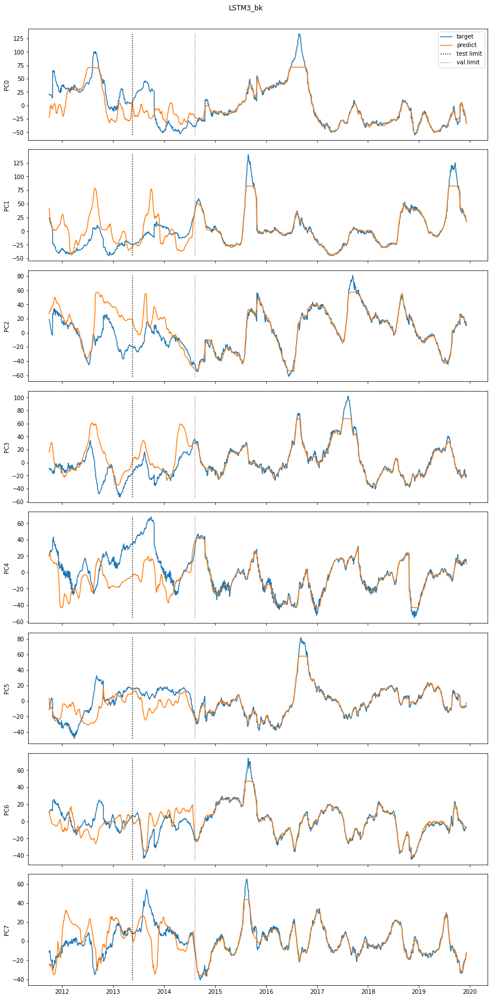

In [156]:
mdl_ypred_PCA.draw(m1, odir=m1.rootdir+m1.fig_dir, savefig=False, showfig=True, ofile='')

------------

In [39]:
from src.visualization import mdl_non_recursive

In [40]:
m1.nfeat = 8

In [41]:
m1.ypredict = m1.ypred
m1.y = m1.ytrue[:-1]
m1.chrono = ds[0]['chrono'][:-1]

In [42]:
m1.ntest = ntrain

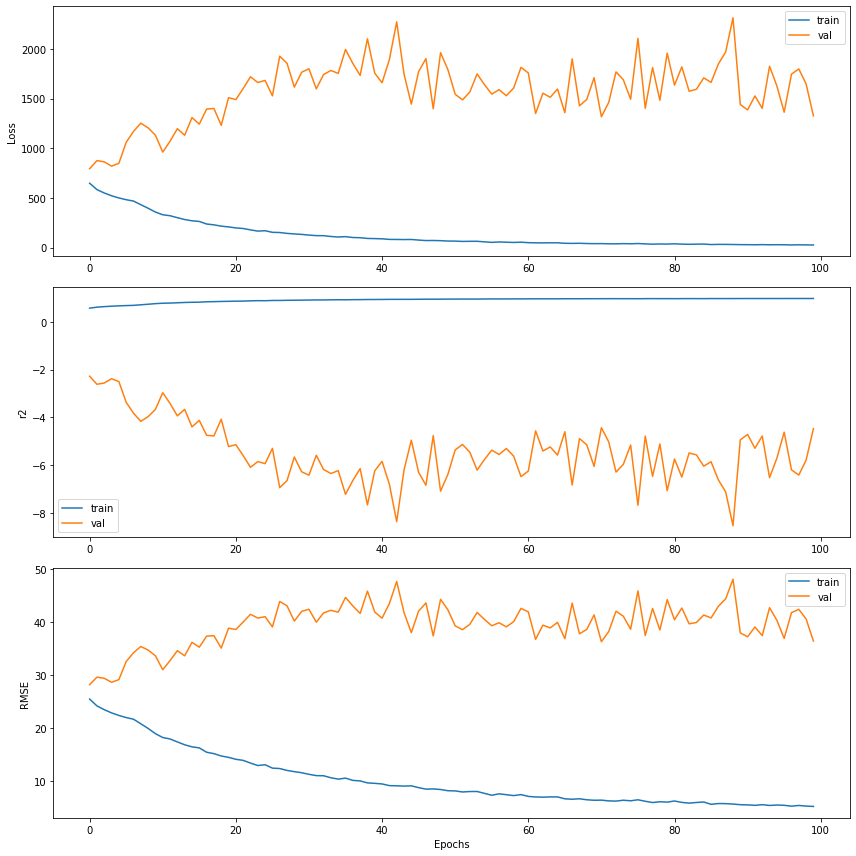

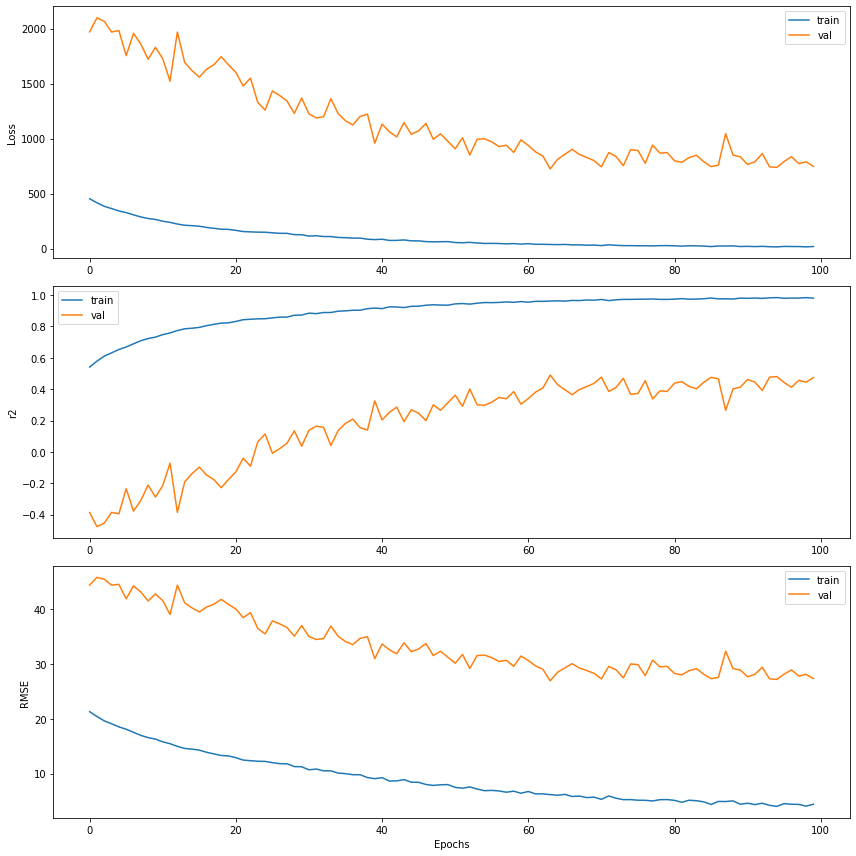

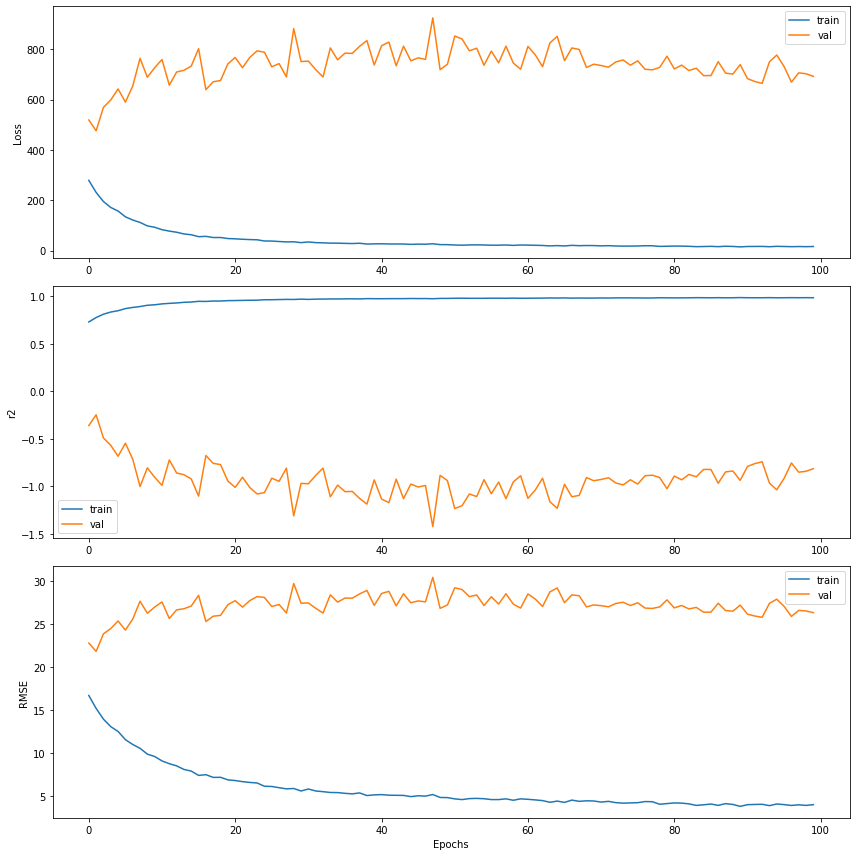

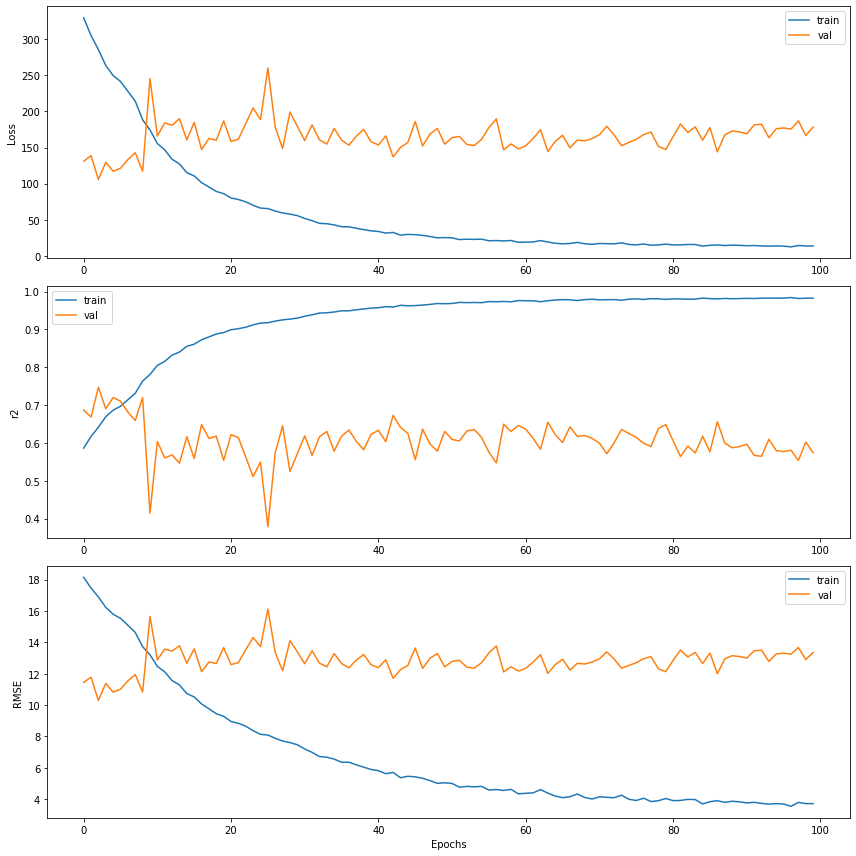

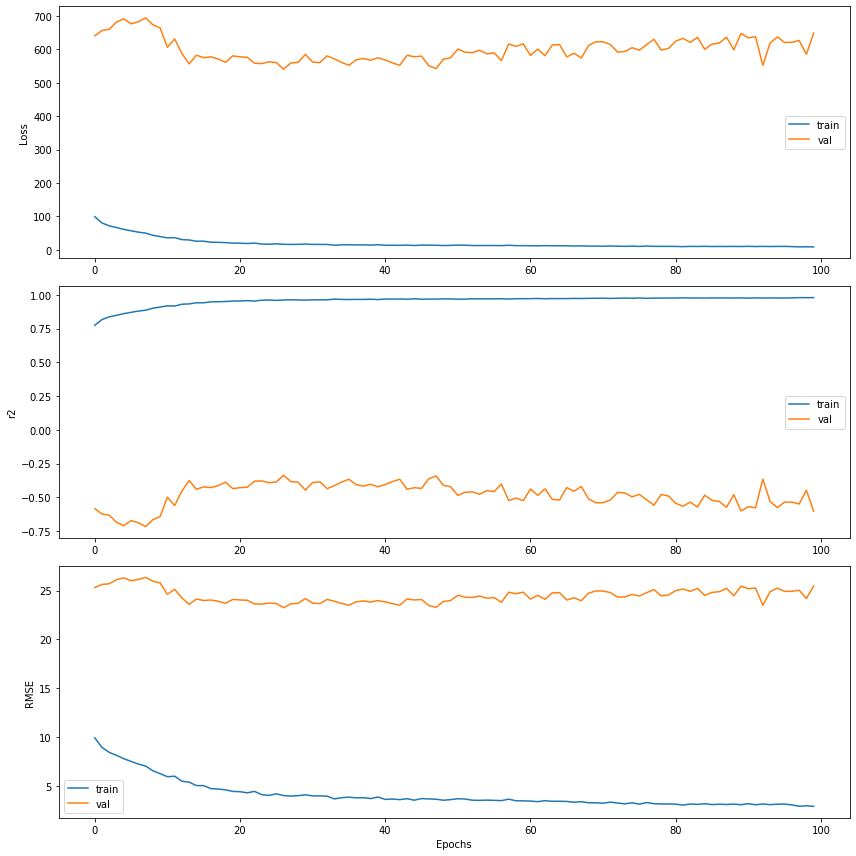

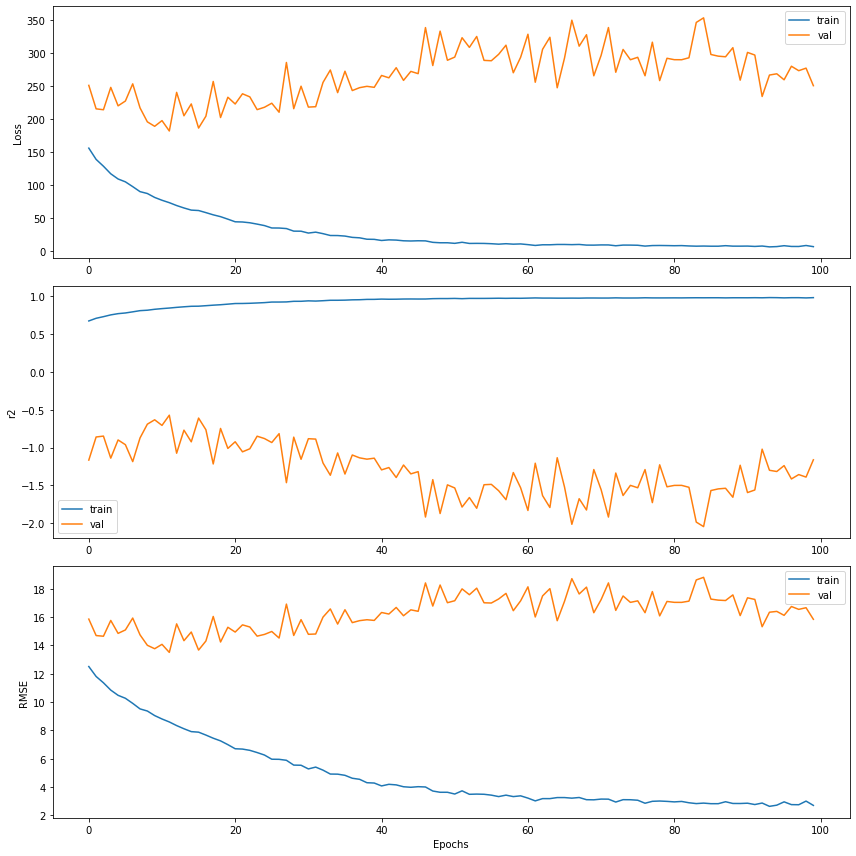

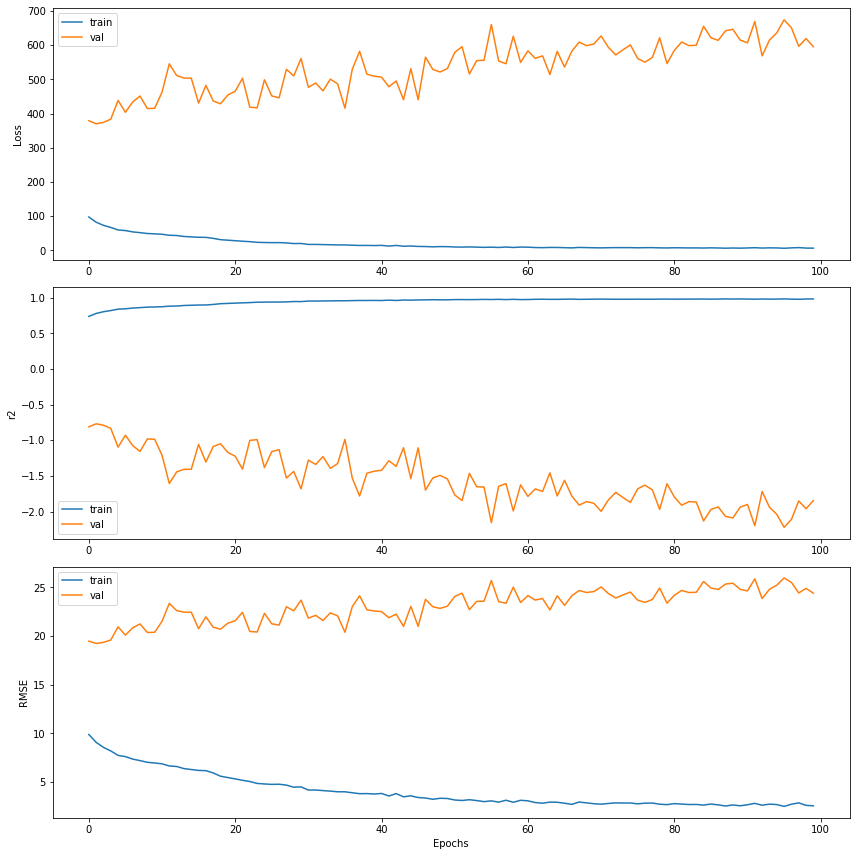

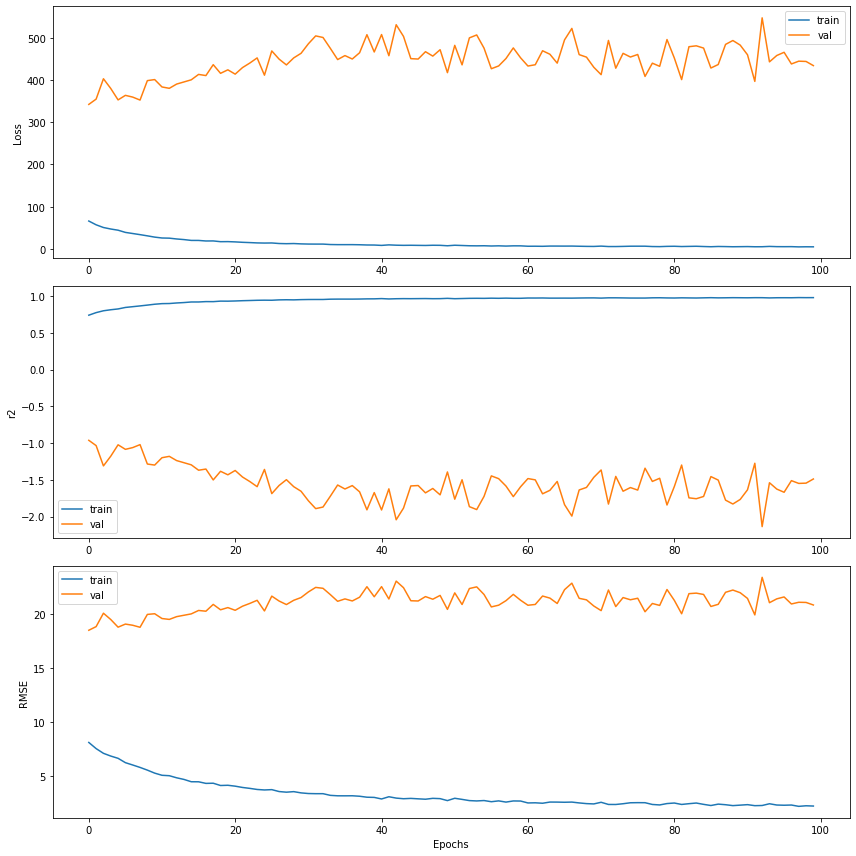

In [45]:
m1.print_histories(showfig=True,savefig=False)

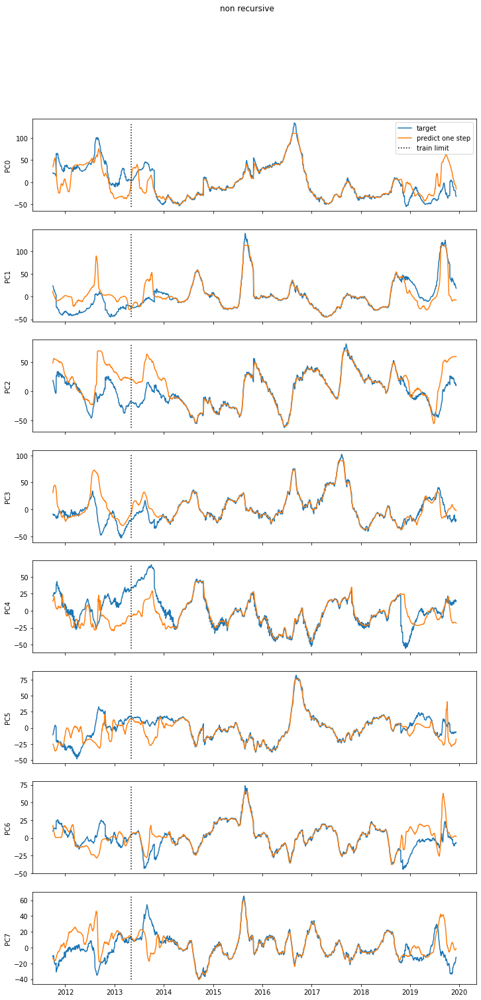

In [43]:
mdl_non_recursive.draw(m1, savefig=False, showfig=True)

-------------

-------------

In [46]:
reload(model_lstm);

In [47]:
reload(super_model_dl);

In [62]:
n_components = 1

In [63]:
m1 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir)
m1.compile_models('LSTM3_bk', npca=n_components)


Compiled !


In [64]:
m1.fit_multiple(ds, epochs=100, batch_size=128)

Fitting...
pc0 Training finished !


In [65]:
m1.predict_multiple(ds)

94/94 [==============================] - 2s 2ms/step
Prediction finished !!


In [66]:
m1.suffix = ''

In [67]:
m1.save_prediction()

Ypred saved as: /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221111-115018/ml/ypred_LSTM3_bk_100_129.npy


In [68]:
m1.nfeat = 8

m1.ypredict = m1.ypred
m1.y = m1.y[:-1]
m1.chrono = ds[0]['chrono'][:-1]

m1.ntest = ntrain

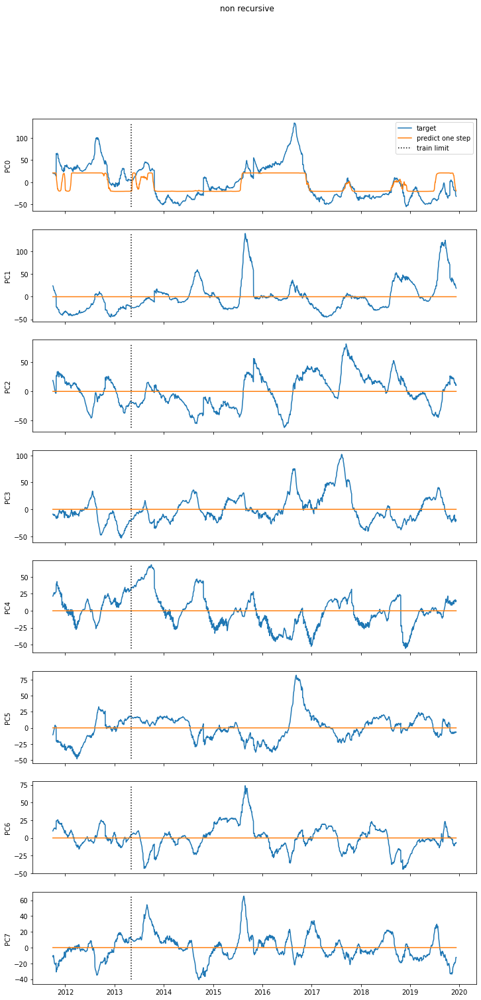

In [71]:
mdl_non_recursive.draw(m1, savefig=False, showfig=True)

In [72]:
m1.compile_model()

Compiled !


In [75]:
m1.fit(ds, epochs=100, batch_size=128)

Training finished ! suffle false


In [77]:
ypred = m1.ypred

In [78]:
m1.predict(ds)

94/94 [==============================] - 2s 2ms/step
Prediction finished !


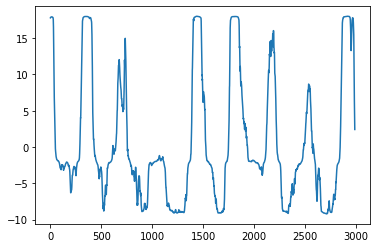

In [80]:
plt.plot(m1.ypred)

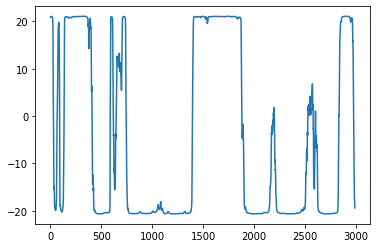

In [82]:
plt.plot(ypred[:,0])

In [86]:
ds[0]['ytrain'][:,0].shape

(2094,)

-------------

-------------

-------------

In [128]:
m2 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir, units=128)
m2.compile_model('LSTM1')

# avail name: 'LSTM3', 'LSTM1'

Compiled !


In [129]:
m2.fit(ds, epochs=100, batch_size=4)  # , print_history=True)

Training finished ! suffle false


In [130]:
m2.print_history(showfig=False)

Saved as : /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221111-115018/figures/LSTM1_learning_curves_100_4.png


In [131]:
m2.print_summary()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_91 (LSTM)              (None, 128)               84480     
                                                                 
 dropout_91 (Dropout)        (None, 128)               0         
                                                                 
 dense_31 (Dense)            (None, 1)                 129       
                                                                 
Total params: 84,609
Trainable params: 84,609
Non-trainable params: 0
_________________________________________________________________


In [132]:
# predict output
m2.predict(ds) # , savefig=True)

94/94 [==============================] - 1s 1ms/step
Prediction finished !


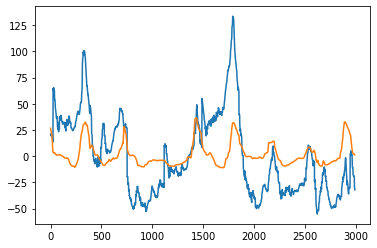

In [133]:
plt.plot(m2.ytrue[:,0])
plt.plot(m2.ypred)

94/94 [==============================] - 0s 1ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221110-223211/figures/LSTM1_pred_100_4.png


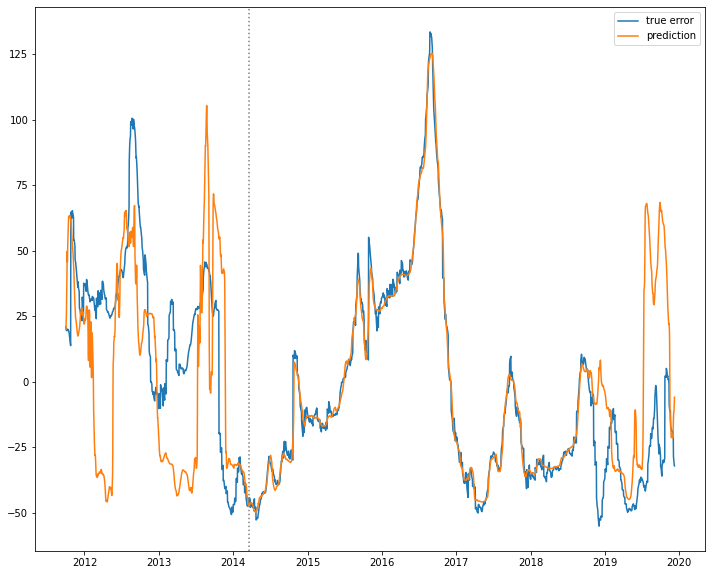

Ypred saved as: /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221110-223211/ml/ypred_LSTM1_100_4.npy


In [64]:
# predict output
m2.predict(ds, savefig=True)

---------

In [47]:
m2b = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir)
m2b.compile_model('LSTM1_bk')

# avail name: 'LSTM3', 'LSTM1'

Compiled !


In [48]:
# train model 

m2b.fit(ds, epochs=100, batch_size=128)  # , print_history=True)

Training finished ! suffle false


Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM1_bk_learning_curves_100_128.png


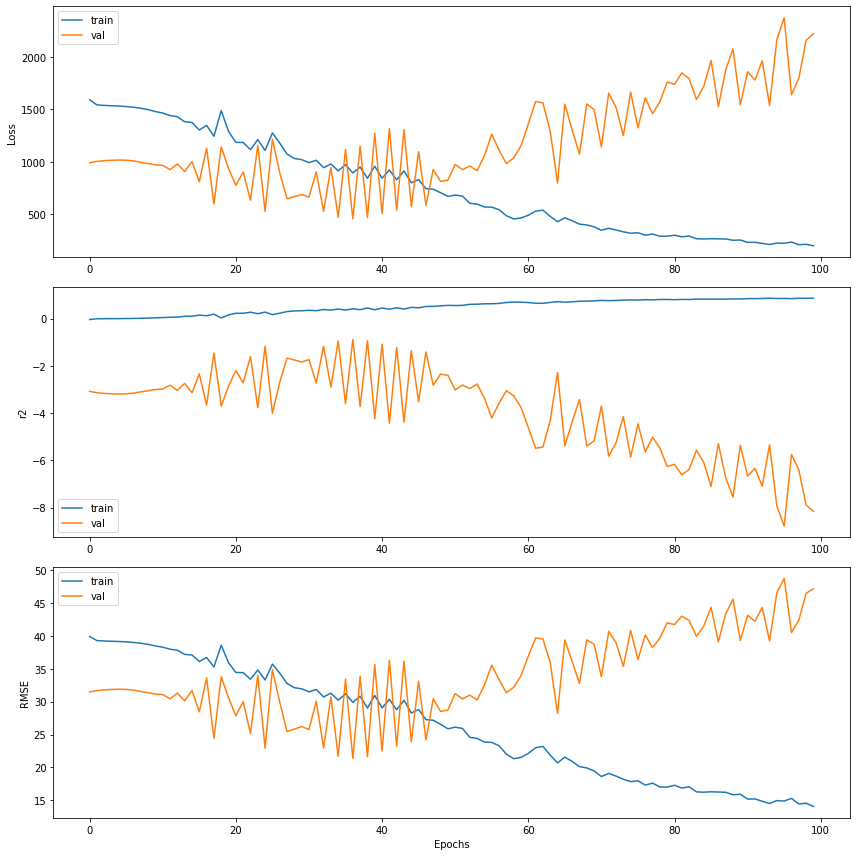

In [49]:
m2b.print_history(showfig=True)

94/94 [==============================] - 0s 1ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM1_bk_pred_100_128.png


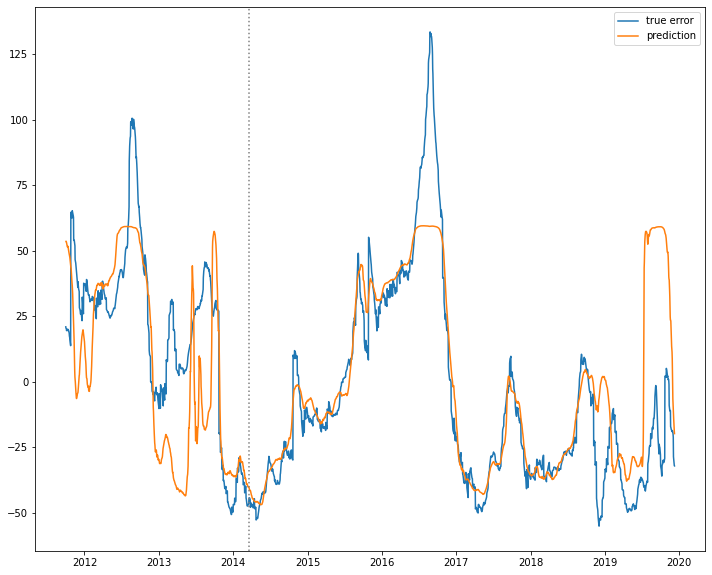

In [50]:
# predict output
m2b.predict(ds)

---------

In [82]:
m3 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], n_batch=128, rootdir=rootdir)
m3.compile_model('LSTM1_bk')

# avail name: 'LSTM3', 'LSTM1', 'LSTM1_bk'

init
super init with func updated
Compiled !


In [98]:
# train model 

m3.fit(ds, epochs=100, batch_size=8)  # , print_history=True)

Training finished !


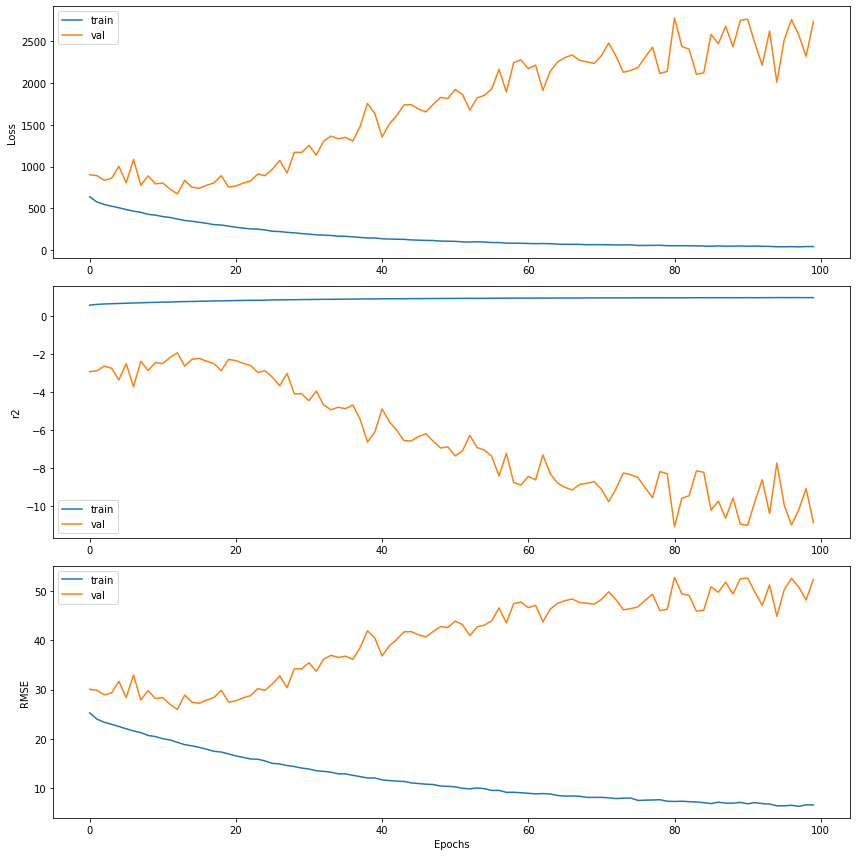

In [99]:
m3.print_history()

94/94 [==============================] - 0s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_8.png


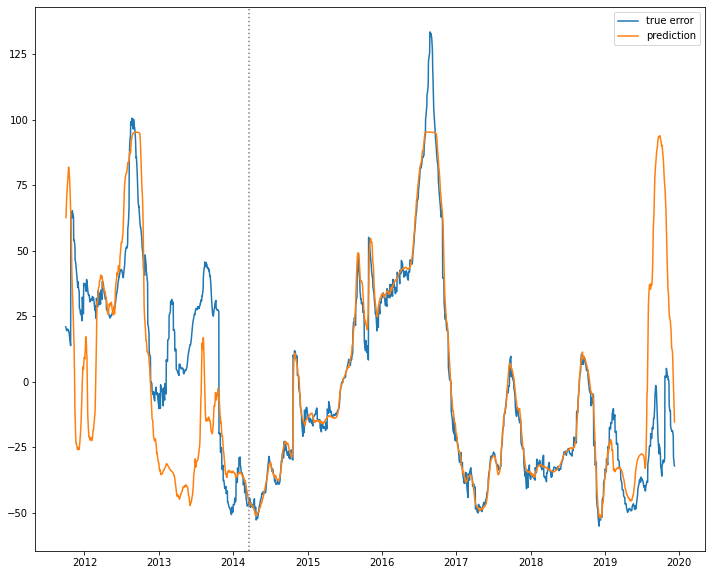

In [100]:
# predict output
m3.predict(ds)

---------

In [91]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir)
m4.compile_model('LSTM3')

# avail name: 'LSTM3', 'LSTM1', 'LSTM1_bk'

init
super init with func updated
Compiled !


In [92]:
# train model 

m4.fit(ds, epochs=100, batch_size=4)  # , print_history=True)

Training finished !


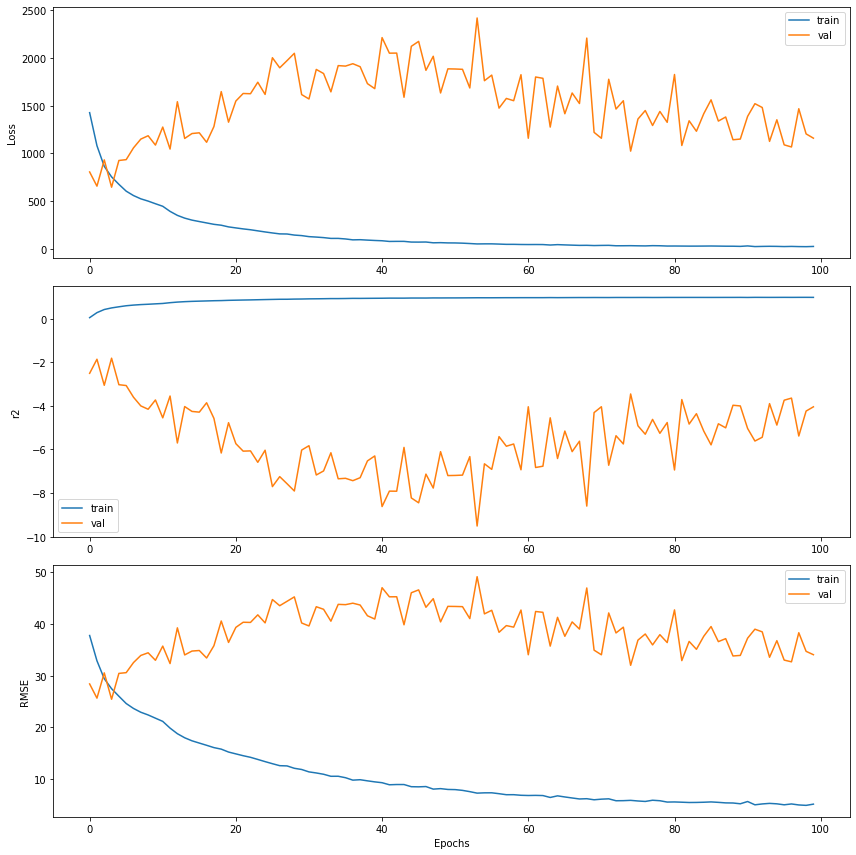

In [93]:
m4.print_history()

94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4.png


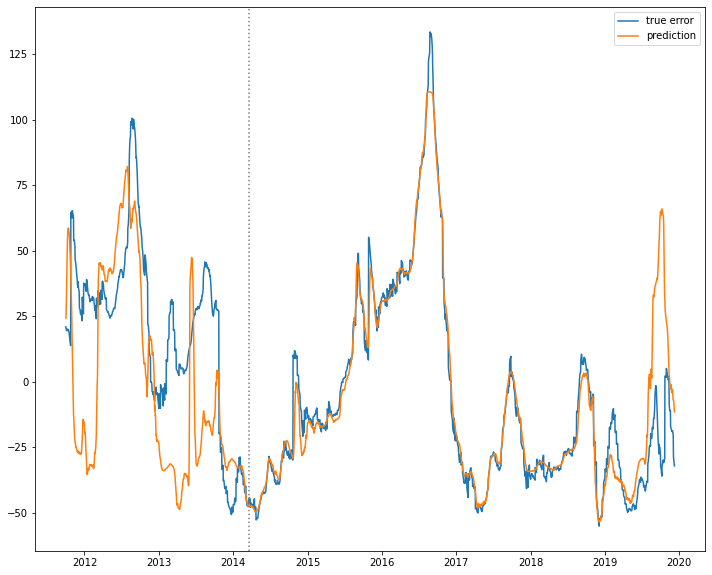

In [94]:
# predict output
m4.predict(ds)

---------

In [95]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir)
m4.compile_model('LSTM3')

# avail name: 'LSTM3', 'LSTM1', 'LSTM1_bk'

init
super init with func updated
Compiled !


In [96]:
# train model 
m4.fit(ds, epochs=100, batch_size=8)  # , print_history=True)

Training finished !


94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_8.png


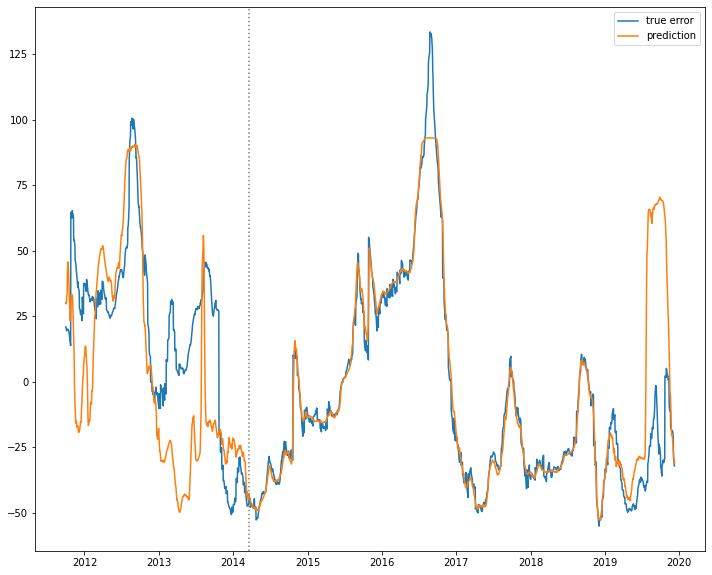

In [97]:
# predict output
m4.predict(ds)

init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_8.png


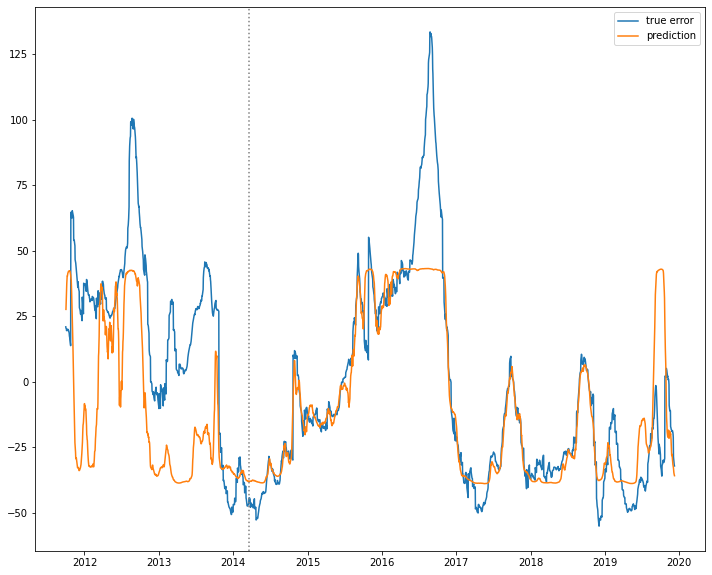

In [101]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, units=8)
m4.compile_model('LSTM3')
m4.fit(ds, epochs=100, batch_size=8)  # , print_history=True)
m4.predict(ds)

init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 5ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_8.png


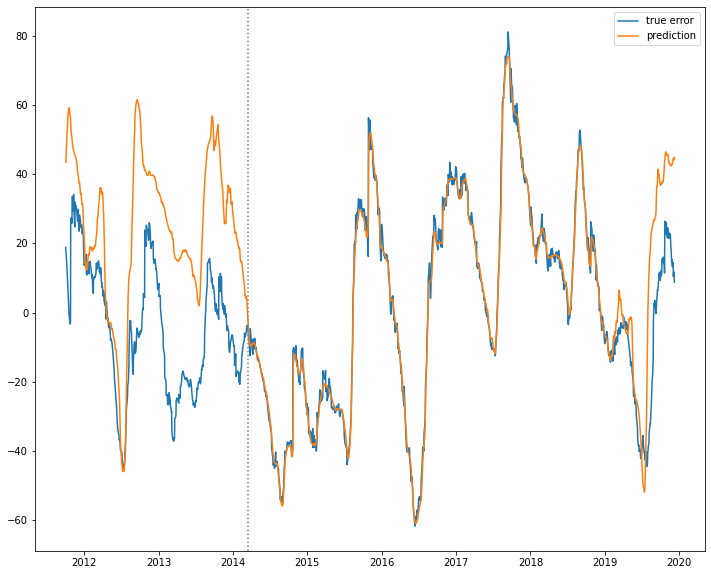

In [113]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir, units=128)
m4.compile_model('LSTM3')
m4.fit(ds, epochs=100, batch_size=8)  # , print_history=True)
m4.predict(ds)

In [104]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], reg=regularizers[2], rootdir=rootdir, units=30)
m4.compile_model('LSTM3')
m4.fit(ds, epochs=100, batch_size=128)  # , print_history=True)
m4.predict(ds)

Compiled !
Training finished ! suffle false
94/94 [==============================] - 2s 2ms/step
Prediction finished !


In [105]:
m4.nfeat = 8
m4.ypredict = m4.ypred
m4.y = m4.ytrue[:-1]
m4.chrono = ds[0]['chrono'][:-1]

m4.ntest = ntrain

IndexError: index 1 is out of bounds for axis 1 with size 1

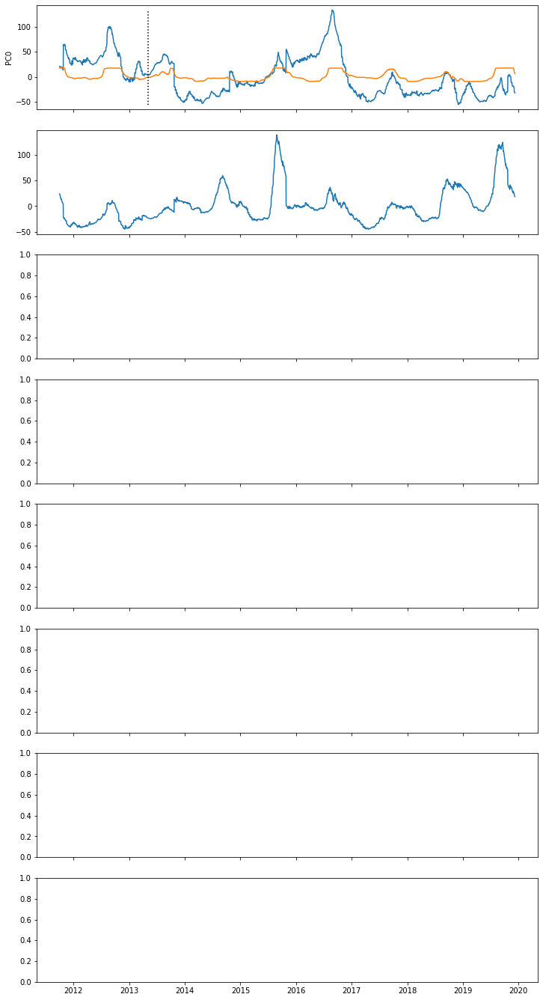

In [106]:

mdl_non_recursive.draw(m4, savefig=False, showfig=True)

### Model from Autokeras

In [112]:
model

In [114]:
m2.model

Compiled !
Training finished !
94/94 [==============================] - 4s 14ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_figLSTM3_bk_pred_100_8_01.png


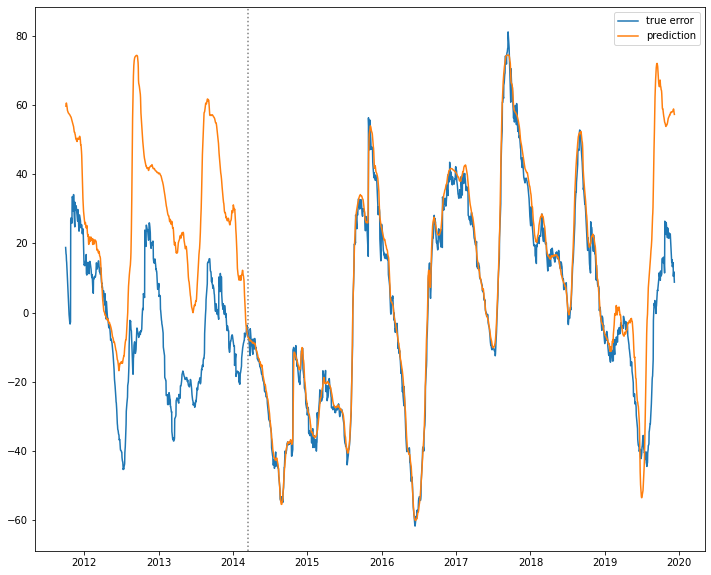

In [124]:
m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], reg=regularizers[2], rootdir=rootdir, units=128)
m4.compile_model('LSTM3_bk')
m4.fit(ds, epochs=100, batch_size=8)  # , print_history=True)
m4.predict(ds)

In [ ]:
# convLSTM1D

In [152]:
reload(model_lstm);

In [153]:
reload(super_model_dl);

In [155]:
m4.timesteps

2093

In [157]:
m4.features

36

------------------

In [ ]:
# shape from (2093,4,36) to (None, 4,5,36) for ConvLSTM1D 
# (sample, history, n_batch, features)

In [198]:
fds[0]['Xtrain'].shape

(2093, 4, 36)

In [199]:
fds[0]['Xtest'].shape

(898, 4, 36)

In [243]:
ds3 = fds.copy()

In [244]:
ds3[0]['Xtrain'] = np.reshape(fds[0]['Xtrain'][3:], [samples, len(H), n_batch, nfeatures])

In [245]:
ds3[0]['Xtest'] = np.reshape(fds[0]['Xtest'][3:], [samples_test, len(H), n_batch, nfeatures])

In [246]:
# for PC0
ipca = 0
# only PC0
ds3[0]['ytrain'] = fds[0]['ytrain'][:,ipca]
ds3[0]['ytest'] = fds[0]['ytest'][:,ipca]

In [267]:
ds3[0]['ytrain'] = ds3[0]['ytrain'].reshape(ds3[0]['ytrain'].shape[0], -1)
ds3[0]['ytest'] = ds3[0]['ytest'].reshape(ds3[0]['ytest'].shape[0], -1)

In [299]:
ds3[0]['Xtrain'].shape

(418, 4, 5, 36)

------------------

In [247]:
ds[0]['Xtrain'].shape

(2093, 4, 36)

In [192]:
H

[1, 8, 15, 22]

In [191]:
n_batch

5

In [203]:
nfeatures = 36
samples = 2093 // n_batch

In [212]:
samples_test = 898//n_batch

In [215]:
samples_test * 5

895

In [403]:
m5 = mdl_ConvLSTM(2093, 4, 5, 36)

In [404]:
m5.summary()

Model: "sequential_118"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm1d_17 (ConvLSTM1D)  (None, 4, 5, 32)         43648     
                                                                 
 batch_normalization_5 (Batc  (None, 4, 5, 32)         128       
 hNormalization)                                                 
                                                                 
 flatten_3 (Flatten)         (None, 640)               0         
                                                                 
 dense_111 (Dense)           (None, 1)                 641       
                                                                 
Total params: 44,417
Trainable params: 44,353
Non-trainable params: 64
_________________________________________________________________


In [405]:
history = m5.fit(ds3[0]["Xtrain"], ds3[0]["ytrain"], epochs=100, 
                                    batch_size=4, verbose=1, validation_split=0.15, shuffle=True)


Epoch 1/100
89/89 [==============================] - 4s 12ms/step - loss: 183.4601 - val_loss: 26.8106
Epoch 2/100
89/89 [==============================] - 1s 7ms/step - loss: 102.0091 - val_loss: 57.6351
Epoch 3/100
89/89 [==============================] - 1s 7ms/step - loss: 59.2714 - val_loss: 20.5483
Epoch 4/100
89/89 [==============================] - 1s 7ms/step - loss: 57.6206 - val_loss: 37.1840
Epoch 5/100
89/89 [==============================] - 1s 6ms/step - loss: 41.4796 - val_loss: 81.8042
Epoch 6/100
89/89 [==============================] - 1s 6ms/step - loss: 33.4640 - val_loss: 22.2398
Epoch 7/100
89/89 [==============================] - 1s 6ms/step - loss: 33.3756 - val_loss: 25.0974
Epoch 8/100
89/89 [==============================] - 1s 6ms/step - loss: 16.8181 - val_loss: 27.8576
Epoch 9/100
89/89 [==============================] - 1s 6ms/step - loss: 19.8746 - val_loss: 23.8958
Epoch 10/100
89/89 [==============================] - 1s 7ms/step - loss: 12.6704 - val_

Epoch 82/100
89/89 [==============================] - 1s 6ms/step - loss: 8.9919 - val_loss: 88.9093
Epoch 83/100
89/89 [==============================] - 1s 7ms/step - loss: 7.9016 - val_loss: 15.9345
Epoch 84/100
89/89 [==============================] - 1s 6ms/step - loss: 11.3499 - val_loss: 47.3139
Epoch 85/100
89/89 [==============================] - 1s 6ms/step - loss: 7.6591 - val_loss: 23.0631
Epoch 86/100
89/89 [==============================] - 1s 6ms/step - loss: 6.8157 - val_loss: 10.7835
Epoch 87/100
89/89 [==============================] - 1s 6ms/step - loss: 3.5954 - val_loss: 22.7949
Epoch 88/100
89/89 [==============================] - 1s 6ms/step - loss: 4.4225 - val_loss: 16.4813
Epoch 89/100
89/89 [==============================] - 1s 7ms/step - loss: 2.9582 - val_loss: 16.3098
Epoch 90/100
89/89 [==============================] - 1s 6ms/step - loss: 2.4887 - val_loss: 21.3915
Epoch 91/100
89/89 [==============================] - 1s 6ms/step - loss: 2.1491 - val_los

In [406]:
x = np.concatenate((ds3[0]["Xtest"], ds3[0]["Xtrain"]))
ytrue = np.concatenate((ds3[0]["ytest"], ds3[0]["ytrain"]))

In [423]:
np.concatenate((ds3[0]["Xtest"], ds3[0]["Xtrain"])).shape

(597, 4, 5, 36)

In [422]:
x.shape

(597, 4, 5, 36)

In [407]:
ypred = m5.predict(x, verbose=1)

19/19 [==============================] - 0s 2ms/step


In [394]:
ypred.shape

(597, 1)

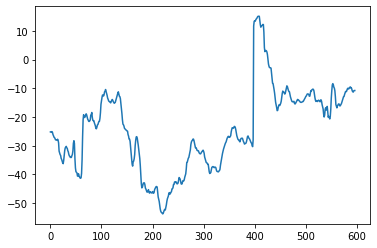

In [408]:
# plt.plot(ypred[::-1,1])
# plt.plot(ypred[::-1,0,0,0])
plt.plot(ypred[:,:])

In [372]:
597*5

2985

In [373]:
chrono.shape

(3014, 1)

In [374]:
3014-2985

29

In [378]:
3014-2992

22

In [377]:
ytrue.shape

(2992, 1)

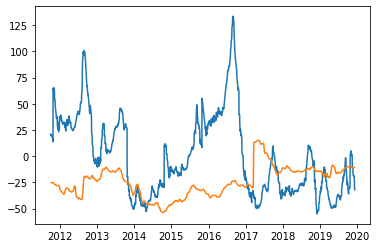

In [421]:
plt.plot(ds3[0]['chrono'], ytrue)
plt.plot(ds3[0]['chrono'][7:][::5], ypred)

In [402]:
def mdl_ConvLSTM(timesteps, history, batch, features):
    '''input shape : (samples, time, rows, channels)  (with default data_format='channels_last')
    
    is it ? : (in our vocabulary)
                      batch, history, time, features
                      time, history, batch, features
    
    '''

    model = Sequential()

    model.add(ConvLSTM1D(input_shape = (history, batch, features), filters=32, kernel_size=5,
                         return_sequences=True, padding='same',
                         go_backwards=True)) 

    
    model.add(BatchNormalization())
    model.add(Flatten())

    model.add(Dense(units = 1))
    

    opt = tf.keras.optimizers.Adam(learning_rate=0.01)  # 3e-4)
    model.compile(optimizer=opt, loss='mse') # , metrics=[tfa.metrics.RSquare(), tf.keras.metrics.RootMeanSquaredError()])
    return model

---------

### build dataset autokeras

In [9]:
from src.modelling import model_autokeras

In [16]:
from importlib import reload

In [17]:
reload(model_autokeras)

<module 'src.modelling.model_autokeras' from '/cluster/home/leoede/tardis/tardis-ml/src/modelling/model_autokeras.py'>

In [8]:
all_indexes_noX = np.arange(len(inputs))[16:]
indexes = all_indexes_noX

In [34]:
y = y[1:]

In [73]:
ntvt = (ntrain, nval, ntest)

In [35]:
dsk = model_autokeras.build_dataset_autokeras(X[:,indexes], y, chrono, ntvt)

In [36]:
dsk[0].keys()

dict_keys(['ytrain', 'yval', 'ytest', 'Xtrain', 'Xval', 'Xtest', 'chrono', 'chrono_train', 'chrono_val', 'chrono_test'])

## AutoKeras

In [10]:
import autokeras as ak

In [11]:
reg = ak.StructuredDataRegressor(overwrite=True, max_trials=2)  # 50)

In [ ]:
X_train = X[ntest:, indexes]
y_train = y[ntest:-1, 0].reshape((y[ntest:-1].shape[0],-1))  # pca = 0
X_test = X[:, indexes]

In [211]:
# see if better results with data scale
# X_train, X_test = scale_data_var_2D(X_train, X_test)

# >>> apparently not better, maybe slightly worst

In [97]:
# reg.fit(X[ntest:], y[ntest:-1,0].reshape((y[ntest:-1].shape[0],-1)), epochs=10)

In [12]:
history = reg.fit(X_train, y_train, epochs=40, validation_data=dsk['yval'])

NameError: name 'X_train' is not defined

In [44]:
history = reg.fit(dsk[0]['Xtrain'], dsk[0]['ytrain'], epochs=40, validation_data=(dsk[0]['Xval'], dsk[0]['yval']))

Trial 2 Complete [00h 00m 09s]
val_loss: 469.66290283203125

Best val_loss So Far: 461.8801574707031
Total elapsed time: 01h 43m 18s
INFO:tensorflow:Oracle triggered exit
Epoch 1/40
62/62 [==============================] - 3s 16ms/step - loss: 761.4377 - mean_squared_error: 761.4377 - val_loss: 517.6792 - val_mean_squared_error: 517.6792
Epoch 2/40
62/62 [==============================] - 0s 4ms/step - loss: 735.4607 - mean_squared_error: 735.4607 - val_loss: 506.2954 - val_mean_squared_error: 506.2954
Epoch 3/40
62/62 [==============================] - 0s 4ms/step - loss: 699.3564 - mean_squared_error: 699.3564 - val_loss: 492.5560 - val_mean_squared_error: 492.5560
Epoch 4/40
62/62 [==============================] - 0s 4ms/step - loss: 648.1635 - mean_squared_error: 648.1635 - val_loss: 478.7577 - val_mean_squared_error: 478.7577
Epoch 5/40
62/62 [==============================] - 0s 3ms/step - loss: 590.9136 - mean_squared_error: 590.9136 - val_loss: 468.2172 - val_mean_squared_erro

In [49]:
x_p =  np.concatenate((dsk[0]["Xtest"], dsk[0]["Xval"], dsk[0]["Xtrain"]))

In [50]:
pred_y = reg.predict(x_p)  #[:ntest, indexes])

95/95 [==============================] - 0s 3ms/step


In [54]:
# splitting the dataset
ntrain, nval, ntest = mdl_dataset_prep.dataset_split(X.shape[0], 0.65,.15)

In [61]:
y.shape

(3013, 8)

In [63]:
dsk[0]['chrono'].shape

(3014, 1)

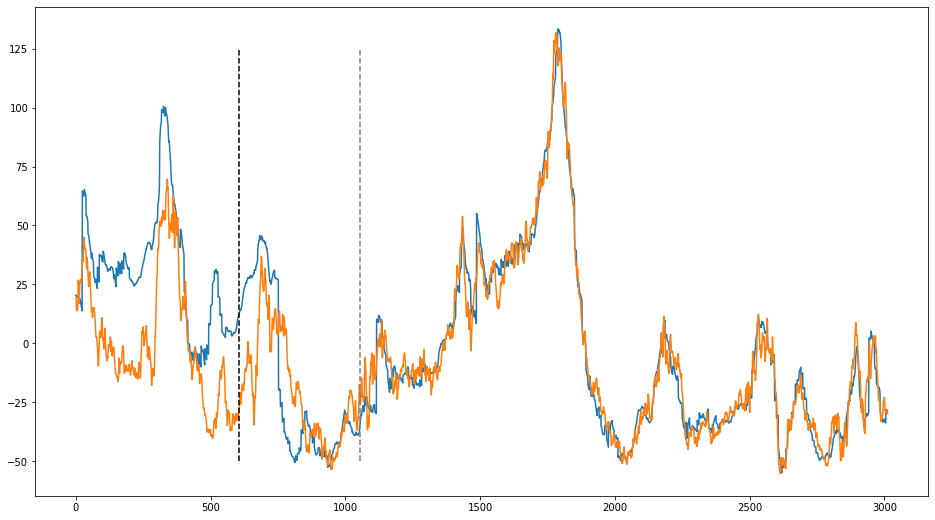

In [65]:
fig, ax = plt.subplots(figsize=(16,9))

plt.plot(y[:,0], label='true')
plt.plot(pred_y[:,0], label='pred')
# plt.plot(pred_y_test[:,0], label='pred test only')

plt.plot([ntest]*2, [-50,125], 'k--')
plt.plot([nval+ntest]*2, [-50,125], c='grey', ls='--')


In [57]:
pred_y_test = reg.predict(dsk[0]['Xtest'])  #[:ntest, indexes])

19/19 [==============================] - 0s 3ms/step


In [46]:
pred_y = reg.predict(dsk[0]['Xtest'])  #[:ntest, indexes])

19/19 [==============================] - 0s 5ms/step


In [186]:
pred_y_m = m2.model.predict(X[:ntest, indexes])

19/19 [==============================] - 3s 5ms/step


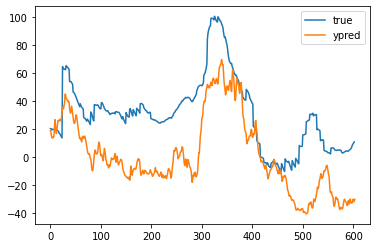

In [48]:
plt.plot(y[:ntest,0], label='true')
plt.plot(pred_y[:,0], label='ypred')
# plt.plot(pred_y_m, ls='--',label='ypred modelexport')
plt.legend()

In [142]:
pred_y = reg.predict(X_test)

95/95 [==============================] - 0s 2ms/step


In [143]:
np.isnan(pred_y).all()

False

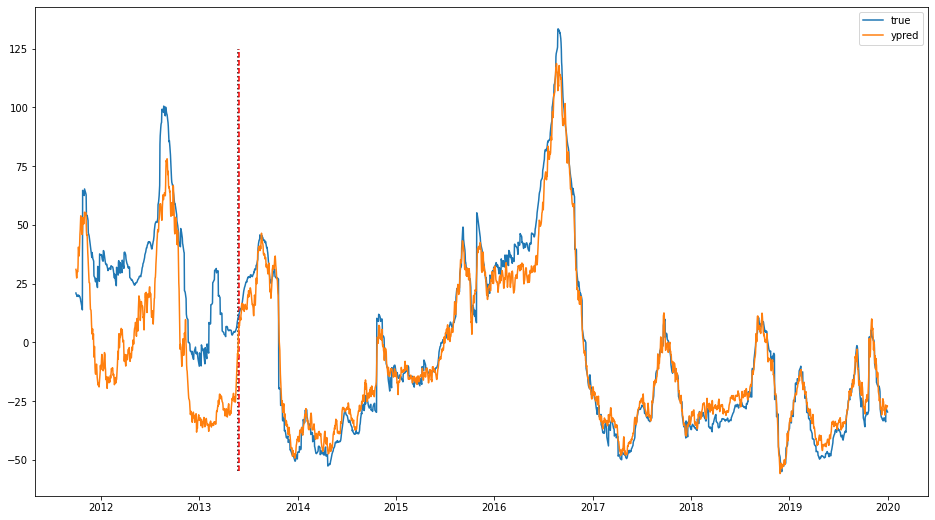

In [223]:
fig, ax = plt.subplots(figsize=(16,9))
ax.plot([chrono.iloc[ntest]]*2,[-55,125], ':k')
ax.plot([chrono.iloc[-ntrain]]*2,[-55,125], '--r')

plt.plot(chrono, y[:,0], label='true')
plt.plot(chrono[:-1], pred_y, label='ypred')
plt.legend()

In [145]:
model = reg.export_model()

In [146]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160)]             0         
                                                                 
 multi_category_encoding (Mu  (None, 160)              0         
 ltiCategoryEncoding)                                            
                                                                 
 normalization (Normalizatio  (None, 160)              321       
 n)                                                              
                                                                 
 dense (Dense)               (None, 32)                5152      
                                                                 
 re_lu (ReLU)                (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                1056  

In [194]:
me = super_model_dl.SModelDL()

In [195]:
me.set_model(model)

In [208]:
me.predict(dsk)

95/95 [==============================] - 1s 2ms/step
Prediction finished !


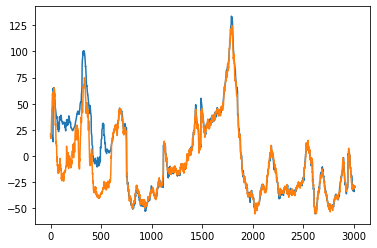

In [209]:
plt.plot(me.ytrue[:,0])
plt.plot(me.ypred)


In [224]:
X[:ntest, indexes]

array([[ 147.59535217,   10.86957741,   12.54108906, ...,   -3.78954911,
           1.97529197,   -7.39097595],
       [ 147.21278381,   10.62866497,   12.06255531, ...,   -3.78954911,
           1.97529197,   -7.39097595],
       [ 146.75135803,   10.33606911,   11.94139004, ...,   -5.9198575 ,
           2.65599799,   -5.44735575],
       ...,
       [-127.85974884,  -26.89793777,   36.89197159, ...,   12.82425117,
           2.85894132,   -0.85623759],
       [-128.47479248,  -26.52965355,   36.14780426, ...,    9.06375885,
           3.23805189,    0.60385132],
       [-128.84657288,  -26.4164772 ,   34.9279213 , ...,    9.23522854,
           3.9918859 ,    1.86279881]])

In [225]:
X_test

array([[0.92182767, 0.48706883, 0.6216399 , ..., 0.48819381, 0.53153842,
        0.22283107],
       [0.92069419, 0.48519685, 0.61712717, ..., 0.48819381, 0.53153842,
        0.22283107],
       [0.91932706, 0.48292327, 0.61598454, ..., 0.43452236, 0.55268389,
        0.28913119],
       ...,
       [0.62268873, 0.0718807 , 0.79530173, ..., 0.23863241, 0.27552359,
        0.4051343 ],
       [0.6160803 , 0.06513868, 0.79105482, ..., 0.24192128, 0.38658537,
        0.38734657],
       [0.60898935, 0.06460314, 0.79101102, ..., 0.35341468, 0.32508067,
        0.4457215 ]])

In [226]:
dsk[0]['Xtest']

array([[ 147.59535217,   10.86957741,   12.54108906, ...,   -3.78954911,
           1.97529197,   -7.39097595],
       [ 147.21278381,   10.62866497,   12.06255531, ...,   -3.78954911,
           1.97529197,   -7.39097595],
       [ 146.75135803,   10.33606911,   11.94139004, ...,   -5.9198575 ,
           2.65599799,   -5.44735575],
       ...,
       [-127.85974884,  -26.89793777,   36.89197159, ...,   12.82425117,
           2.85894132,   -0.85623759],
       [-128.47479248,  -26.52965355,   36.14780426, ...,    9.06375885,
           3.23805189,    0.60385132],
       [-128.84657288,  -26.4164772 ,   34.9279213 , ...,    9.23522854,
           3.9918859 ,    1.86279881]])

In [185]:
m2.print_summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160)]             0         
                                                                 
 multi_category_encoding (Mu  (None, 160)              0         
 ltiCategoryEncoding)                                            
                                                                 
 normalization (Normalizatio  (None, 160)              321       
 n)                                                              
                                                                 
 dense (Dense)               (None, 32)                5152      
                                                                 
 re_lu (ReLU)                (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                1056  

---------------

In [19]:
from src.modelling import model_autokeras

In [106]:
from src.modelling import super_model_dl

In [113]:
reload(model_autokeras);

In [114]:
reload(super_model_dl);

In [262]:
ma = model_autokeras.ModelAK()

In [263]:
ma.compile_model()

In [264]:
ma.explore(dsk, epochs=40)

Trial 2 Complete [00h 00m 17s]
val_loss: 1049.299072265625

Best val_loss So Far: 822.0805053710938
Total elapsed time: 00h 00m 24s
INFO:tensorflow:Oracle triggered exit
Epoch 1/40
76/76 [==============================] - 2s 3ms/step - loss: 1416.9828 - mean_squared_error: 1416.9828
Epoch 2/40
76/76 [==============================] - 0s 3ms/step - loss: 1255.5591 - mean_squared_error: 1255.5591
Epoch 3/40
76/76 [==============================] - 0s 3ms/step - loss: 1036.7876 - mean_squared_error: 1036.7876
Epoch 4/40
76/76 [==============================] - 0s 3ms/step - loss: 931.5822 - mean_squared_error: 931.5822
Epoch 5/40
76/76 [==============================] - 0s 3ms/step - loss: 859.1570 - mean_squared_error: 859.1570
Epoch 6/40
76/76 [==============================] - 0s 3ms/step - loss: 762.3455 - mean_squared_error: 762.3455
Epoch 7/40
76/76 [==============================] - 0s 3ms/step - loss: 640.4905 - mean_squared_error: 640.4905
Epoch 8/40
76/76 [======================

In [265]:
ma.export_model()

In [268]:
ma.predict(dsk)

95/95 [==============================] - 1s 2ms/step
Prediction finished !


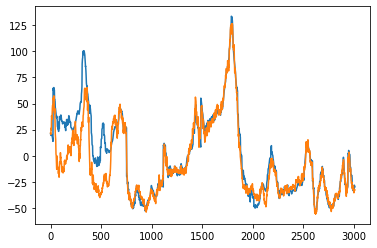

In [271]:
plt.plot(me.ytrue[:,0])
plt.plot(ma.ypred)


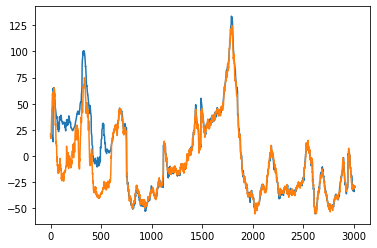

In [270]:
plt.plot(me.ytrue[:,0])
plt.plot(me.ypred)


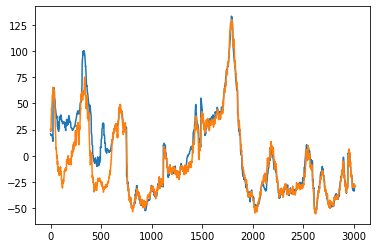

In [296]:
plt.plot(mb.y[:,0])
plt.plot(mb.ypred[:,0])


In [76]:
from importlib import reload

In [90]:
reload(model_autokeras);

In [91]:
mb = model_autokeras.ModelAK(rootdir=rootdir, ml_dir=ml_dir, fig_dir=fig_dir, ntvt=ntvt)

In [92]:
mb.compile_models('AK',2)

In [93]:
mb.explore_multiple(dsk, epochs=4, batch_size=None)

Trial 2 Complete [00h 00m 05s]
val_loss: 160.40419006347656

Best val_loss So Far: 160.40419006347656
Total elapsed time: 00h 00m 10s
INFO:tensorflow:Oracle triggered exit
Epoch 1/4
62/62 [==============================] - 3s 16ms/step - loss: 1309.7335 - r_square: 0.0361 - root_mean_squared_error: 33.1942 - val_loss: 161.7358 - val_r_square: 0.1619 - val_root_mean_squared_error: 12.7175
Epoch 2/4
62/62 [==============================] - 0s 4ms/step - loss: 1137.6410 - r_square: 0.1537 - root_mean_squared_error: 33.7289 - val_loss: 160.1176 - val_r_square: 0.1703 - val_root_mean_squared_error: 12.6538
Epoch 3/4
62/62 [==============================] - 0s 3ms/step - loss: 974.5026 - r_square: 0.2750 - root_mean_squared_error: 31.2170 - val_loss: 187.1707 - val_r_square: 0.0301 - val_root_mean_squared_error: 13.6810
Epoch 4/4
62/62 [==============================] - 0s 4ms/step - loss: 823.9124 - r_square: 0.3871 - root_mean_squared_error: 28.7039 - val_loss: 241.5073 - val_r_square: -0.

In [118]:
mb.predict_multiple(dsk)

95/95 [==============================] - 1s 2ms/step
Prediction finished !!


In [119]:
mb.batch_size = 0
mb.suffix= ''

In [120]:
mb.print_histories()

Saved as : /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221115-154707/figures/AK_learning_curves_4_0_PC0.png
Saved as : /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221115-154707/figures/AK_learning_curves_4_0_PC1.png


In [121]:
mb.print_summary(savefig=True)

In [122]:
mb.save_prediction()

Ypred saved as: /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221115-154707/ml/ypred_AK_4_0.npy
Ytrue saved as: /nird/projects/nird/NS2993K/Leo/results/lstm_Npred22_7F_rw29d_N8844_H1333_Hn0000_sithick_artc_221115-154707/ml/ytrue_AK_4_0.npy


In [308]:
from src.visualization import mdl_ypred_PCA

In [325]:
reload(mdl_ypred_PCA)

<module 'src.visualization.mdl_ypred_PCA' from '/cluster/home/leoede/tardis/tardis-ml/src/visualization/mdl_ypred_PCA.py'>

In [402]:
mb.chrono = dsk[0]['chrono']
mb.ytrue = mb.y
mb.ntest = 603

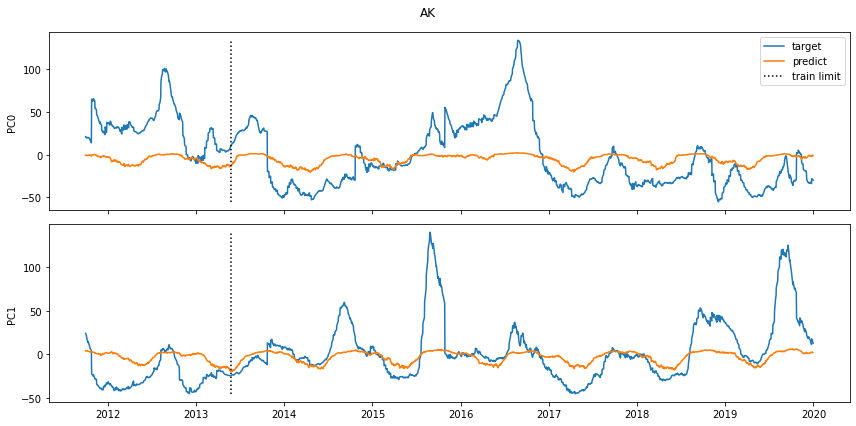

In [403]:
mdl_ypred_PCA.draw(mb)

## AutoKeras custome

In [285]:
input_node = ak.StructuredDataInput()
output_node = ak.CategoricalToNumerical()(input_node)
output_node = ak.DenseBlock()(output_node)
output_node = ak.RegressionHead()(output_node)


auto_model = ak.AutoModel(
    inputs=input_node, outputs=output_node, max_trials=3, overwrite=True
)

In [286]:
auto_model.fit(X_train, y_train, epochs=1)

AttributeError: 'DenseBlock' object has no attribute 'get_adapter'

In [279]:
model = auto_model.export_model()
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160)]             0         
                                                                 
 multi_category_encoding (Mu  (None, 160)              0         
 ltiCategoryEncoding)                                            
                                                                 
 dense (Dense)               (None, 128)               20608     
                                                                 
 re_lu (ReLU)                (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 32)                4128      
                                                                 
 re_lu_1 (ReLU)              (None, 32)                0         
                                                             

---------

In [ ]:
# for each PCA separatly

for ipca in range(y.shape[1]):
    print(f'Working on PC{ipca}...')
    ds[0]['ytrain'] = fds[0]['ytrain'][:,ipca]
    ds[0]['ytest'] = fds[0]['ytest'][:,ipca]

    suffixe = f'_PCA{ipca}'
    n_output = ds[0]['ytrain'].shape[0]

    
    m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], rootdir=rootdir)
    m4.compile_model('LSTM3')
    m4.print_history()
    m4.fit(ds, epochs=100, batch_size=8, suffix=suffixe) 
    m4.predict(ds)
#     model_mh_reg = model_cnn.CNN_multihead_model(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], n_output=1, reg=regularizers[2], rootdir=rootdir)

#     model_cnn.fit_cnn_mh(model_mh_reg, ds, epochs=epo, batch_size=bat, print_arch_model=True, print_history=True, suffix=suffixe)

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA0.png


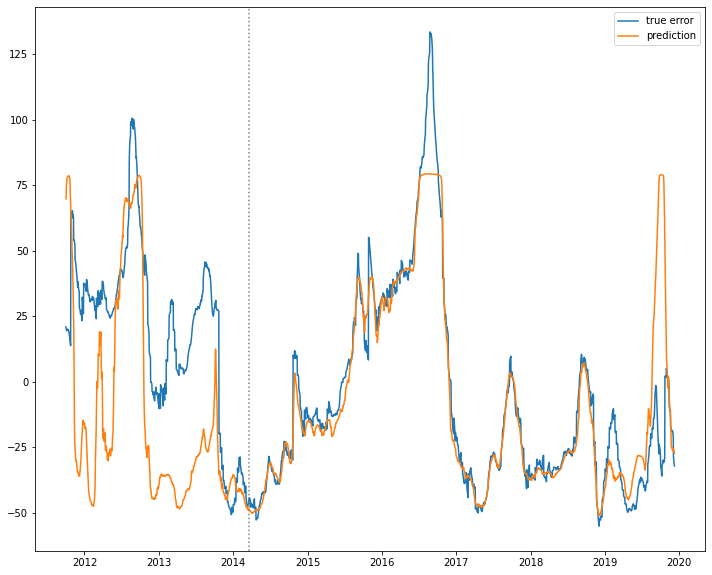

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA1.png


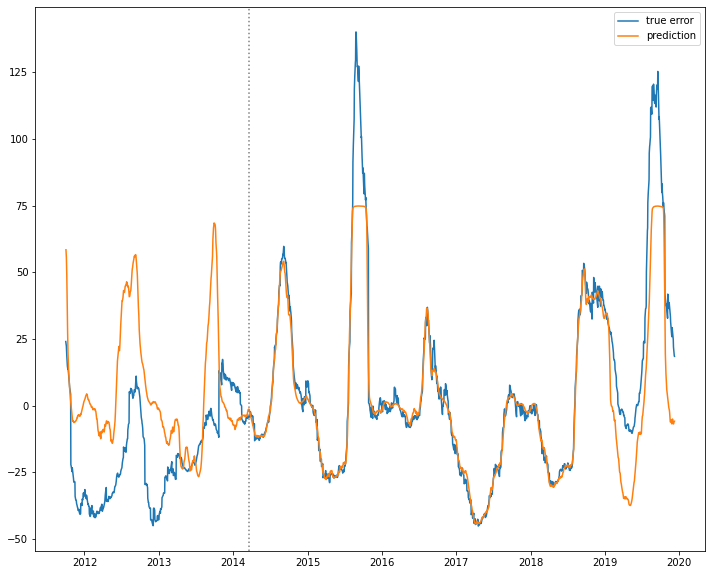

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA2.png


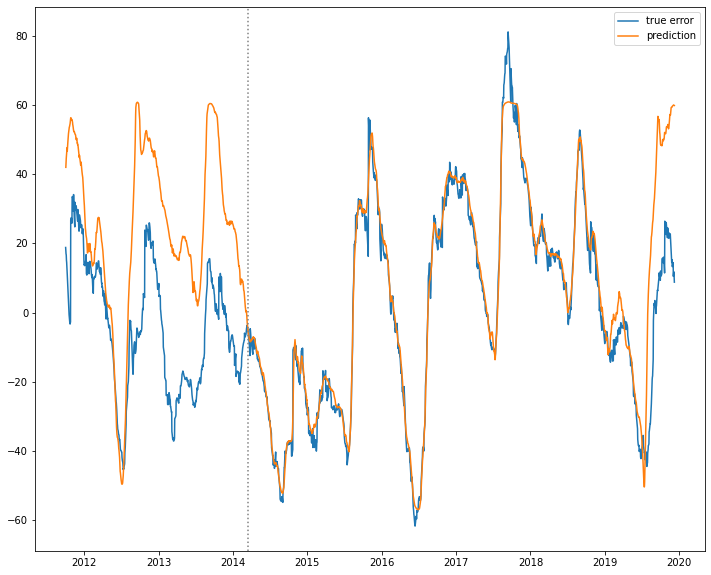

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA3.png


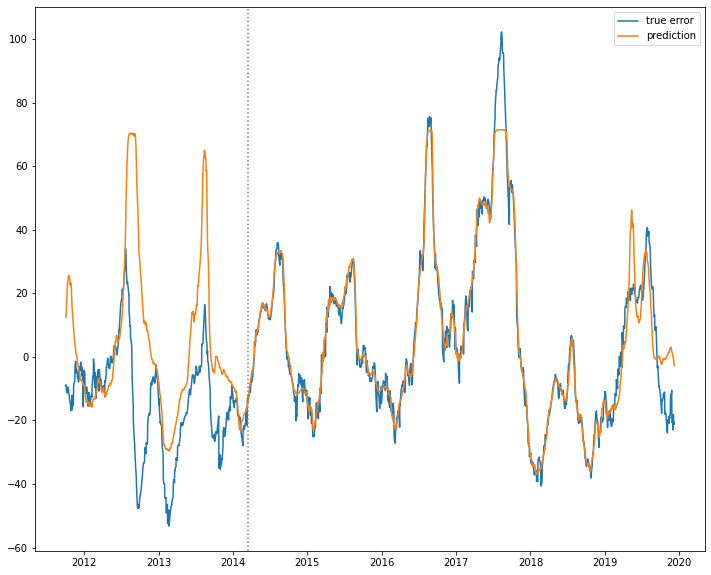

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA4.png


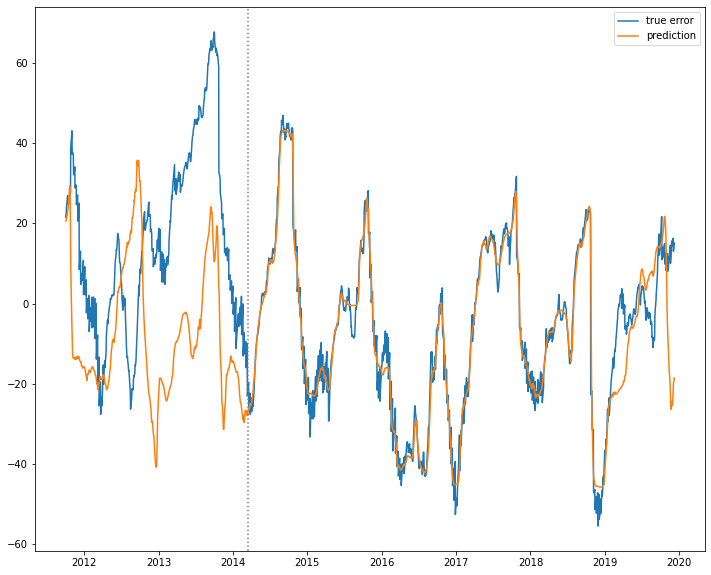

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA5.png


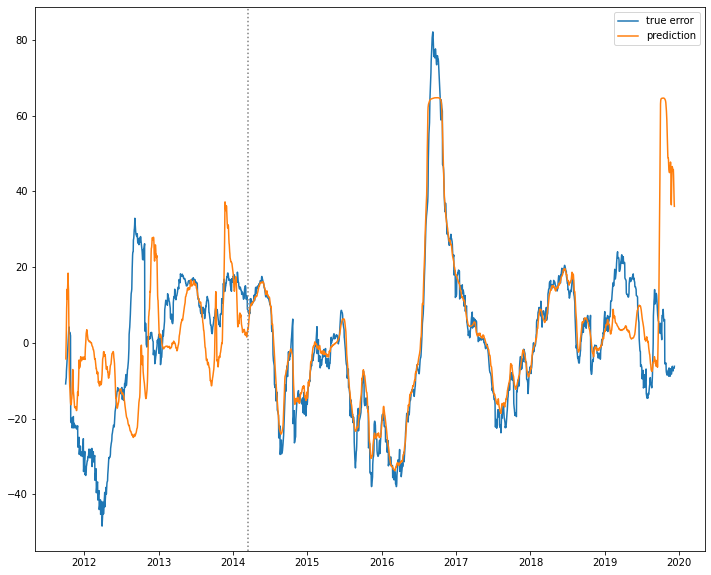

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA6.png


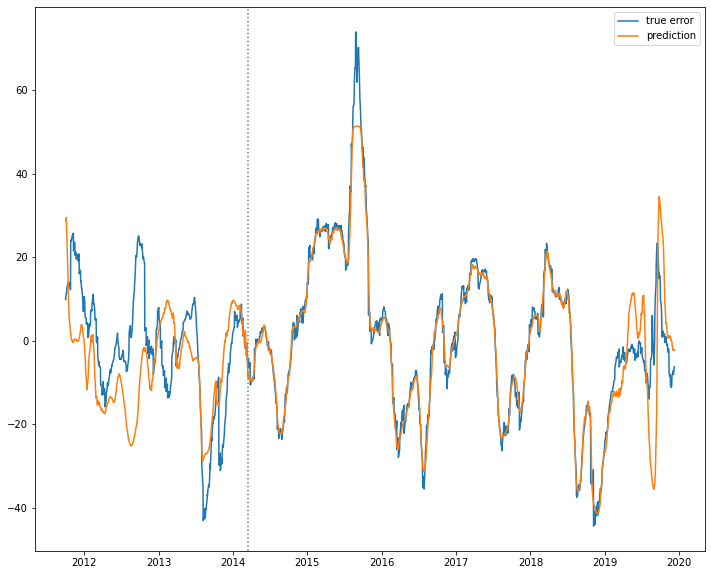

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA7.png


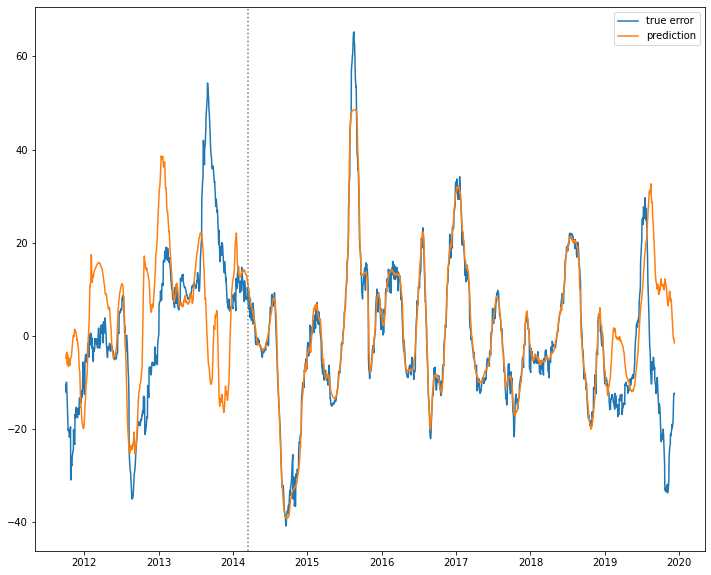

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA0.png


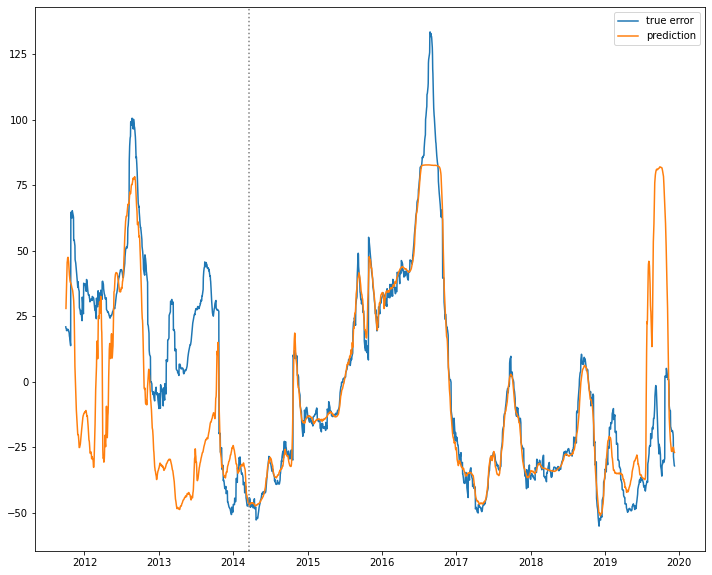

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA1.png


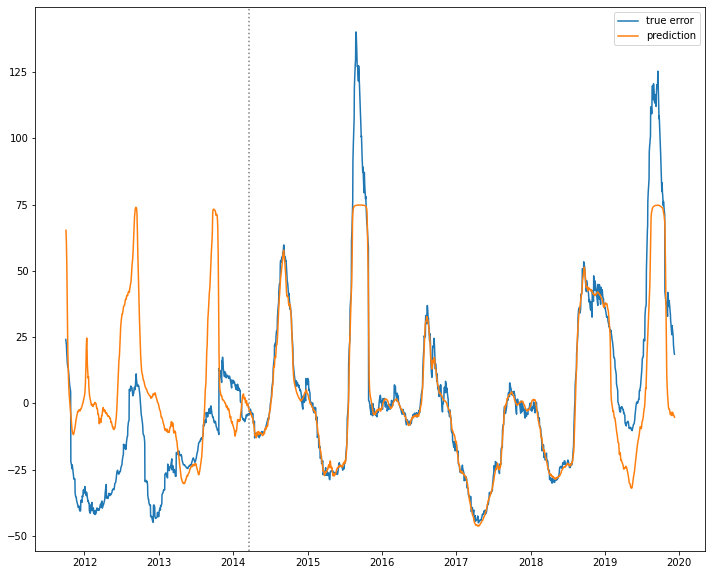

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA2.png


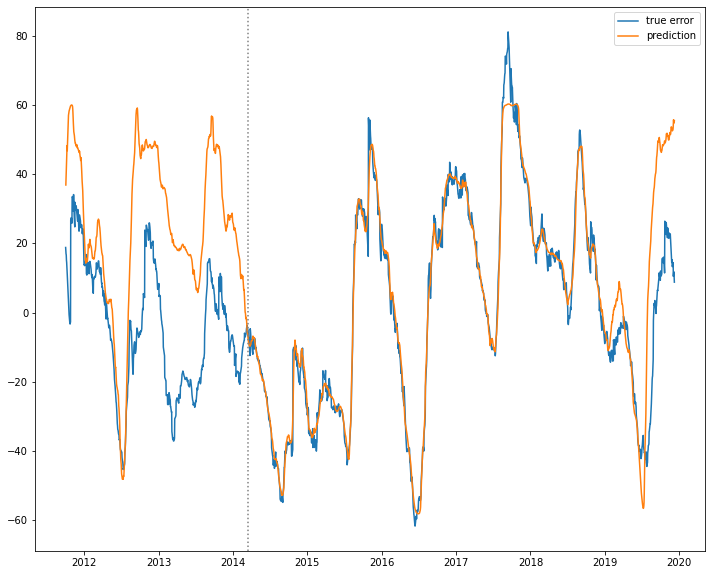

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA3.png


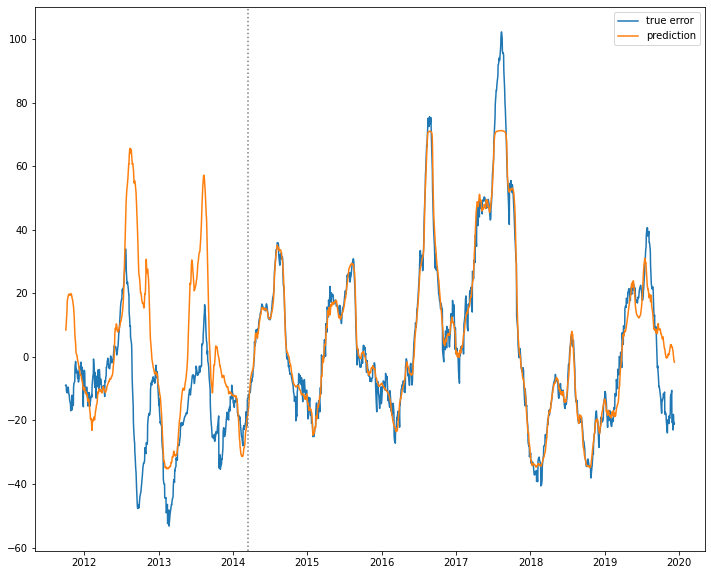

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA4.png


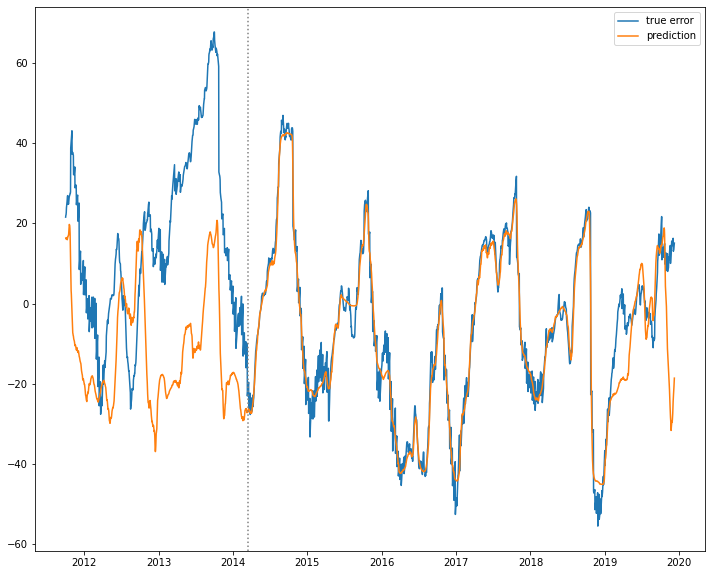

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA5.png


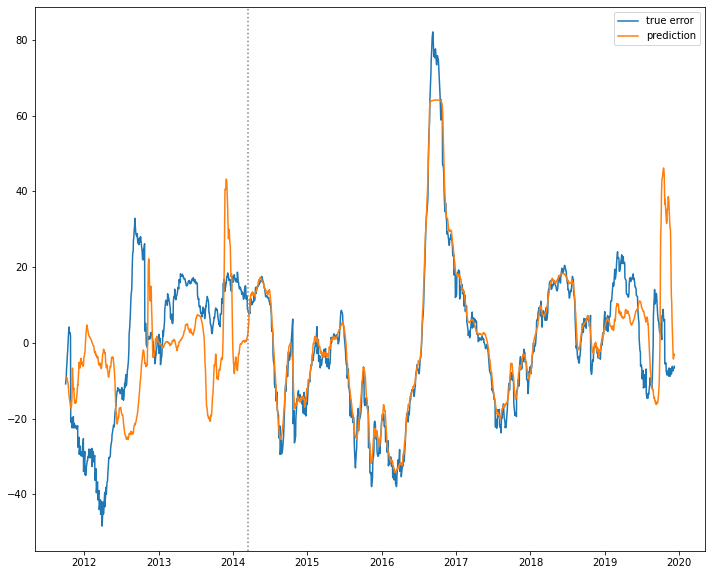

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA6.png


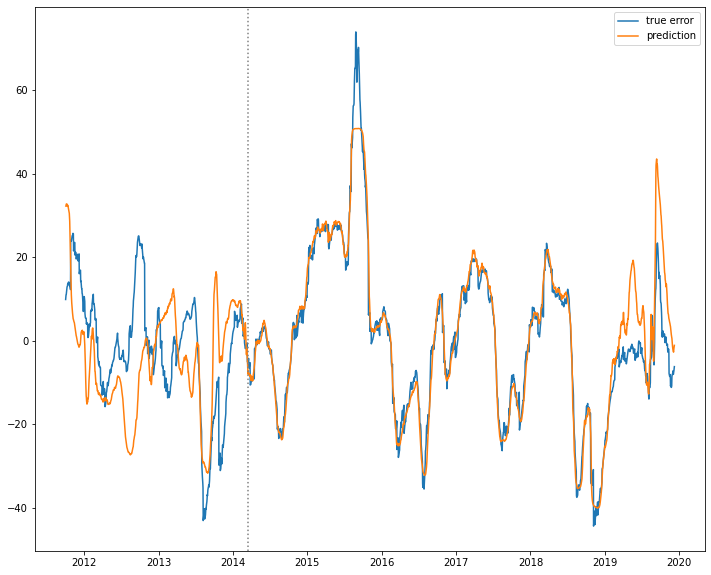

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA7.png


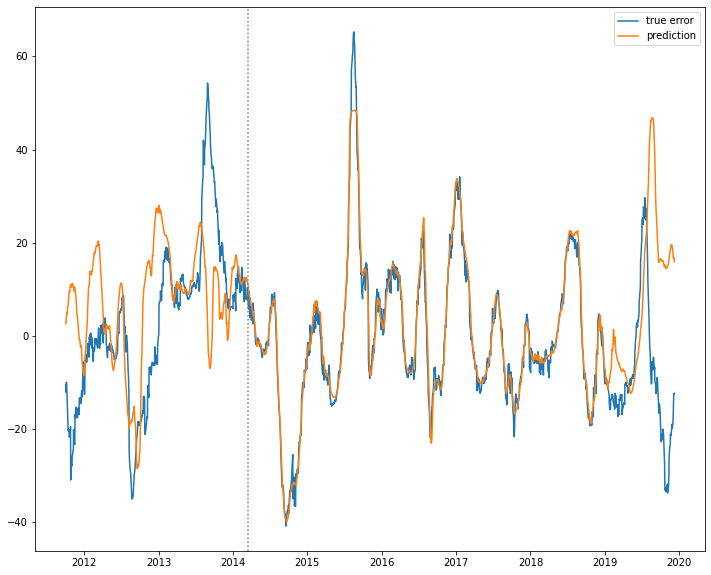

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA0.png


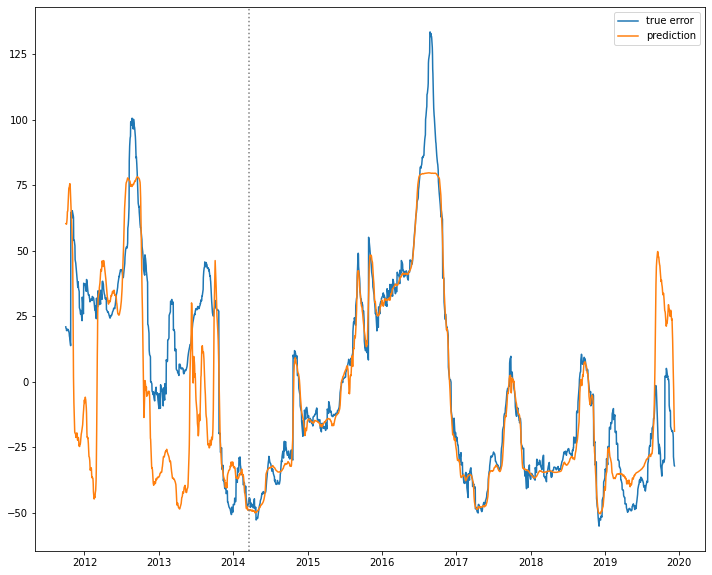

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA1.png


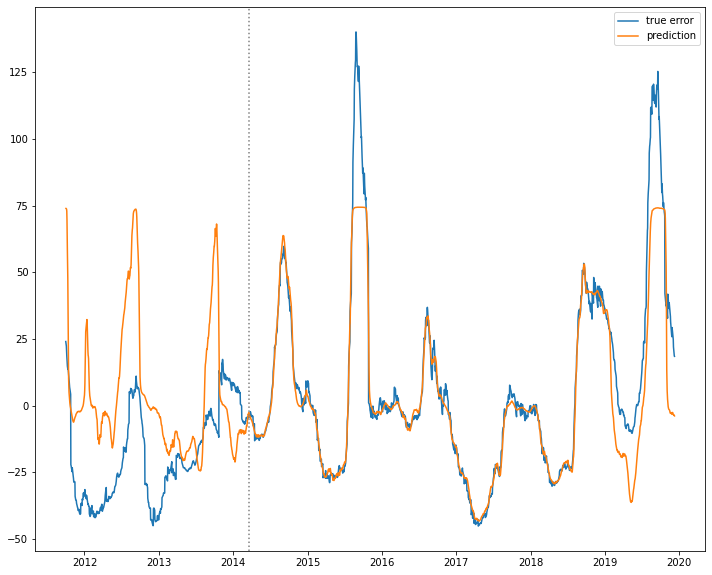

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA2.png


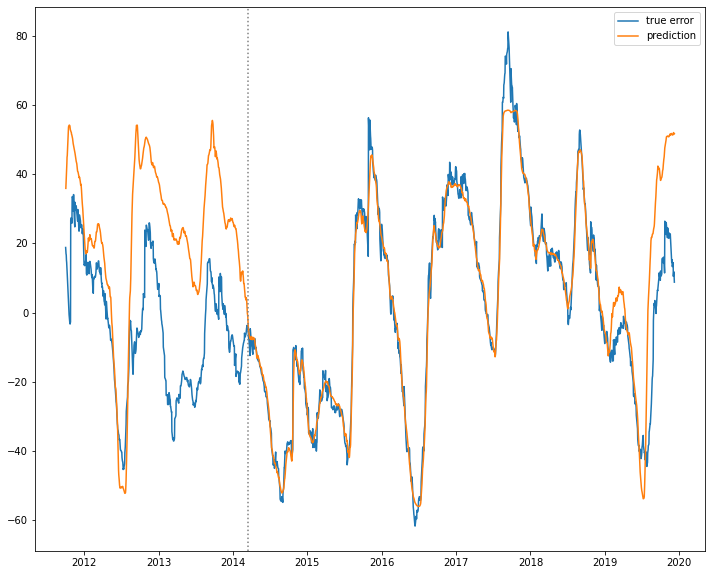

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA3.png


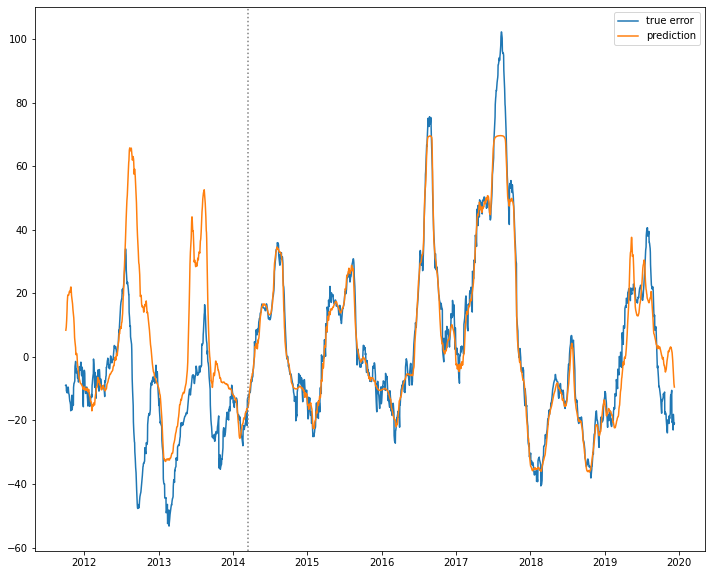

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA4.png


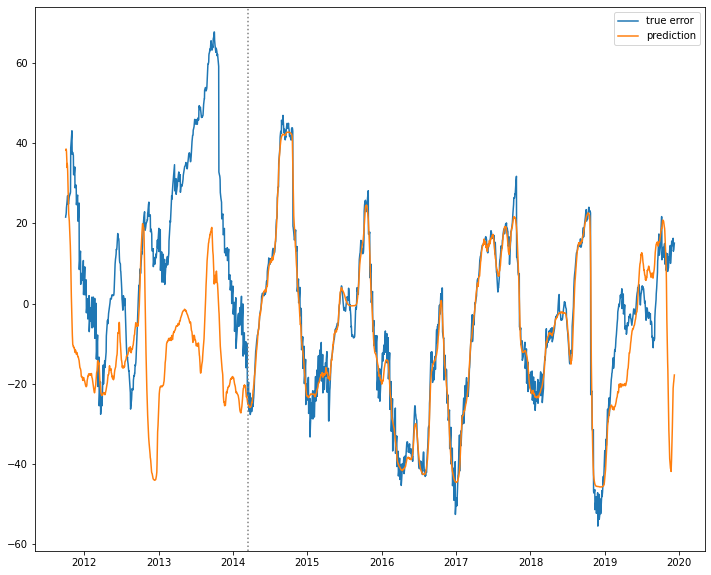

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA5.png


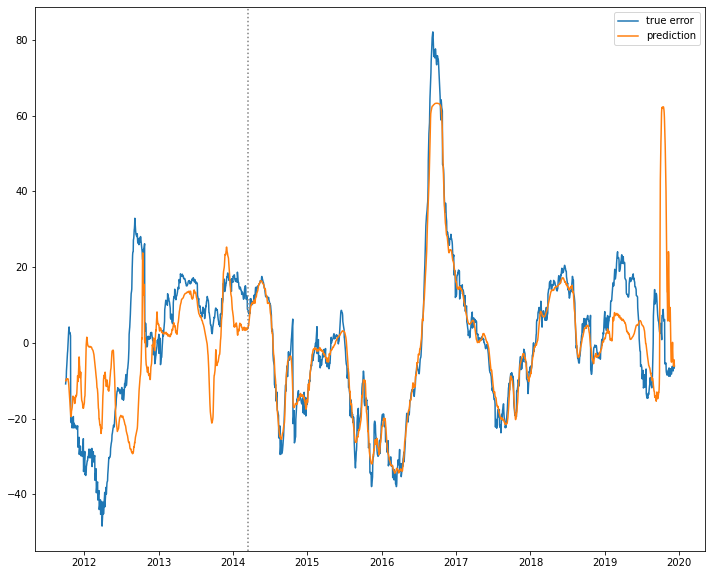

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA6.png


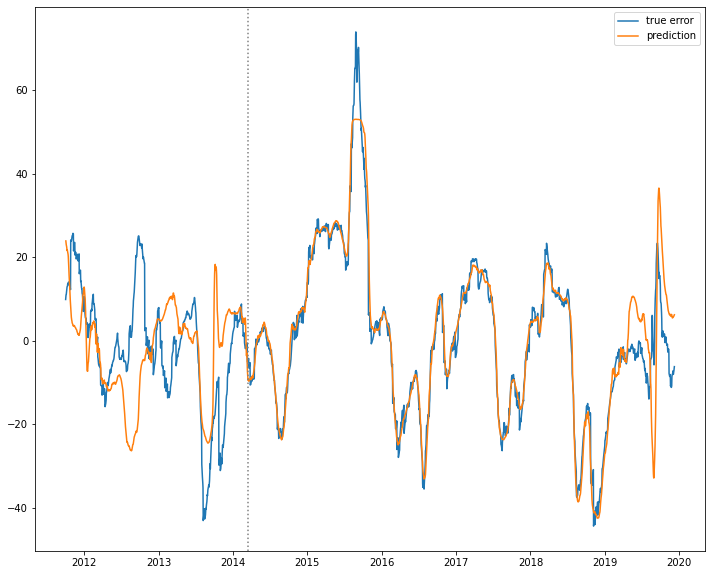

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_4_PCA7.png


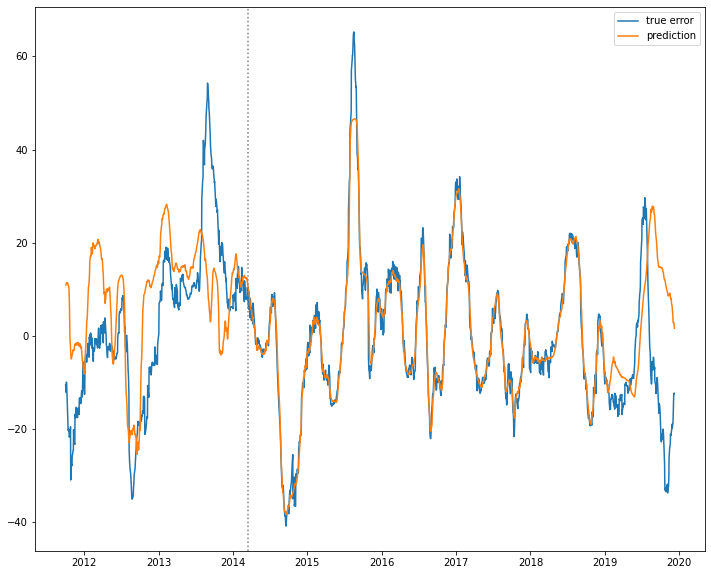

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA0.png


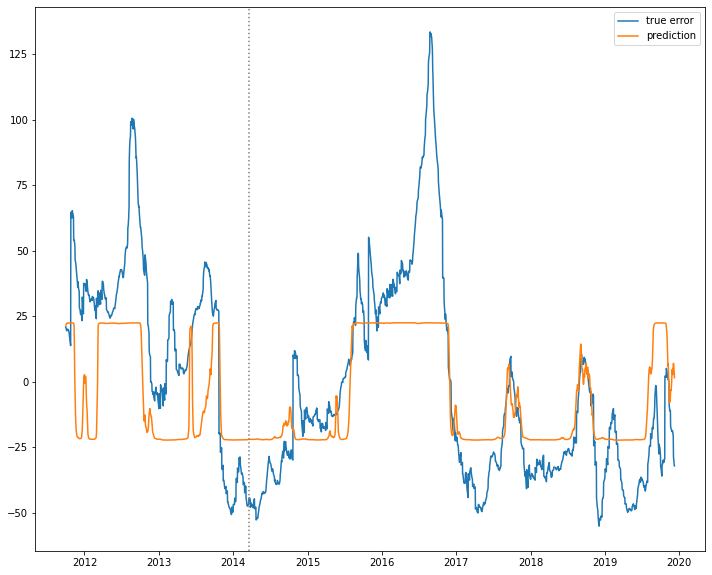

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA1.png


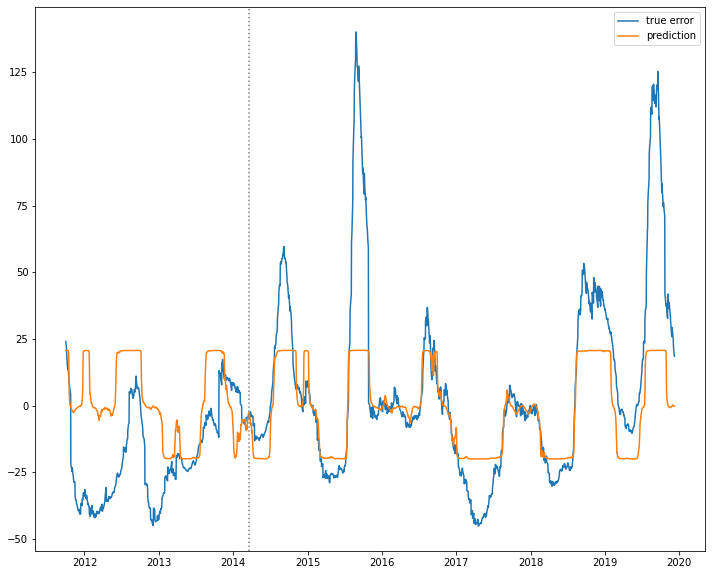

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA2.png


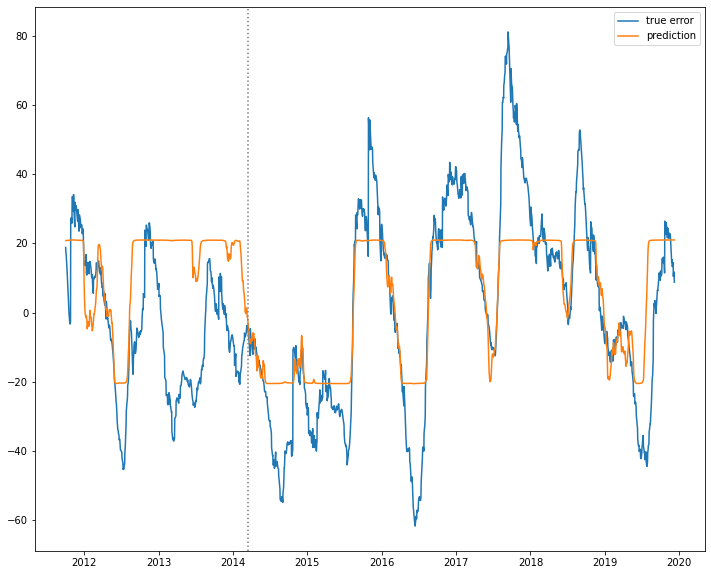

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA3.png


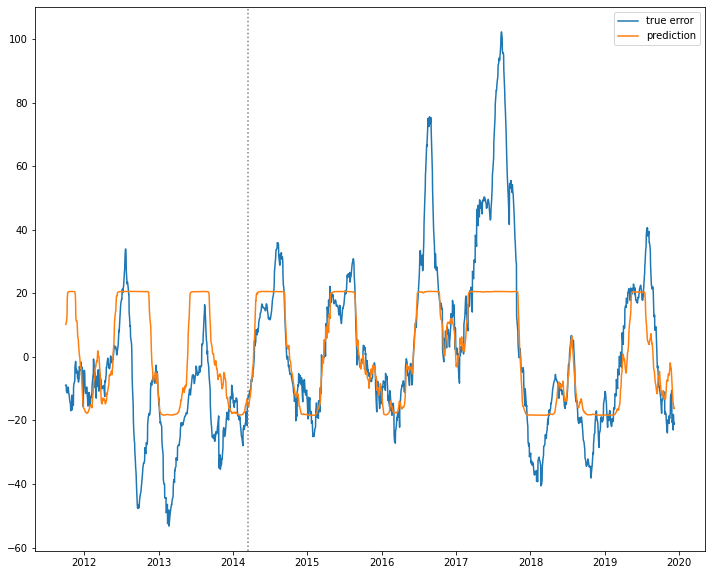

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA4.png


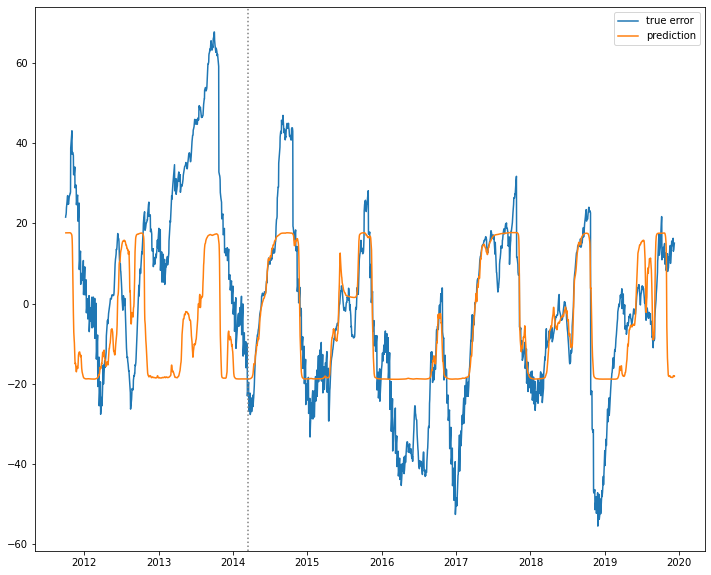

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA5.png


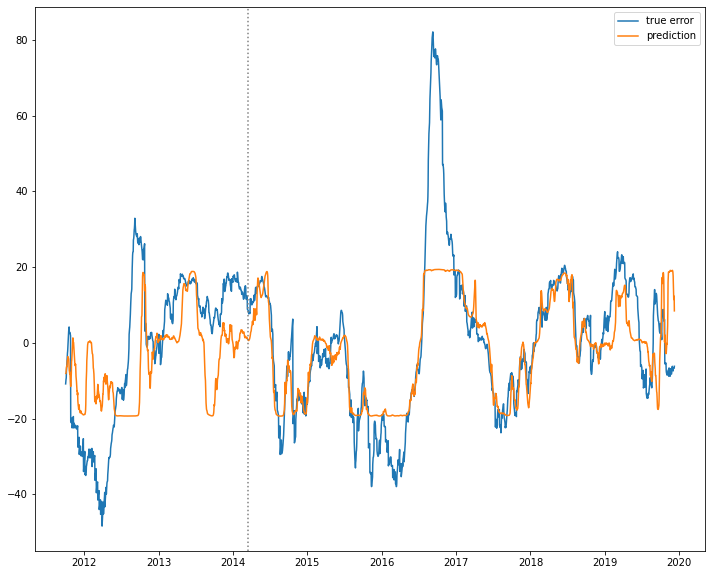

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA6.png


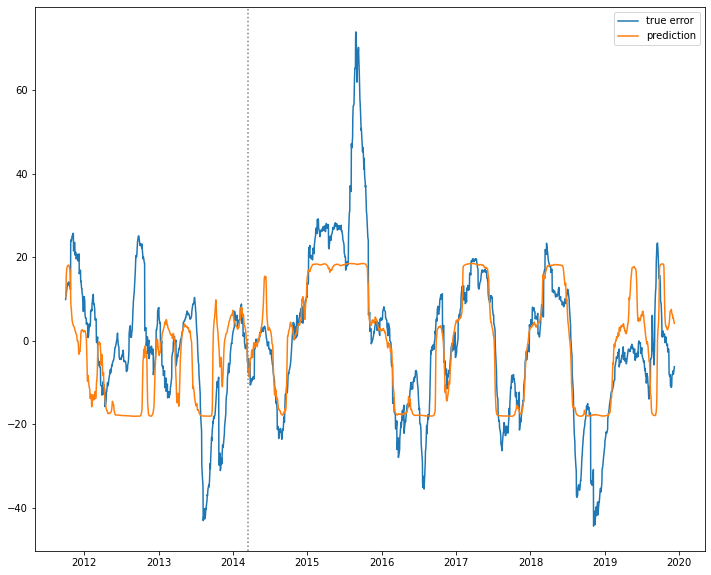

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA7.png


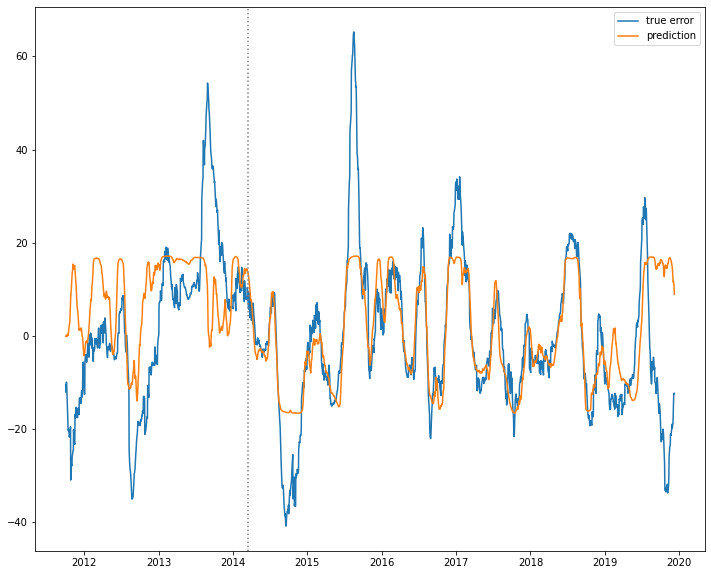

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA0.png


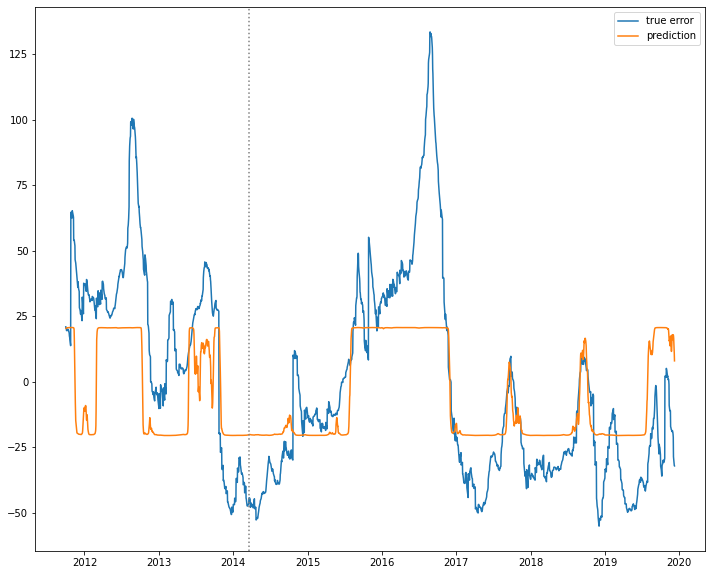

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA1.png


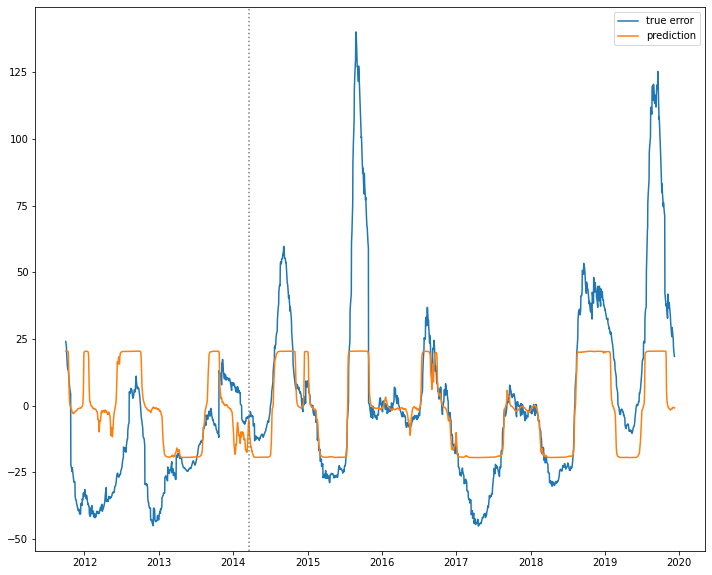

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA2.png


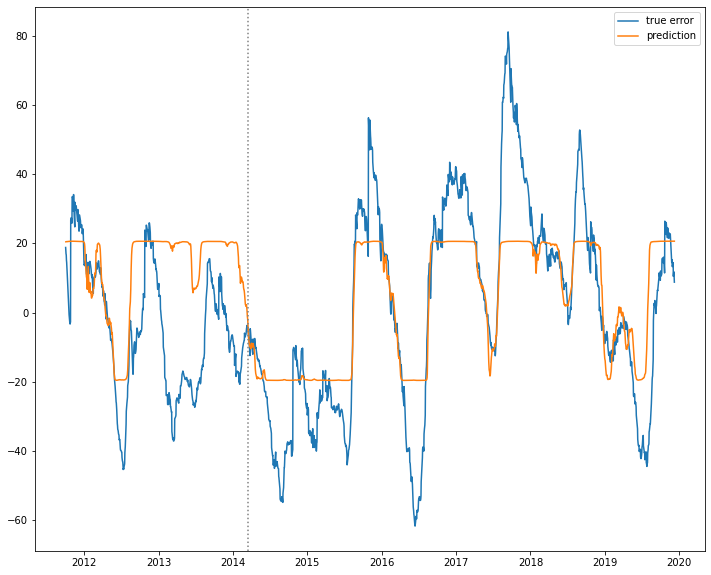

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA3.png


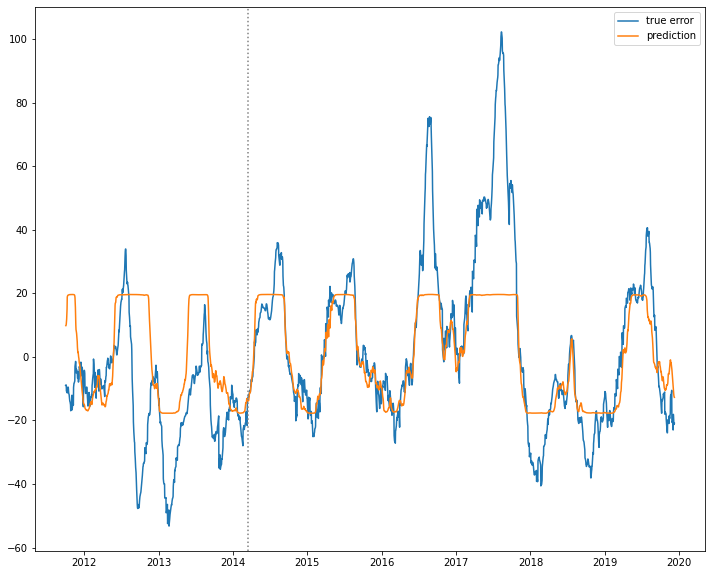

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA4.png


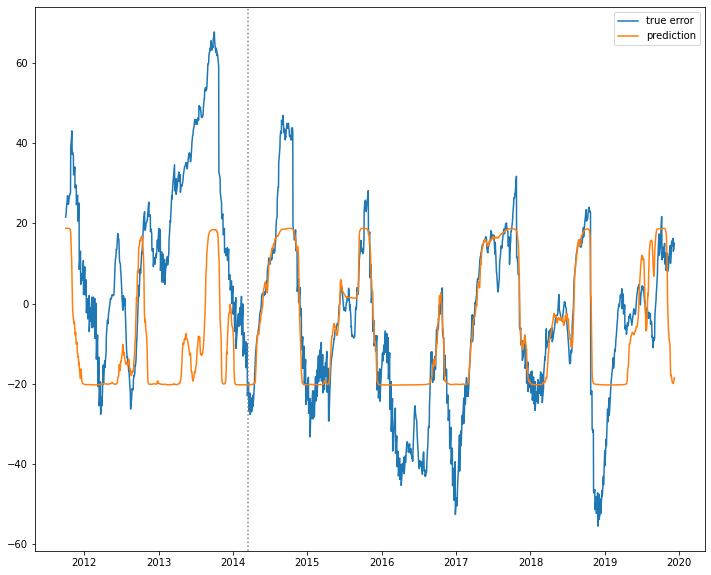

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA5.png


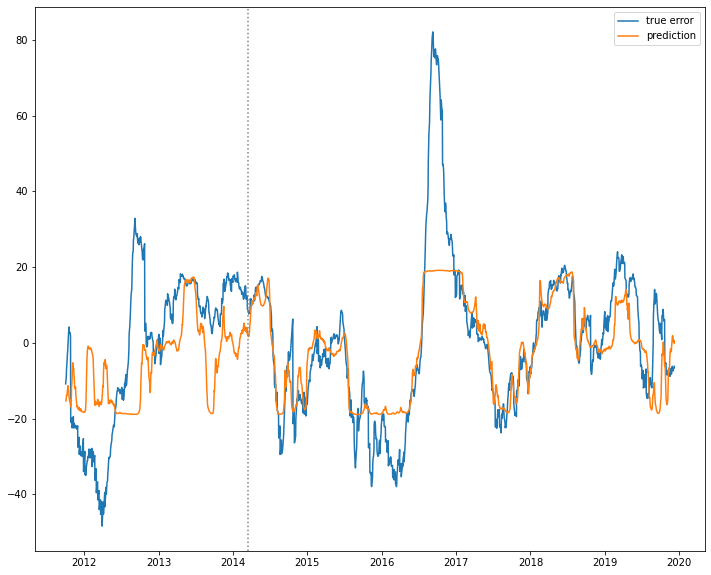

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA6.png


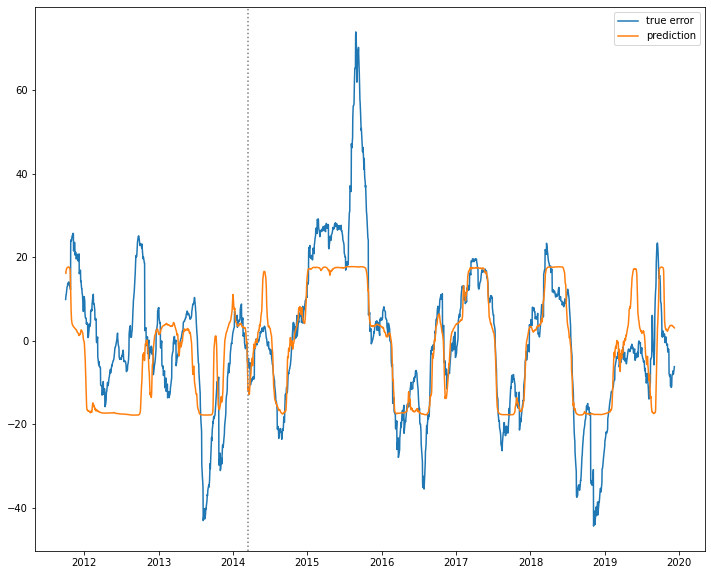

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA7.png


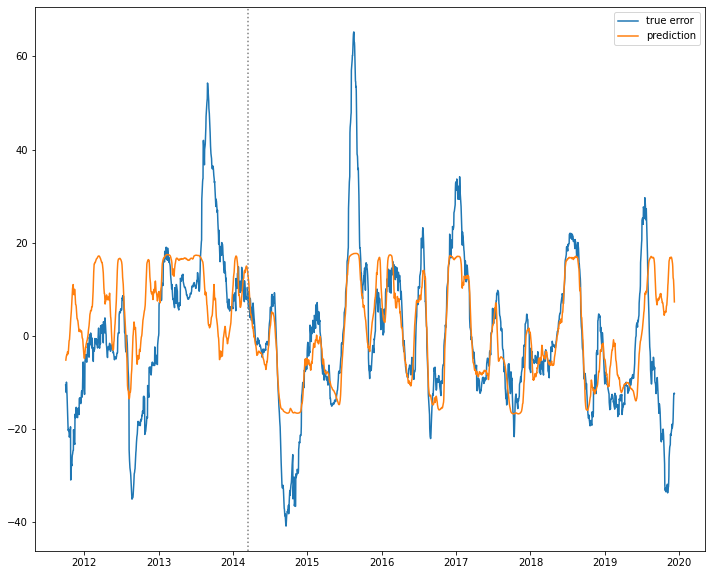

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA0.png


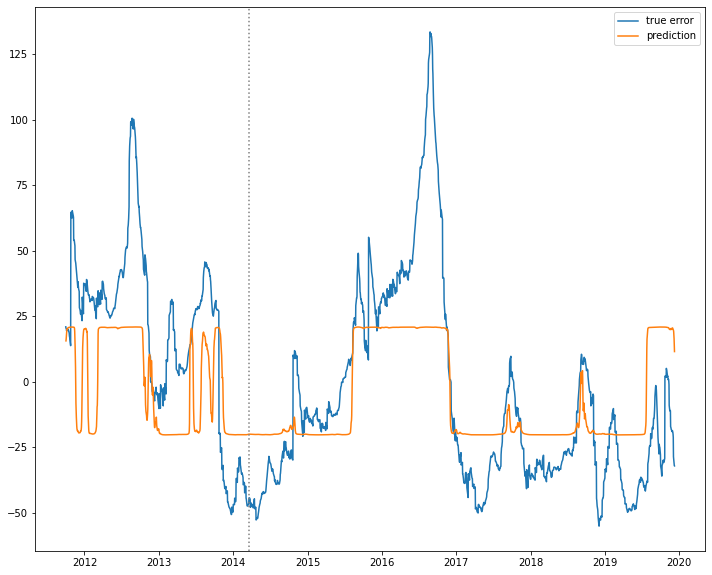

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA1.png


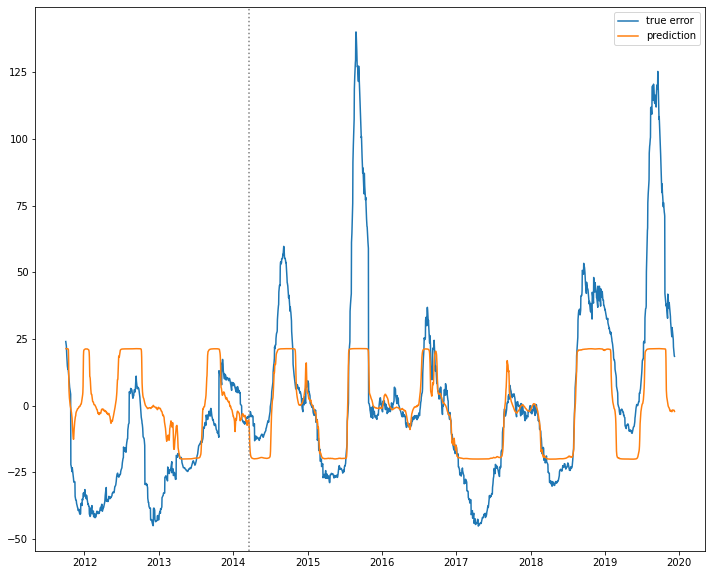

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA2.png


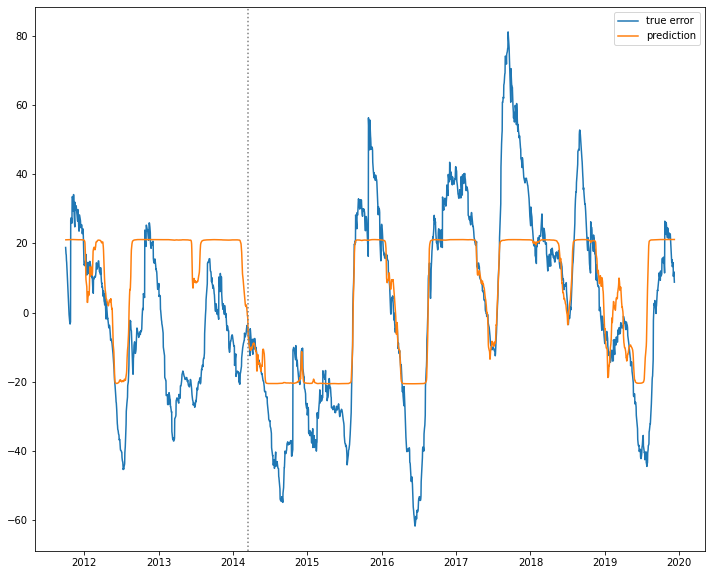

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA3.png


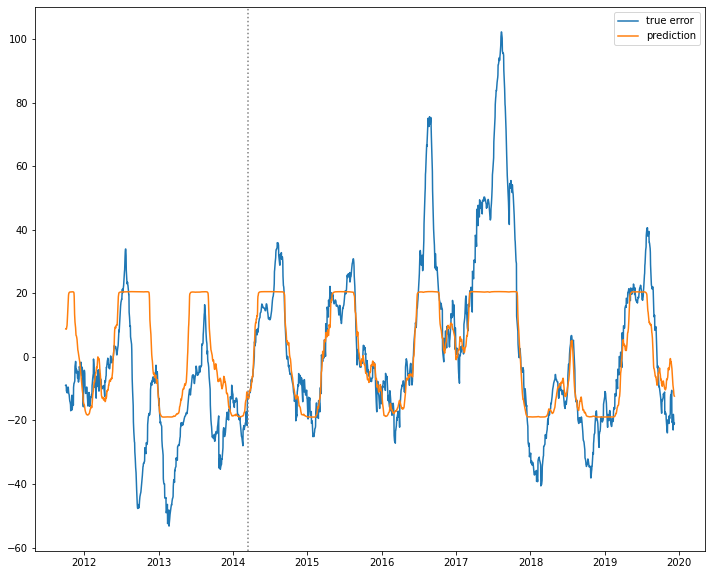

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA4.png


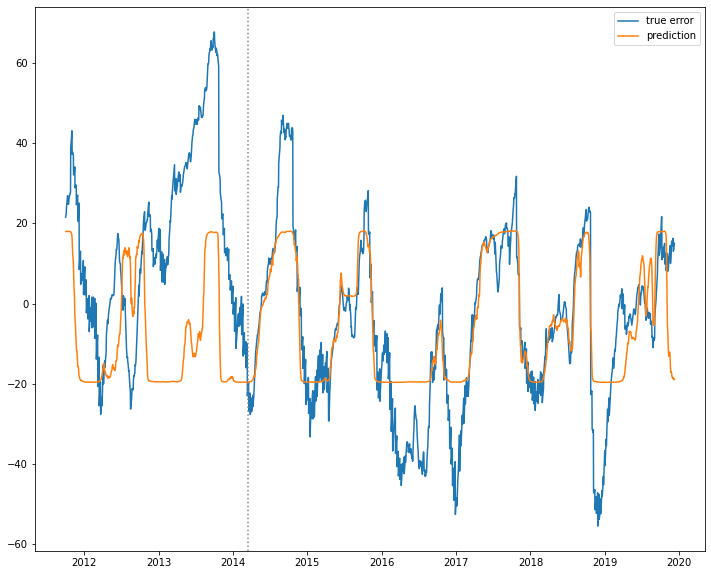

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA5.png


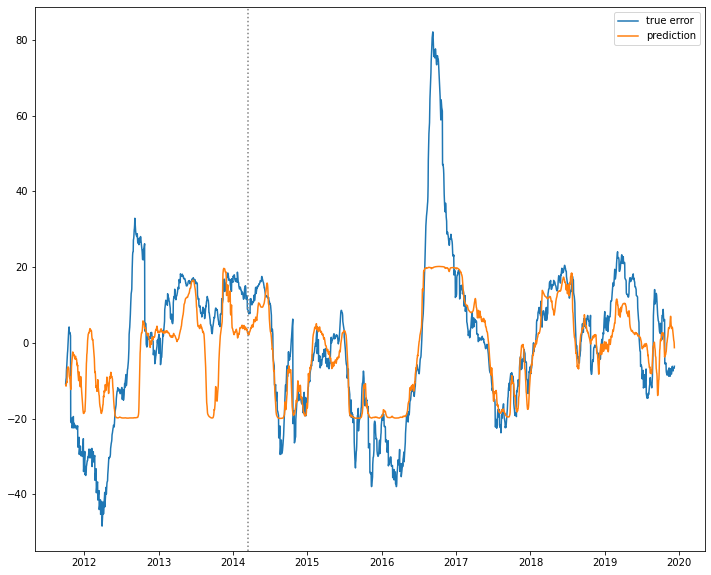

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA6.png


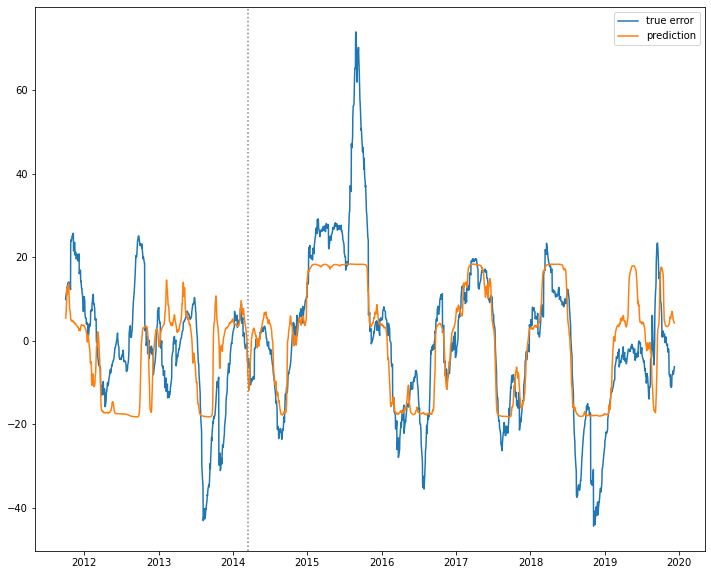

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_64_PCA7.png


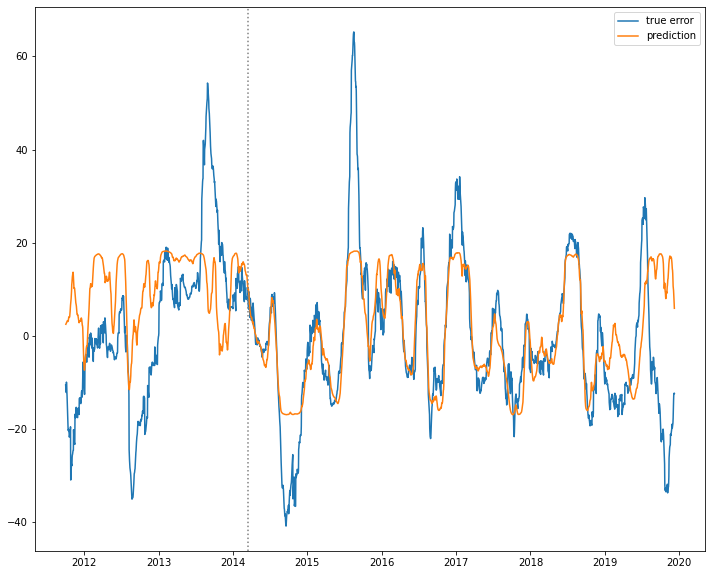

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA0.png


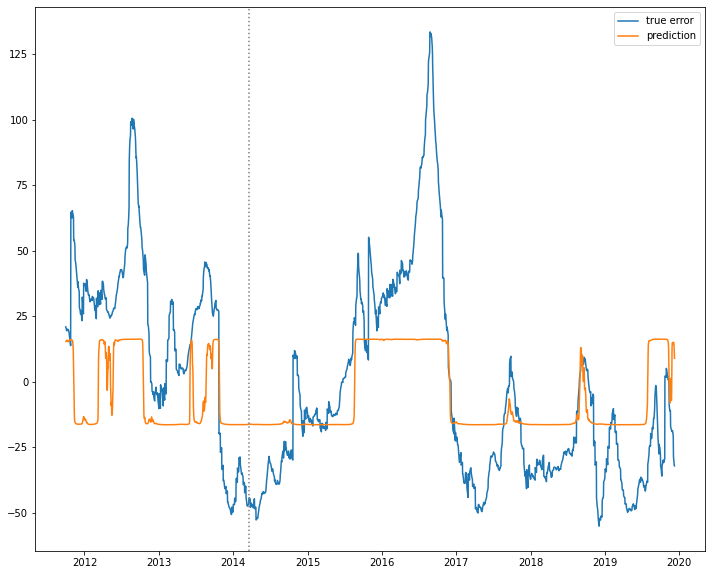

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA1.png


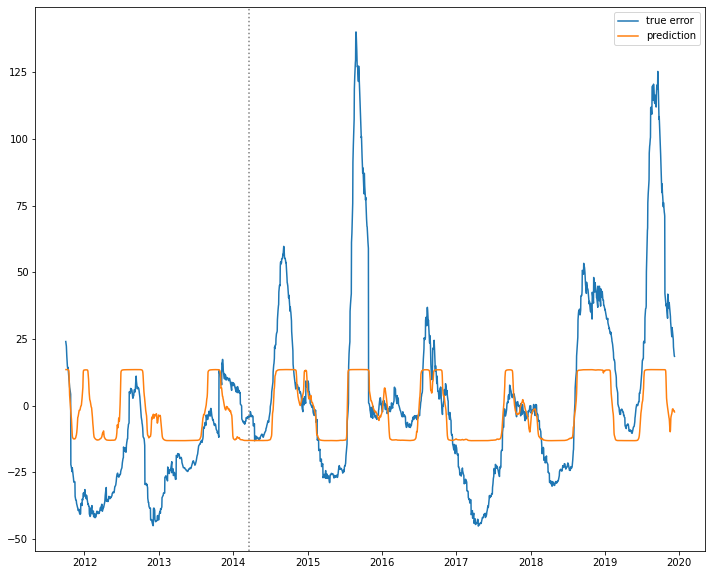

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA2.png


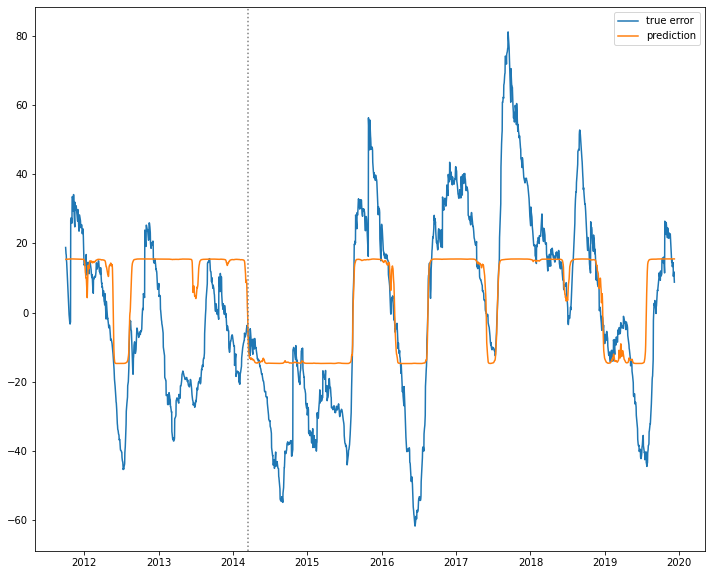

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA3.png


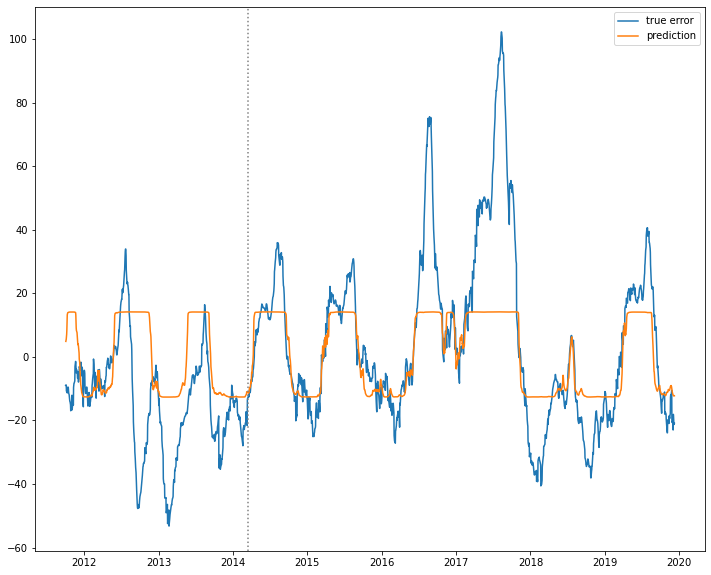

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA4.png


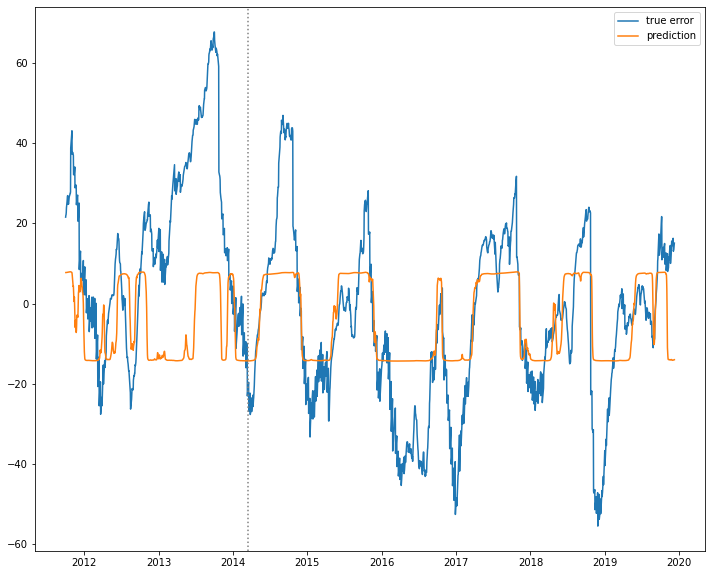

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA5.png


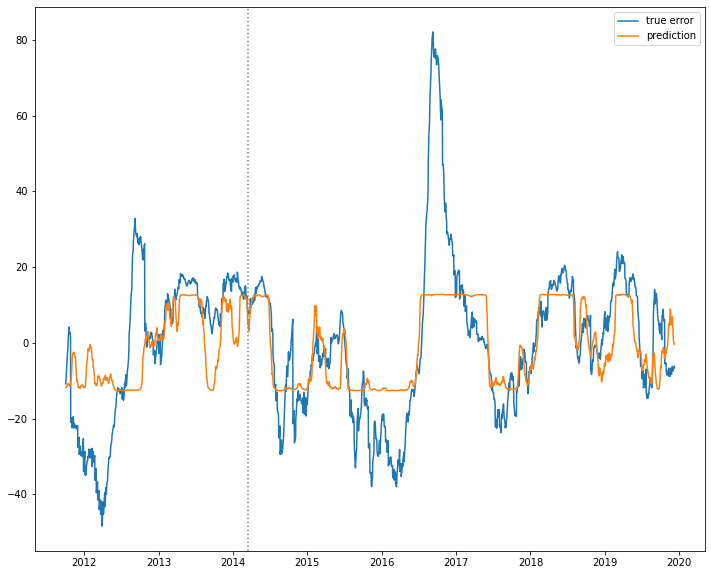

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA6.png


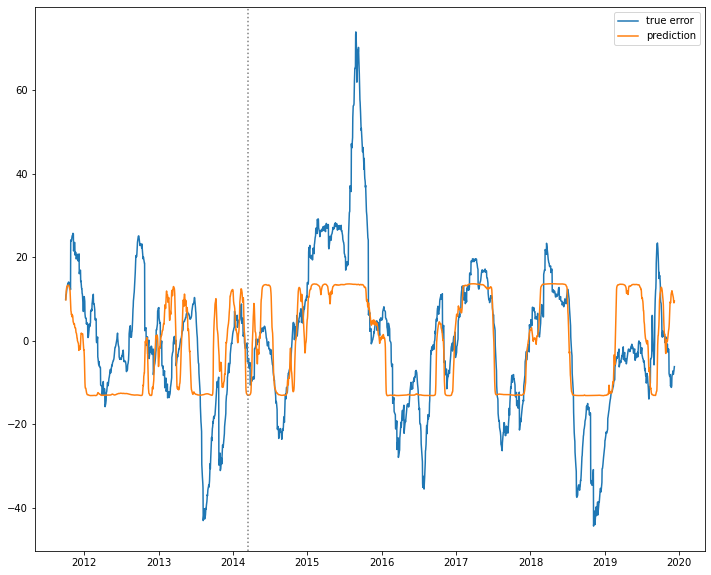

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA7.png


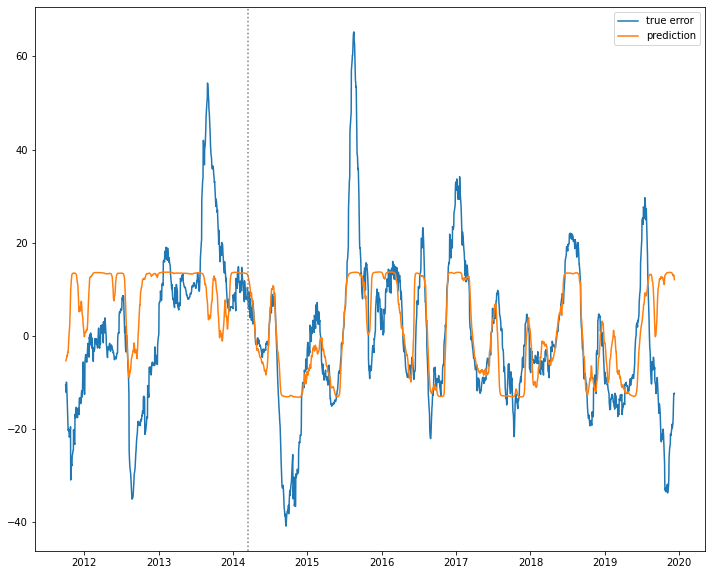

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA0.png


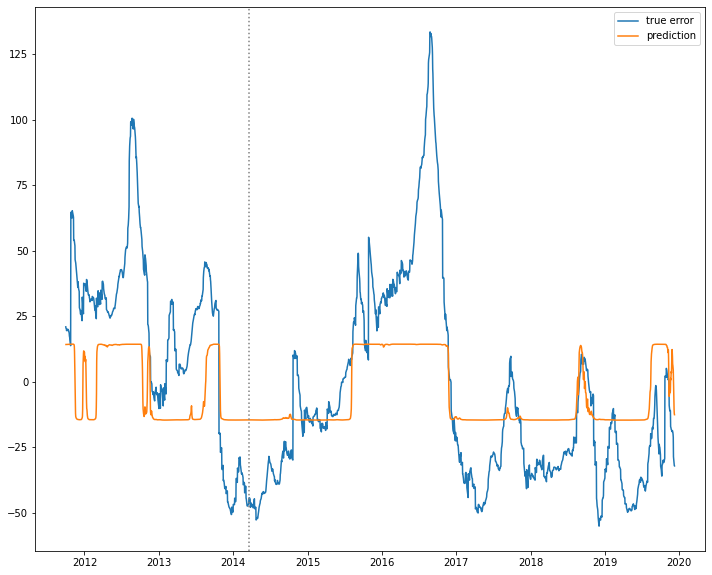

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA1.png


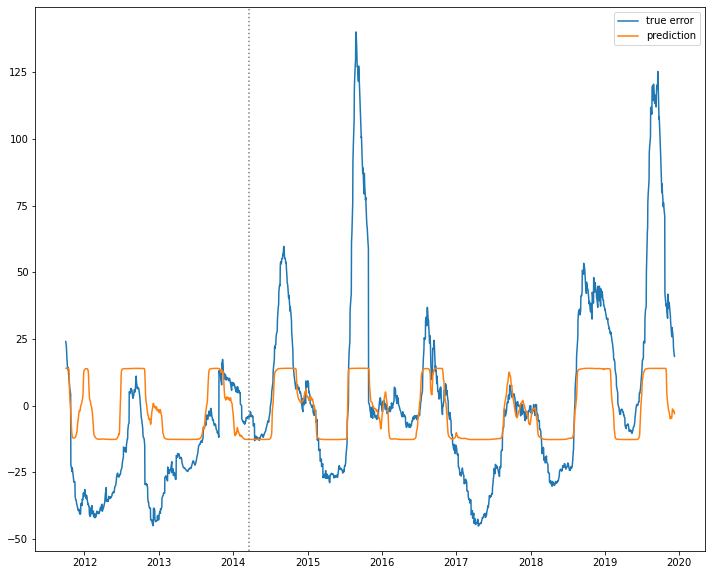

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA2.png


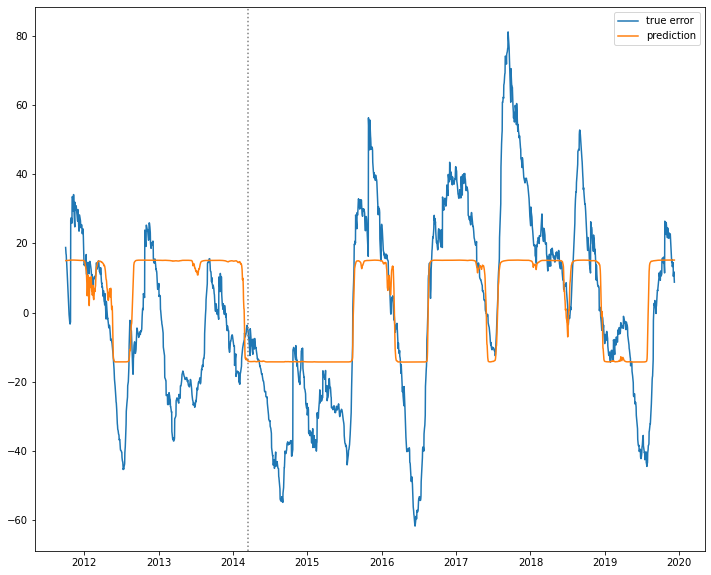

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA3.png


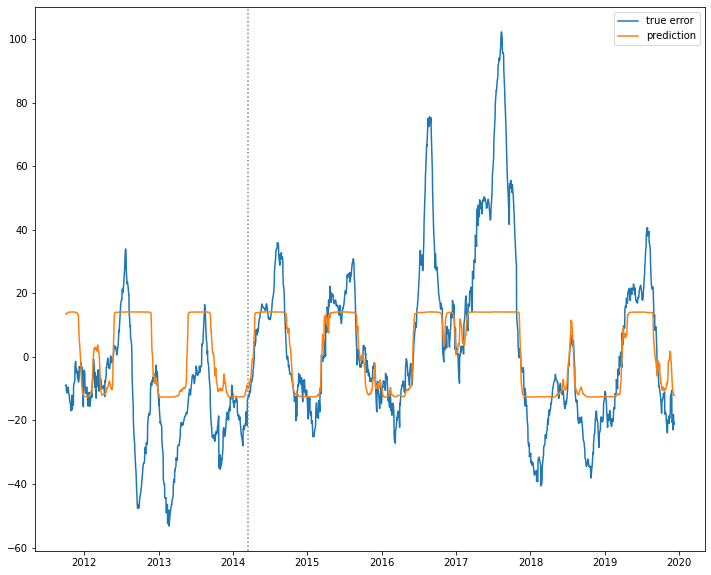

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA4.png


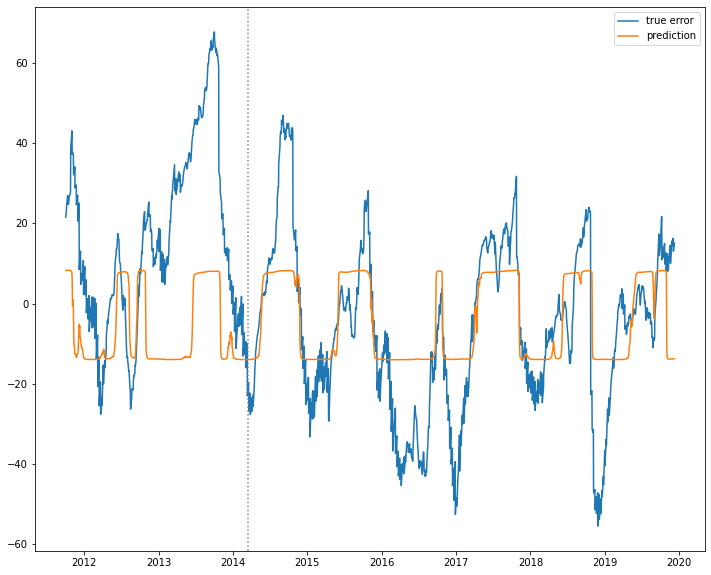

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA5.png


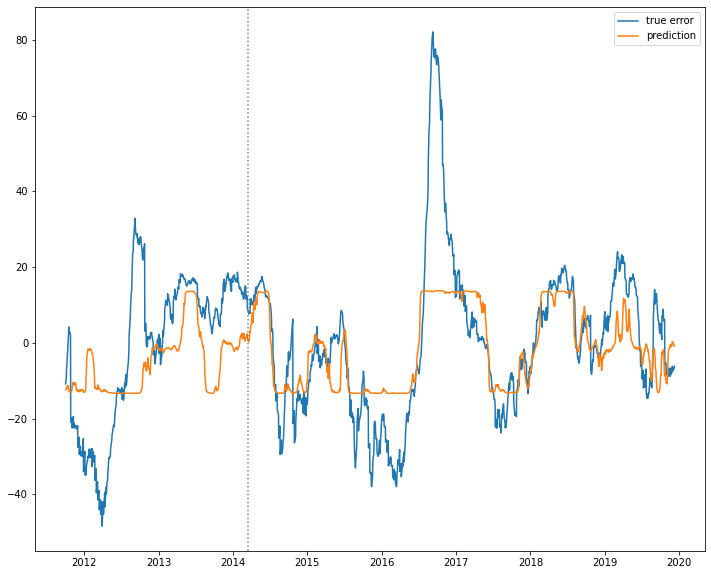

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA6.png


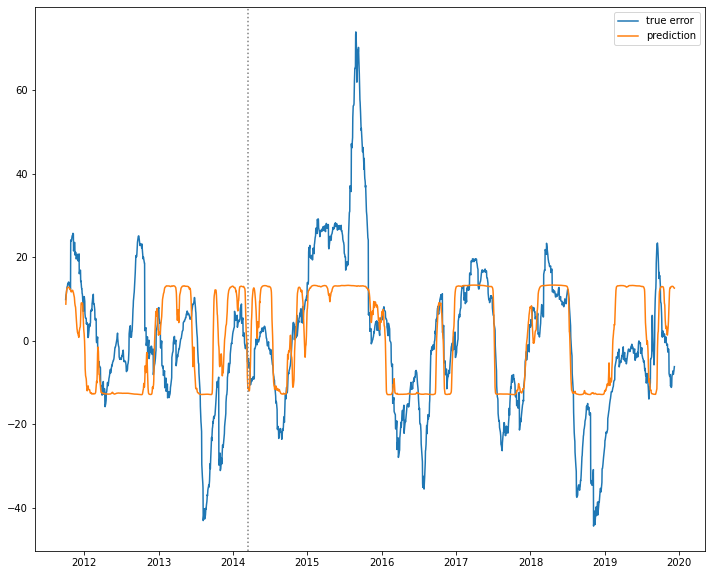

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA7.png


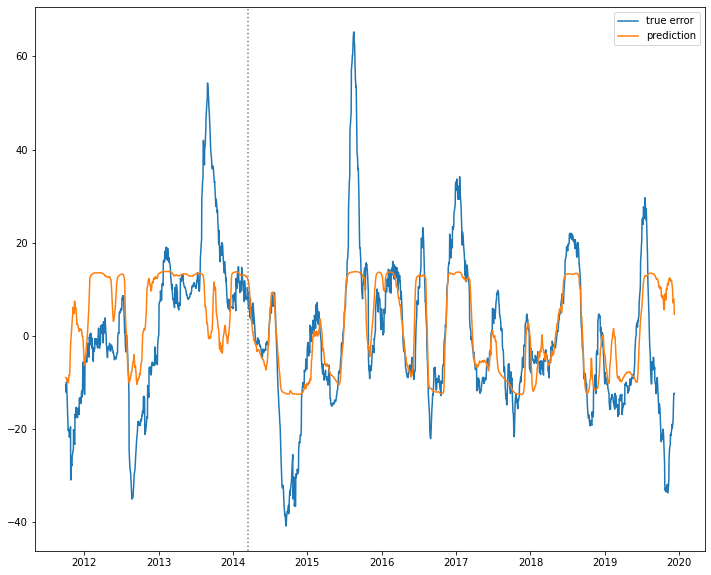

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA0.png


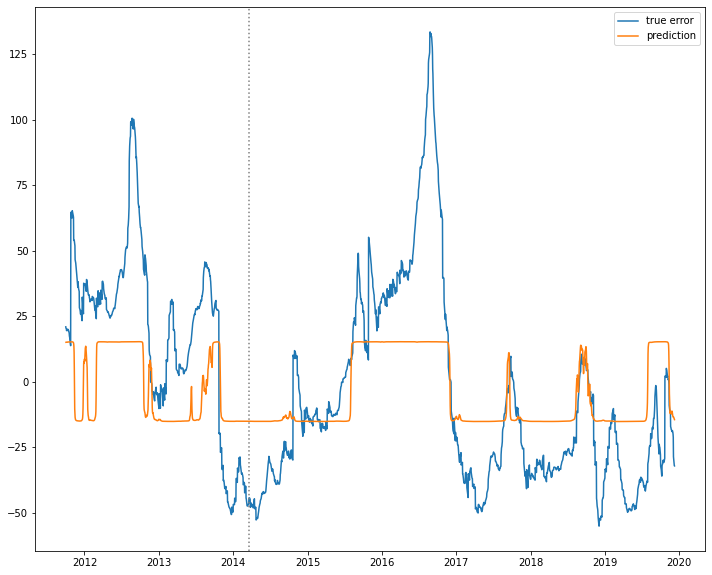

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA1.png


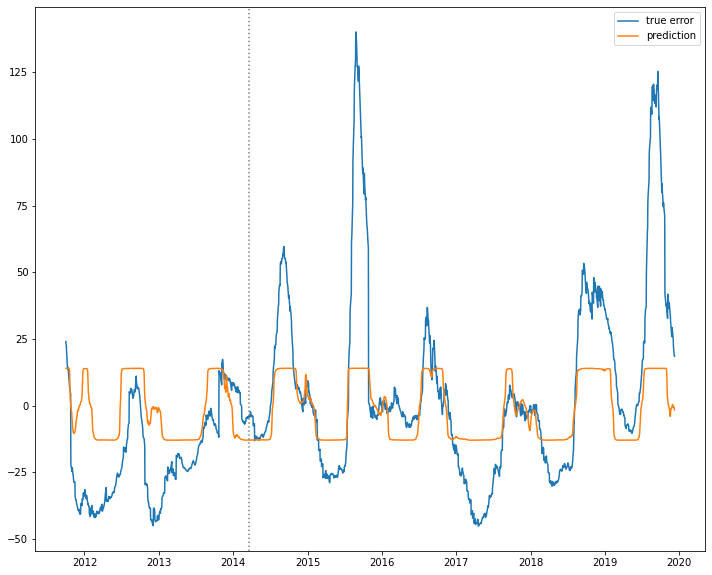

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA2.png


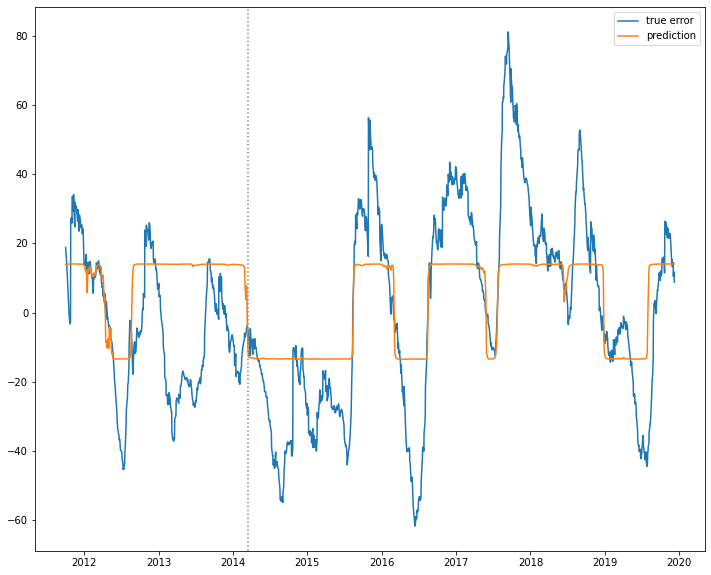

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA3.png


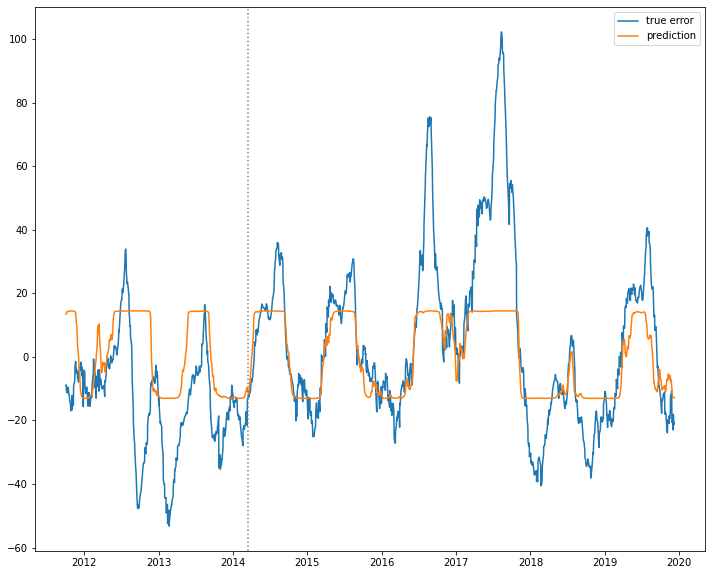

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA4.png


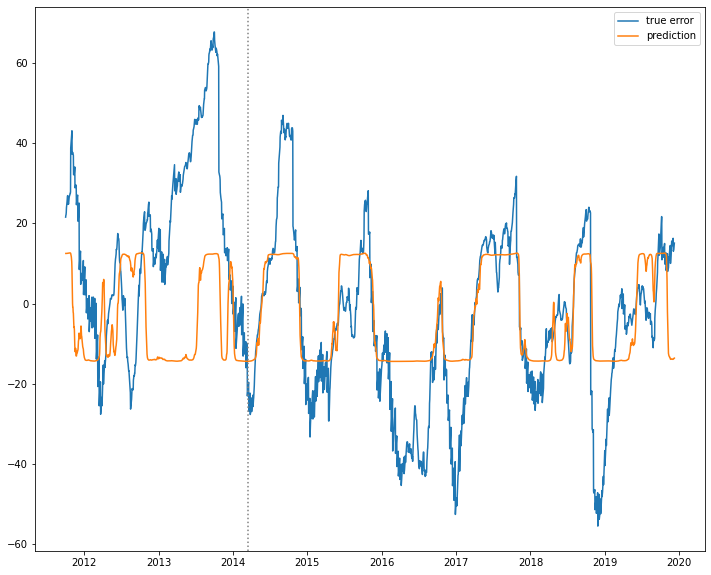

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 1s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA5.png


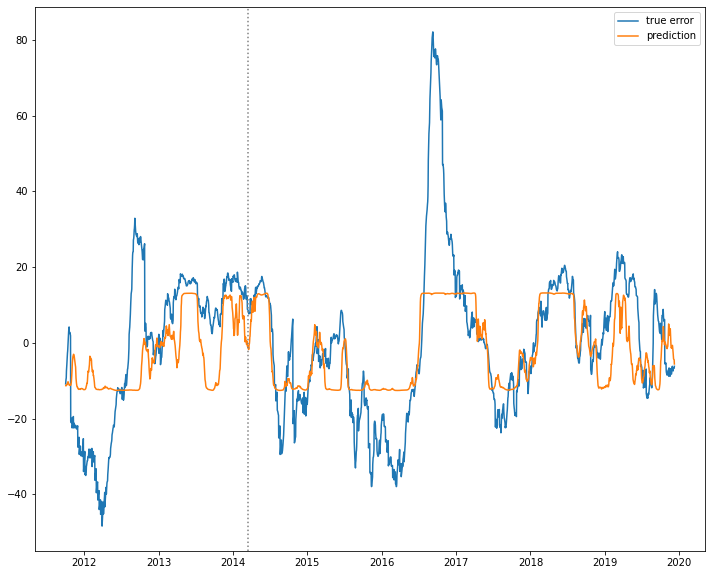

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA6.png


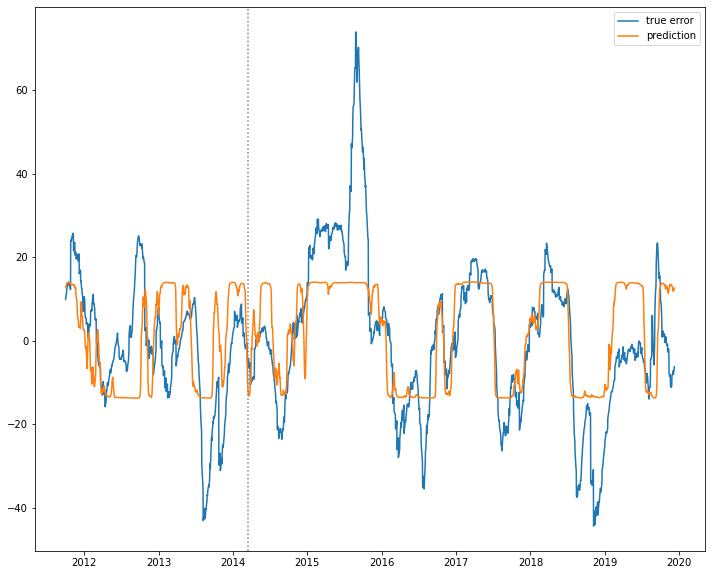

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_50_128_PCA7.png


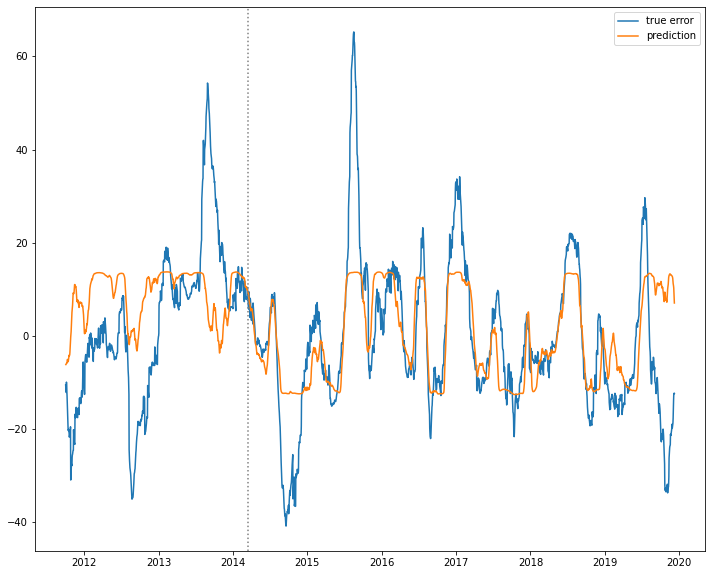

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA0.png


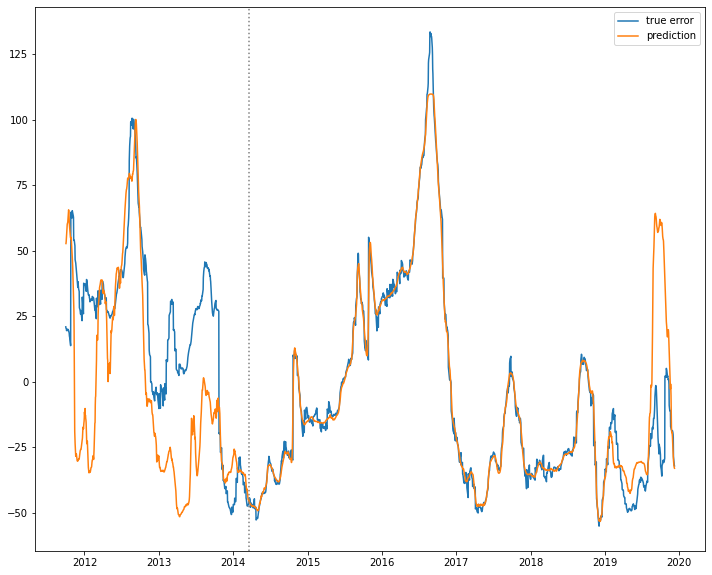

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA1.png


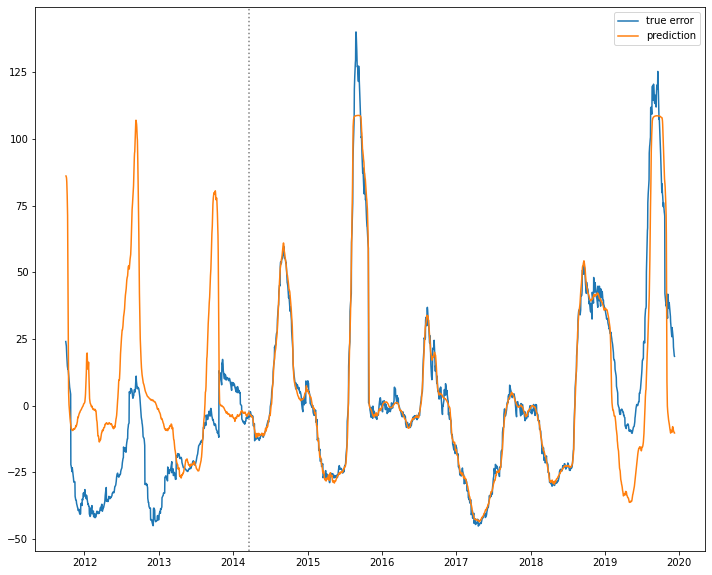

Working on PC2...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA2.png


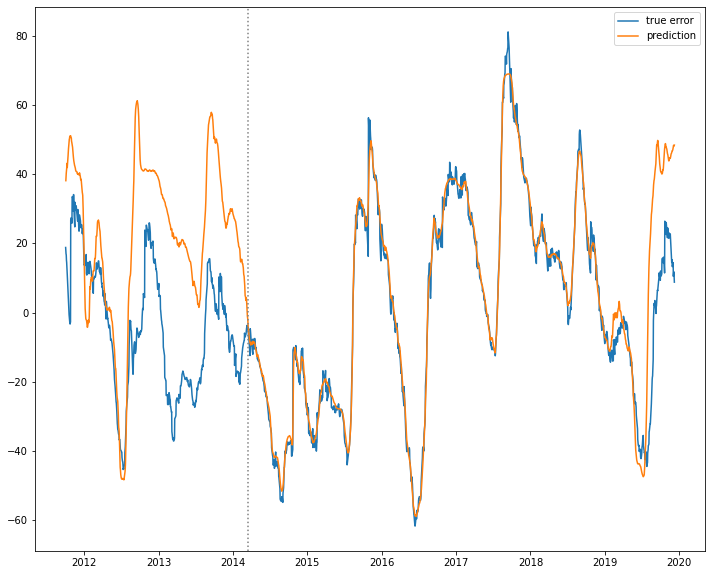

Working on PC3...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA3.png


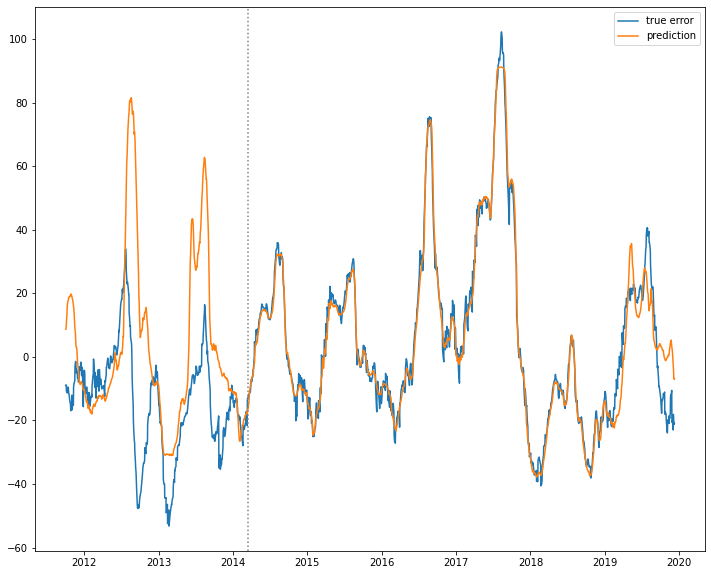

Working on PC4...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 3s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA4.png


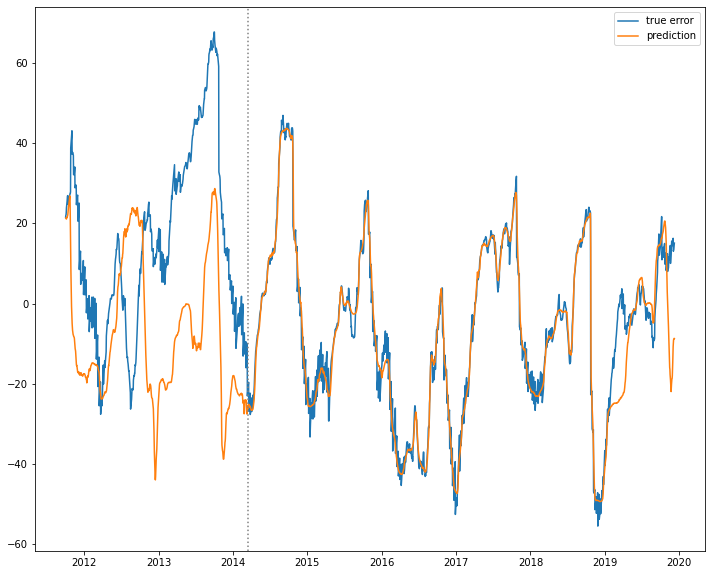

Working on PC5...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA5.png


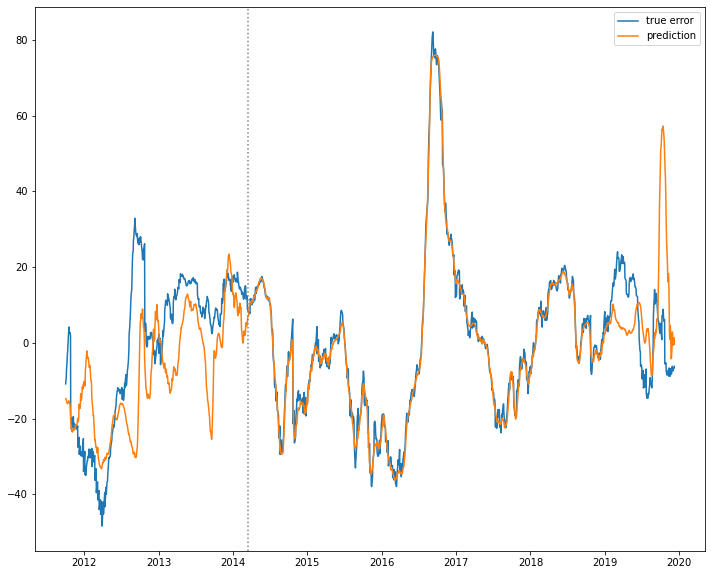

Working on PC6...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA6.png


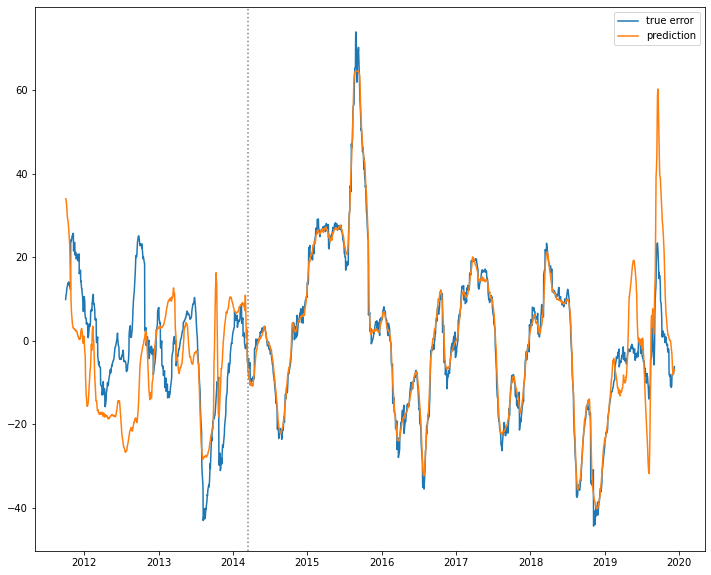

Working on PC7...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA7.png


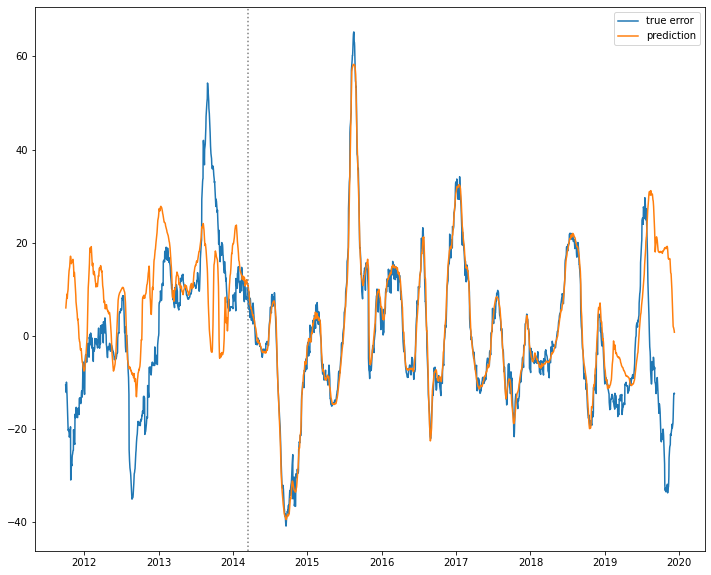

Working on PC0...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 2ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA0.png


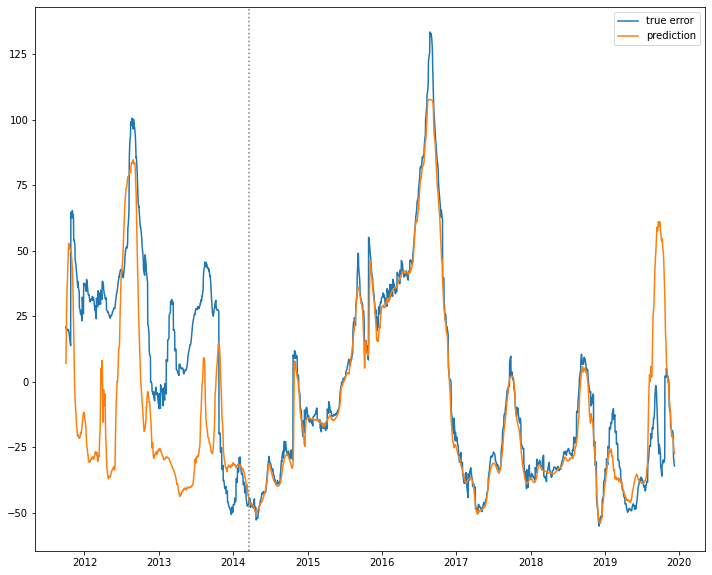

Working on PC1...
init
super init with func updated
Compiled !
Training finished !
94/94 [==============================] - 2s 3ms/step
Prediction finished !
Saved as : /nird/projects/nird/NS2993K/Leo/results/bin_fig/LSTM3_pred_100_4_PCA1.png


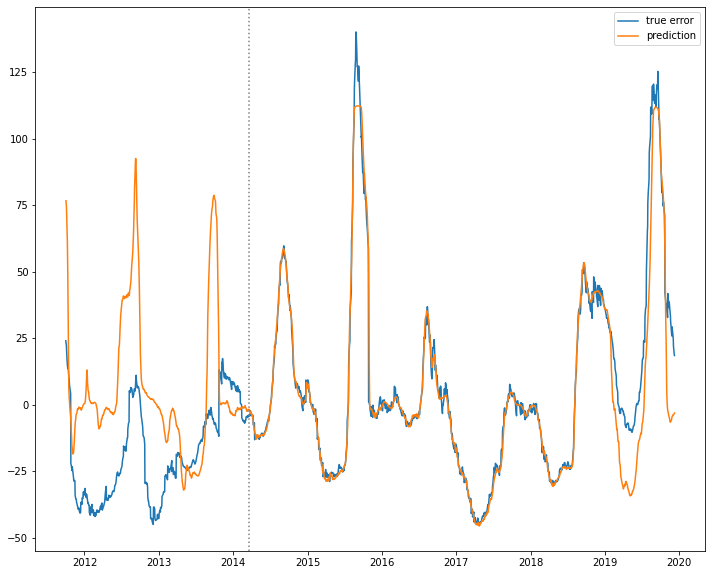

Working on PC2...
init
super init with func updated
Compiled !


KeyboardInterrupt: 

In [111]:
# for each PCA separatly
list_epochs = [50, 100, 200]
list_batch = [4, 64, 128]

for epo in list_epochs:
    for bat in list_batch:
        for reg in regularizers:
            for ipca in range(y.shape[1]):
                print(f'Working on PC{ipca}...')
                ds[0]['ytrain'] = fds[0]['ytrain'][:,ipca]
                ds[0]['ytest'] = fds[0]['ytest'][:,ipca]

                suffixe = f'_PCA{ipca}'
                n_output = ds[0]['ytrain'].shape[0]
                m4 = model_lstm.ModelLSTM(ds[0]['Xtrain'].shape[1], ds[0]['Xtrain'].shape[2], reg=reg, rootdir=rootdir)
                m4.compile_model('LSTM3')
                m4.fit(ds, epochs=epo, batch_size=bat, suffix=suffixe) 
                m4.predict(ds)

--------------

## AutoKeras TimeSeriesForecaster

Forecast only for new data of time serie after the original training data


i.e.: The prediction data requires the original training data to make predictions on subsequent data points

In [256]:
predict_from = 1
predict_until = 5000  # 10
lookback = 1
clf = ak.TimeseriesForecaster(
    lookback=lookback,
    predict_from=predict_from,
    predict_until=predict_until,
    max_trials=3,
    objective="val_loss",
    overwrite=True
)

In [257]:
# Train the TimeSeriesForecaster with train data
clf.fit(
    x=X_train,
    y=y_train,
    epochs=10,
    validation_split=0.2,
)

Trial 3 Complete [00h 00m 24s]
val_loss: 876.3943481445312

Best val_loss So Far: 501.4383239746094
Total elapsed time: 00h 01m 14s
INFO:tensorflow:Oracle triggered exit


INFO:tensorflow:Oracle triggered exit


Epoch 1/10
76/76 [==============================] - 8s 8ms/step - loss: 2492.6155 - mean_squared_error: 2492.6155
Epoch 2/10
76/76 [==============================] - 1s 7ms/step - loss: 1897.7666 - mean_squared_error: 1897.7666
Epoch 3/10
76/76 [==============================] - 1s 7ms/step - loss: 1644.5204 - mean_squared_error: 1644.5204
Epoch 4/10
76/76 [==============================] - 1s 7ms/step - loss: 1523.9348 - mean_squared_error: 1523.9348
Epoch 5/10
76/76 [==============================] - 1s 7ms/step - loss: 1469.0559 - mean_squared_error: 1469.0559
Epoch 6/10
76/76 [==============================] - 1s 8ms/step - loss: 1457.0565 - mean_squared_error: 1457.0565
Epoch 7/10
76/76 [==============================] - 1s 8ms/step - loss: 1461.3578 - mean_squared_error: 1461.3578
Epoch 8/10
76/76 [==============================] - 1s 8ms/step - loss: 1398.0188 - mean_squared_error: 1398.0188
Epoch 9/10
76/76 [==============================] - 1s 7ms/step - loss: 1457.5286 - mean

INFO:tensorflow:Assets written to: ./time_series_forecaster/best_model/assets


INFO:tensorflow:Assets written to: ./time_series_forecaster/best_model/assets


In [258]:
predi_y = clf.predict(X_test)

95/95 [==============================] - 1s 6ms/step


In [259]:
predi_y.shape

(602, 1)

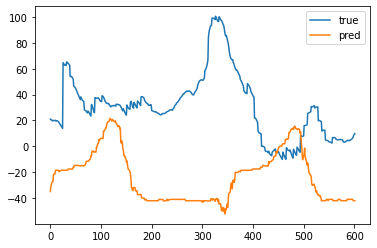

In [260]:
plt.plot(y[:602,0], label='true')
plt.plot(predi_y, label='pred')
plt.legend()

In [244]:
model = clf.export_model()
model.summary()